### Question 1

In [2]:
# Importing all the necessary libraries
import pandas as pd 
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
df_IND = pd.read_csv(r'C:\Users\ADMIN\Downloads\Global Power plant database\database_IND.csv')
df_AUS = pd.read_csv(r'C:\Users\ADMIN\Downloads\Global Power plant database\database_AUS.csv')
df_USA = pd.read_csv(r'C:\Users\ADMIN\Downloads\Global Power plant database\database_USA.csv')

In [4]:
columns_IND = set(df_IND.columns)
columns_AUS = set(df_AUS.columns)
columns_USA = set(df_USA.columns)

In [5]:
all_columns = columns_USA | columns_IND | columns_AUS
all_columns

{'capacity_mw',
 'commissioning_year',
 'country',
 'country_long',
 'estimated_generation_gwh',
 'generation_data_source',
 'generation_gwh_2013',
 'generation_gwh_2014',
 'generation_gwh_2015',
 'generation_gwh_2016',
 'generation_gwh_2017',
 'generation_gwh_2018',
 'generation_gwh_2019',
 'geolocation_source',
 'gppd_idnr',
 'latitude',
 'longitude',
 'name',
 'other_fuel1',
 'other_fuel2',
 'other_fuel3',
 'owner',
 'primary_fuel',
 'source',
 'url',
 'wepp_id',
 'year_of_capacity_data'}

In [6]:
common_columns = columns_AUS & columns_IND & columns_USA
common_columns

{'capacity_mw',
 'commissioning_year',
 'country',
 'country_long',
 'estimated_generation_gwh',
 'generation_data_source',
 'generation_gwh_2013',
 'generation_gwh_2014',
 'generation_gwh_2015',
 'generation_gwh_2016',
 'generation_gwh_2017',
 'generation_gwh_2018',
 'generation_gwh_2019',
 'geolocation_source',
 'gppd_idnr',
 'latitude',
 'longitude',
 'name',
 'other_fuel1',
 'other_fuel2',
 'other_fuel3',
 'owner',
 'primary_fuel',
 'source',
 'url',
 'wepp_id',
 'year_of_capacity_data'}

In [7]:
non_common_columns = all_columns - common_columns
non_common_columns

set()

In [8]:
non_common_IND = columns_IND - common_columns
non_common_AUS = columns_AUS - common_columns
non_common_USA = columns_USA - common_columns
print(f"Non-common columns in df_IND: {non_common_IND}")
print(f"Non-common columns in df_AUS: {non_common_AUS}")
print(f"Non-common columns in df_USA: {non_common_USA}")

Non-common columns in df_IND: set()
Non-common columns in df_AUS: set()
Non-common columns in df_USA: set()


In [9]:
df_AUS.columns.to_series().groupby(df_AUS.dtypes).groups

{float64: ['capacity_mw', 'latitude', 'longitude', 'other_fuel1', 'other_fuel2', 'other_fuel3', 'commissioning_year', 'wepp_id', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'generation_gwh_2019', 'estimated_generation_gwh'], object: ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel', 'owner', 'source', 'url', 'geolocation_source', 'generation_data_source']}

In [10]:
df_IND.columns.to_series().groupby(df_IND.dtypes).groups

{float64: ['capacity_mw', 'latitude', 'longitude', 'other_fuel3', 'commissioning_year', 'wepp_id', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'estimated_generation_gwh'], object: ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel', 'other_fuel1', 'other_fuel2', 'owner', 'source', 'url', 'geolocation_source', 'generation_gwh_2019', 'generation_data_source']}

In [11]:
df_USA.columns.to_series().groupby(df_USA.dtypes).groups

{float64: ['capacity_mw', 'latitude', 'longitude', 'commissioning_year', 'wepp_id', 'year_of_capacity_data', 'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018', 'generation_gwh_2019', 'estimated_generation_gwh'], object: ['country', 'country_long', 'name', 'gppd_idnr', 'primary_fuel', 'other_fuel1', 'other_fuel2', 'other_fuel3', 'owner', 'source', 'url', 'geolocation_source', 'generation_data_source']}

In [12]:
df = pd.concat([df_AUS, df_IND, df_USA], ignore_index=True)
df

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,AUS0000433,0.11,-34.9387,138.5377,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,AUS0000432,1.00,-34.9453,138.5882,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,AUS0000065,21.60,-35.0641,117.7977,Wind,NaN,NaN,...,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,92.682222,NaN,Australia Clean Energy Regulator,NaN
3,AUS,Australia,Alice Springs Airport,AUS0000469,0.24,-23.7966,133.8971,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,AUS0000231,4.00,-34.5509,138.7659,Oil,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13293,USA,United States of America,Zotos International WPGF,USA0057648,3.40,42.8869,-76.9683,Wind,NaN,NaN,...,2019.0,3.671000,2.460150,2.489000,1.670000,1.233490,2.630000,1.211,U.S. Energy Information Administration,NaN
13294,USA,United States of America,Zumbro Community Solar Garden,USA0061574,1.00,44.3195,-92.6703,Solar,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,1.161000,1.589,U.S. Energy Information Administration,NaN
13295,USA,United States of America,Zumbro Solar Garden,USA0063426,0.00,44.0460,-92.7600,NaN,NaN,NaN,...,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13296,USA,United States of America,Zuni,USA0000478,0.00,39.7373,-105.0170,NaN,NaN,NaN,...,2019.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,U.S. Energy Information Administration,NaN


In [13]:
df.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',
       'generation_gwh_2019', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13298 entries, 0 to 13297
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   13298 non-null  object 
 1   country_long              13298 non-null  object 
 2   name                      13298 non-null  object 
 3   gppd_idnr                 13298 non-null  object 
 4   capacity_mw               13292 non-null  float64
 5   latitude                  13220 non-null  float64
 6   longitude                 13220 non-null  float64
 7   primary_fuel              11294 non-null  object 
 8   other_fuel1               1628 non-null   object 
 9   other_fuel2               270 non-null    object 
 10  other_fuel3               92 non-null     object 
 11  commissioning_year        10654 non-null  float64
 12  owner                     12705 non-null  object 
 13  source                    13298 non-null  object 
 14  url   

  country country_long                   name  capacity_mw primary_fuel  \
0     AUS    Australia       Adelaide Airport         0.11        Solar   
1     AUS    Australia   Adelaide Showgrounds         1.00        Solar   
2     AUS    Australia       Albany Wind Farm        21.60         Wind   
3     AUS    Australia  Alice Springs Airport         0.24        Solar   
4     AUS    Australia           Amcor Gawler         4.00          Oil   

  other_fuel1 other_fuel2 other_fuel3  commissioning_year  \
0         NaN         NaN         NaN              2011.0   
1         NaN         NaN         NaN                 NaN   
2         NaN         NaN         NaN                 NaN   
3         NaN         NaN         NaN              2004.0   
4         NaN         NaN         NaN              2015.0   

   year_of_capacity_data  generation_gwh_2013  generation_gwh_2014  \
0                 2019.0                  NaN                  NaN   
1                 2019.0                  

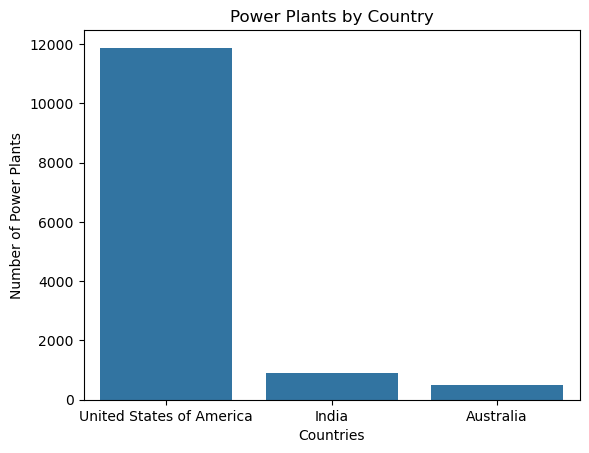

In [15]:
# Assuming df is your DataFrame already loaded

selected_columns = [
    'country',
    'country_long',
    'name',
    'capacity_mw',
    'primary_fuel',
    'other_fuel1',
    'other_fuel2',
    'other_fuel3',
    'commissioning_year',
    'year_of_capacity_data',
    'generation_gwh_2013',
    'generation_gwh_2014',
    'generation_gwh_2015',
    'generation_gwh_2016',
    'generation_gwh_2017',
    'estimated_generation_gwh'
]

# Check for existing columns
existing_columns = [col for col in selected_columns if col in df.columns]

# Print missing columns
missing_columns = set(selected_columns) - set(existing_columns)
if missing_columns:
    print(f"Missing columns: {missing_columns}")

# Select only the existing columns
df_selected = df[existing_columns].copy()

# Display the first few rows of the selected DataFrame
print(df_selected.head())

# Create a bar plot for country designations
country_counts = df_selected['country_long'].value_counts()
sns.barplot(x=country_counts.index, y=country_counts.values)
plt.xticks(rotation=360)
plt.title('Power Plants by Country')
plt.ylabel('Number of Power Plants')
plt.xlabel('Countries')
plt.show()

In [16]:
len(selected_columns)

16

In [17]:
df_selected = df[selected_columns.copy()]

In [18]:
df_selected.head()

,country,country_long,name,capacity_mw,primary_fuel,other_fuel1,other_fuel2,other_fuel3,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh
0,AUS,Australia,Adelaide Airport,0.11,Solar,NaN,NaN,NaN,2011.0,2019.0,NaN,NaN,NaN,NaN,NaN,NaN
1,AUS,Australia,Adelaide Showgrounds,1.00,Solar,NaN,NaN,NaN,NaN,2019.0,NaN,NaN,NaN,NaN,NaN,NaN
2,AUS,Australia,Albany Wind Farm,21.60,Wind,NaN,NaN,NaN,NaN,2019.0,89.595278,102.642778,96.555556,95.872778,85.900278,NaN
3,AUS,Australia,Alice Springs Airport,0.24,Solar,NaN,NaN,NaN,2004.0,2019.0,NaN,NaN,NaN,NaN,NaN,NaN
4,AUS,Australia,Amcor Gawler,4.00,Oil,NaN,NaN,NaN,2015.0,2019.0,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
df_selected.describe()

,capacity_mw,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh
count,13292.000000,10654.000000,12860.0,7170.000000,7534.000000,7993.000000,8701.000000,9292.000000,0.0
mean,117.738717,1998.184904,2019.0,563.383222,635.739731,616.801877,561.784508,532.472482,NaN
std,347.169038,24.017781,0.0,2030.523760,2193.172655,2148.167470,2050.411295,2001.411908,NaN
min,0.000000,1896.000000,2019.0,-947.600000,-989.619000,-864.428000,-768.620000,-934.944000,NaN
25%,1.500000,1988.000000,2019.0,1.653075,2.018000,2.140000,2.108000,2.063750,NaN
50%,5.500000,2008.000000,2019.0,21.384500,22.241000,19.504000,15.410278,13.433861,NaN
75%,52.725000,2015.000000,2019.0,185.326498,217.069500,200.279000,173.348004,157.889688,NaN
max,6809.000000,2020.000000,2019.0,31431.080000,32320.917000,32525.595000,32377.477000,35116.000000,NaN


In [20]:
df_selected[df_selected.generation_gwh_2013 == -947.6000000]

,country,country_long,name,capacity_mw,primary_fuel,other_fuel1,other_fuel2,other_fuel3,commissioning_year,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh
1294,IND,India,TADALI,600.0,Coal,NaN,NaN,NaN,NaN,NaN,-947.6,NaN,NaN,NaN,NaN,NaN
2207,USA,United States of America,Bath County,2862.0,Hydro,NaN,NaN,NaN,1986.0,2019.0,-947.6,-989.619,-864.428,-768.62,-934.944,NaN


In [21]:
# Set the style for seaborn plots
sns.set_style('darkgrid')

# Configure matplotlib parameters
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.facecolor'] = 'none'  # Use 'none' for transparent background

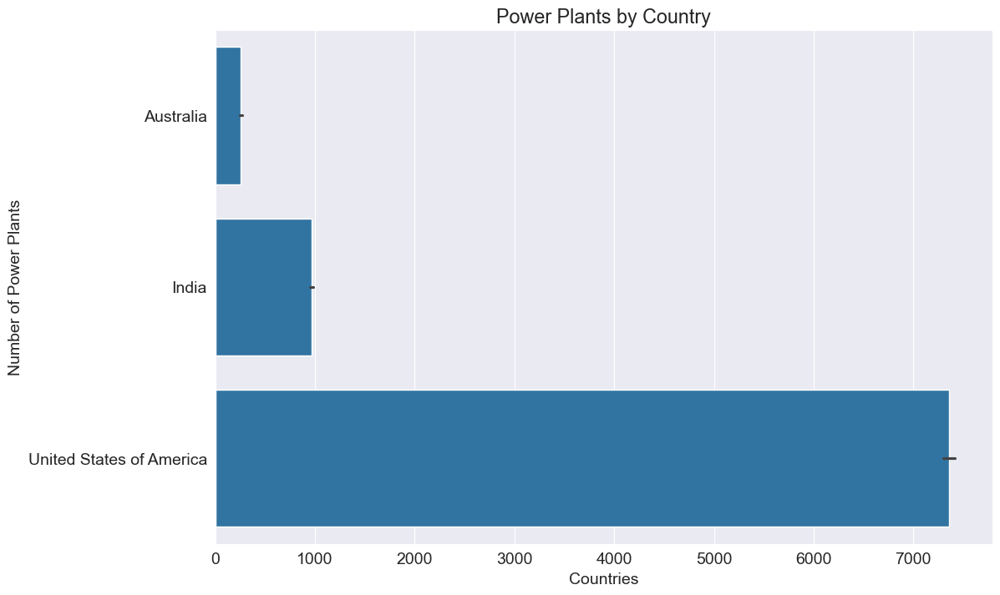

In [22]:
# Create a bar plot for country designations
sns.barplot(x=df_selected.index, y=df_selected['country_long'])
plt.xticks(rotation=360)
plt.title('Power Plants by Country')
plt.ylabel('Number of Power Plants')
plt.xlabel('Countries')
plt.show()

In [23]:
df2 = df_selected.primary_fuel.value_counts() * 100 / df_selected.primary_fuel.count()
df2

primary_fuel
Solar           30.812821
Gas             17.983000
Hydro           15.787144
Wind            11.864707
Oil              8.508943
Waste            5.268284
Coal             5.064636
Biomass          2.036480
Storage          0.920843
Nuclear          0.637507
Geothermal       0.575527
Cogeneration     0.301045
Other            0.141668
Petcoke          0.097397
Name: count, dtype: float64

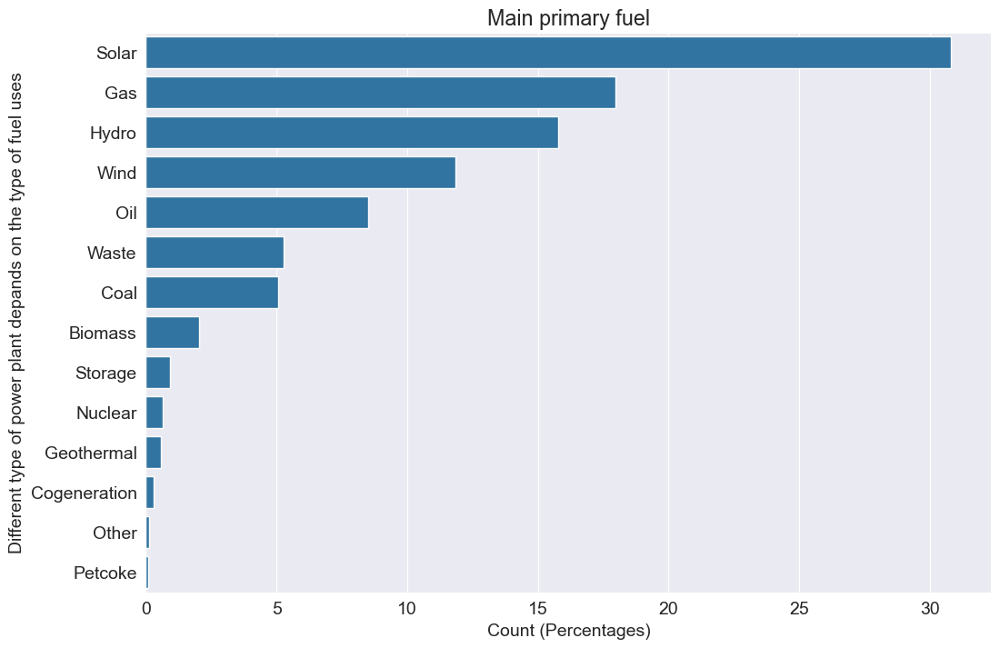

In [24]:
# Plotting the percentage of each primary fuel type
sns.barplot(x = df2, y = df2.index)
plt.title('Main primary fuel')
plt.xlabel('Count (Percentages)');
plt.ylabel('Different type of power plant depands on the type of fuel uses');

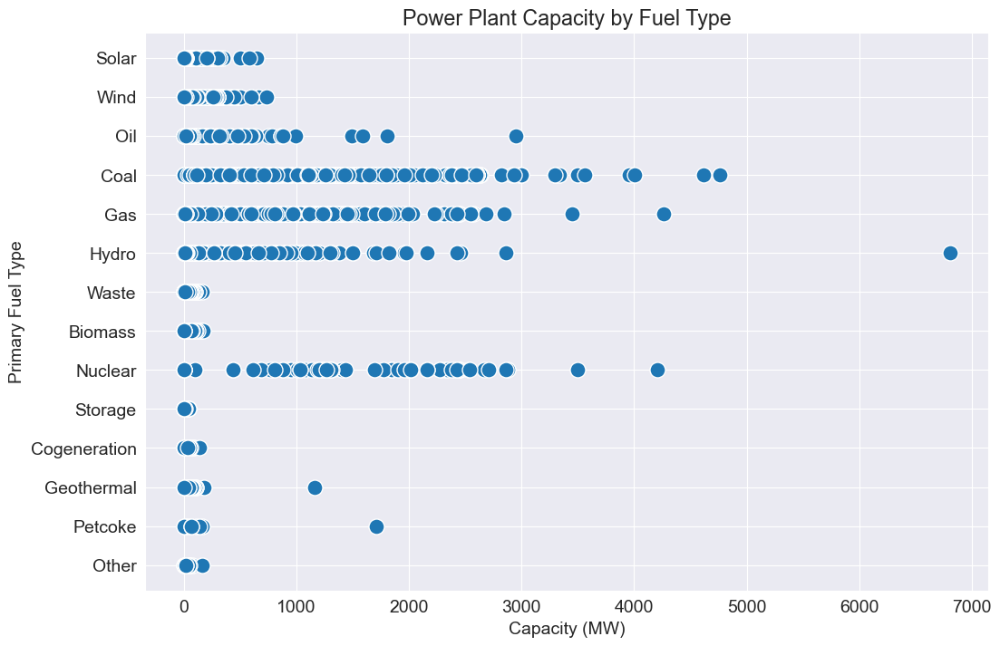

In [25]:
# Scatter plot to visualize power plant capacity by fuel type
sns.scatterplot(x=df_selected.capacity_mw, y=df_selected.primary_fuel, s=150)
plt.title('Power Plant Capacity by Fuel Type')
plt.xlabel('Capacity (MW)')
plt.ylabel('Primary Fuel Type')
plt.show()

In [26]:
# Calculate total capacity by country and get the top 20 countries
countries_capacity = (
    df_selected.groupby('country_long')[['capacity_mw']]
    .sum()
    .sort_values('capacity_mw', ascending=False)
    .head(20)
)

countries_capacity


,capacity_mw
country_long,
United States of America,1204643.350
India,295884.946
Australia,64454.726


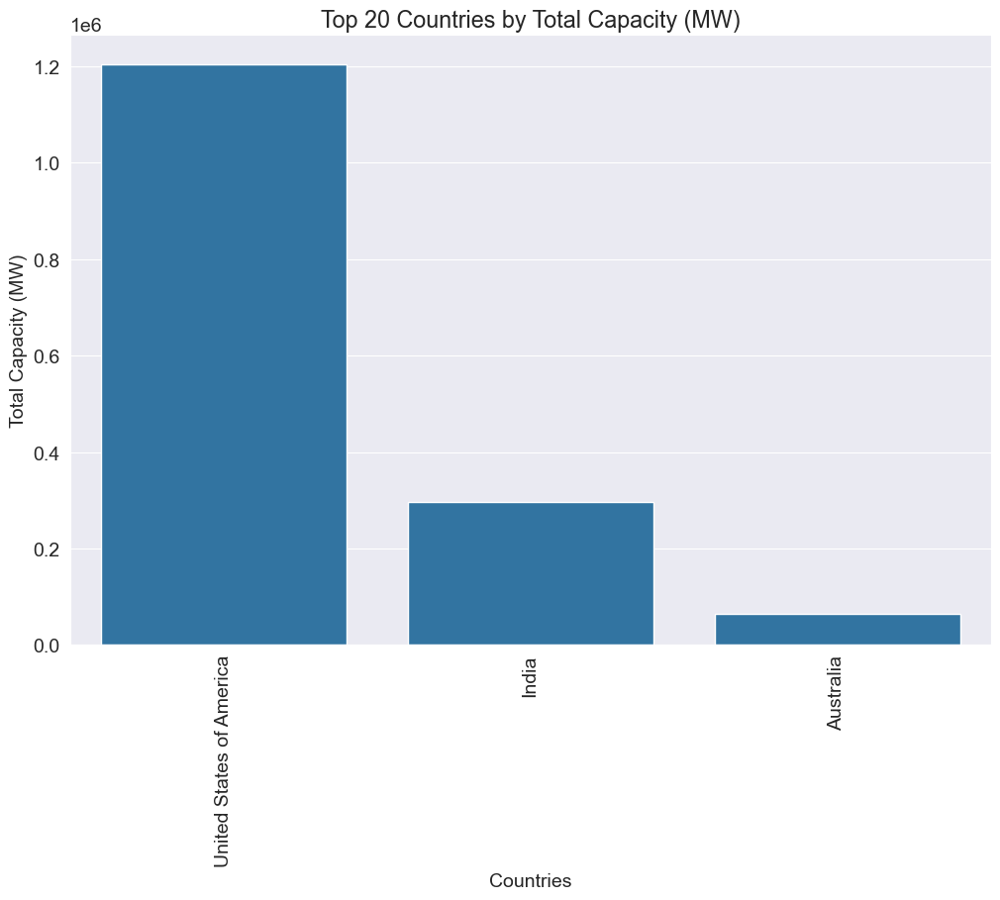

In [27]:
sns.barplot(x=countries_capacity.index, y=countries_capacity.capacity_mw)
plt.xticks(rotation=90)
plt.title('Top 20 Countries by Total Capacity (MW)')
plt.xlabel('Countries')
plt.ylabel('Total Capacity (MW)')
plt.show()

In [28]:
df_selected.generation_gwh_2013.isna().sum()

6128

In [29]:
est_gen_2013 = df_selected.groupby('country_long')[['generation_gwh_2013']].sum().sort_values('generation_gwh_2013', ascending = False).head(10)
est_gen_2013_UIA = est_gen_2013[est_gen_2013.index.isin(['United States of America', 'India', 'Australia'])]

In [30]:
est_gen_2014 = df_selected.groupby('country_long')[['generation_gwh_2014']].sum().sort_values('generation_gwh_2014', ascending = False).head(10)
est_gen_2014_UIA = est_gen_2014[est_gen_2014.index.isin(['United States of America', 'India', 'Australia'])]

In [31]:
est_gen_2015 = df_selected.groupby('country_long')[['generation_gwh_2015']].sum().sort_values('generation_gwh_2015', ascending = False).head(20)
est_gen_2015_UIA = est_gen_2015[est_gen_2015.index.isin(['United States of America', 'India', 'Australia'])]

In [32]:
est_gen_2016 = df_selected.groupby('country_long')[['generation_gwh_2016']].sum().sort_values('generation_gwh_2016', ascending = False).head(20)
est_gen_2016_UIA = est_gen_2016[est_gen_2016.index.isin(['United States of America', 'India', 'Australia'])]

In [33]:
est_gen_2017 = df_selected.groupby('country_long')[['generation_gwh_2017']].sum().sort_values('generation_gwh_2017', ascending = False).head(10)
est_gen_2017_UIA = est_gen_2017[est_gen_2017.index.isin(['United States of America', 'India', 'Australia'])]


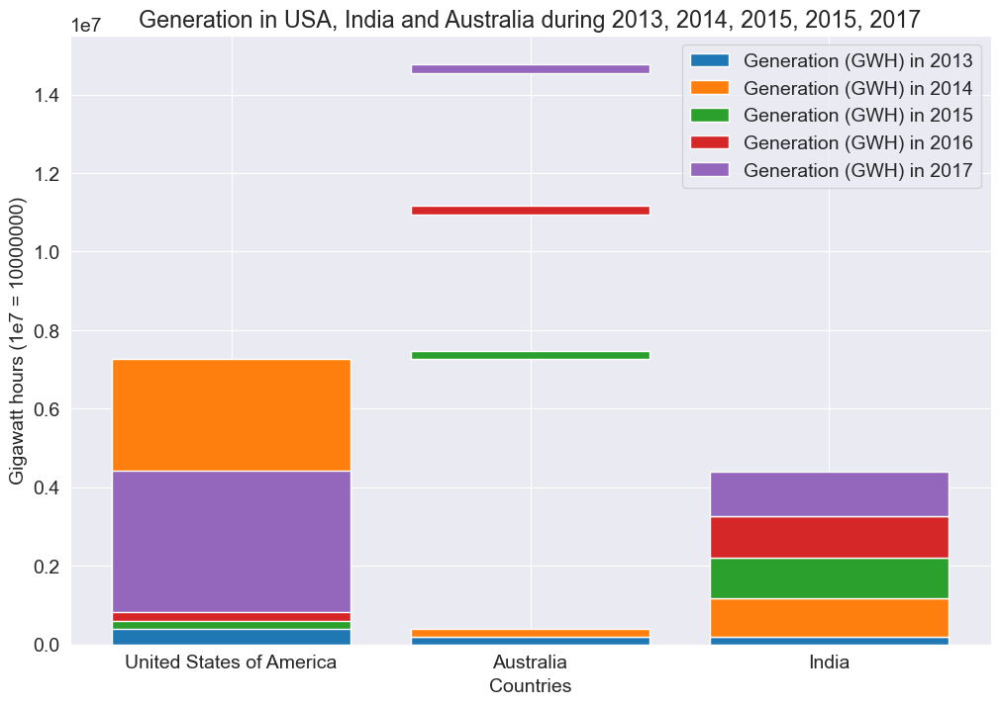

In [34]:
plt.bar(est_gen_2013_UIA.index, est_gen_2013_UIA.generation_gwh_2013)
plt.bar(est_gen_2014_UIA.index, est_gen_2014_UIA.generation_gwh_2014, bottom = est_gen_2013_UIA.generation_gwh_2013);
plt.bar(est_gen_2015_UIA.index, est_gen_2015_UIA.generation_gwh_2015, bottom = est_gen_2013_UIA.generation_gwh_2013 + est_gen_2014_UIA.generation_gwh_2014)
plt.bar(est_gen_2016_UIA.index, est_gen_2016_UIA.generation_gwh_2016, bottom = est_gen_2013_UIA.generation_gwh_2013 + est_gen_2014_UIA.generation_gwh_2014 + est_gen_2015_UIA.generation_gwh_2015)
plt.bar(est_gen_2017_UIA.index, est_gen_2017_UIA.generation_gwh_2017, bottom = est_gen_2013_UIA.generation_gwh_2013 + est_gen_2014_UIA.generation_gwh_2014 + est_gen_2015_UIA.generation_gwh_2015 + est_gen_2016_UIA.generation_gwh_2016)
plt.legend(['Generation (GWH) in 2013', 'Generation (GWH) in 2014', 'Generation (GWH) in 2015', 'Generation (GWH) in 2016', 'Generation (GWH) in 2017'])
plt.title('Generation in USA, India and Australia during 2013, 2014, 2015, 2015, 2017')
plt.xlabel('Countries')
plt.ylabel('Gigawatt hours (1e7 = 10000000)');

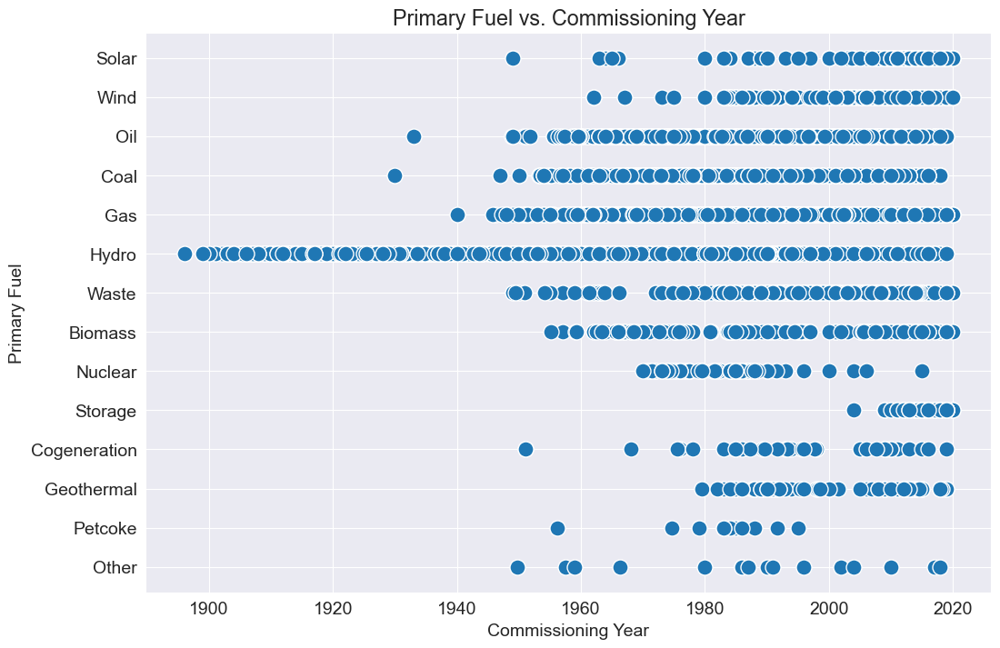

In [35]:
sns.scatterplot(x=df_selected.commissioning_year, y=df_selected.primary_fuel, s=150)
plt.title('Primary Fuel vs. Commissioning Year')
plt.xlabel('Commissioning Year')
plt.ylabel('Primary Fuel')
plt.show()

In [36]:
df_selected.primary_fuel.unique()

array(['Solar', 'Wind', 'Oil', 'Coal', 'Gas', 'Hydro', 'Waste', 'Biomass',
       'Nuclear', nan, 'Storage', 'Cogeneration', 'Geothermal', 'Petcoke',
       'Other'], dtype=object)

In [37]:
renewable_energy = df_selected[df_selected.primary_fuel.isin(['Hydro', 'Wind', 'Solar', 'Biomass', 'Wave and Tidal', 'Geothermal', 'Storage'])]
number_of_renewable_energy = renewable_energy.country_long.value_counts().head(30)
number_of_renewable_energy

country_long
United States of America    6212
India                        551
Australia                    239
Name: count, dtype: int64

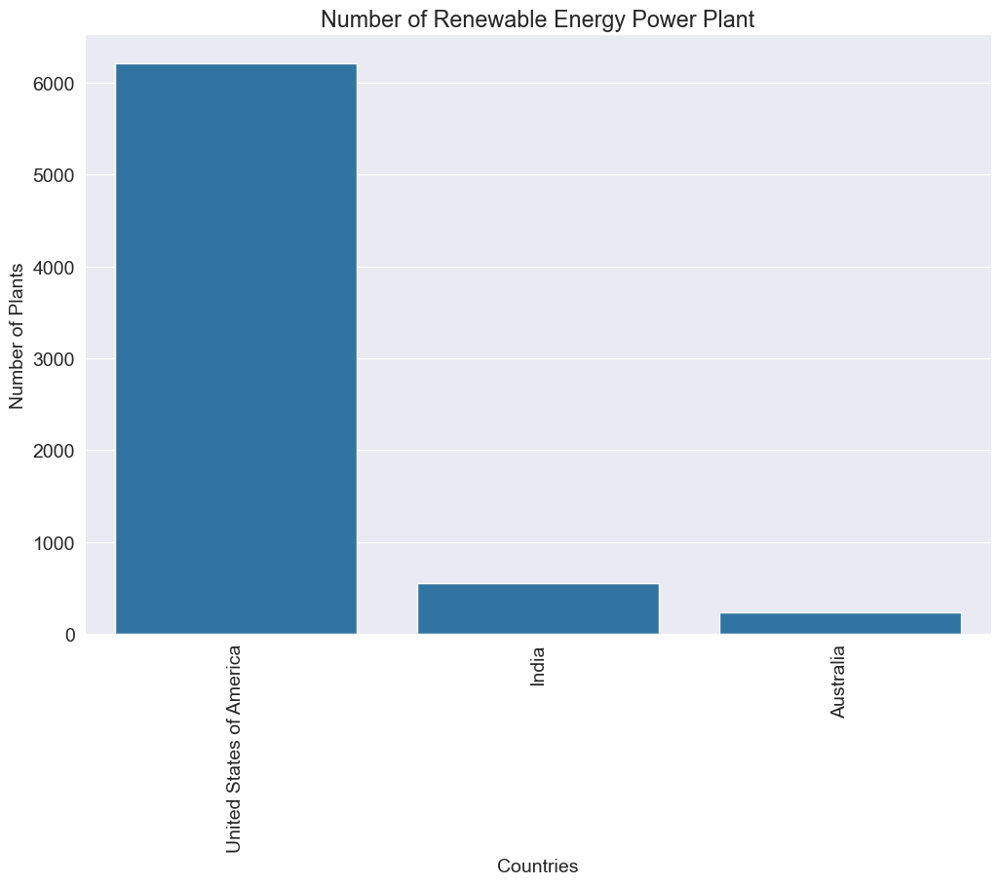

In [38]:
sns.barplot(x = number_of_renewable_energy.index, y = number_of_renewable_energy)
plt.xticks(rotation = 90)
plt.title('Number of Renewable Energy Power Plant')
plt.ylabel('Number of Plants')
plt.xlabel('Countries');

### Question 2

In [40]:
# Importing all the necessary libraries
import pandas as pd
import numpy as np 
import seaborn as sns
import reverse_geocoder as rg
import json
import joblib
import warnings 
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt 
%matplotlib inline
from scipy.stats import zscore
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import  GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import  Ridge
from sklearn.linear_model import  Lasso
from xgboost import XGBRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA

In [41]:
df = pd.read_csv(r'C:\Users\ADMIN\Downloads\temperature.csv')

In [42]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [43]:
# Number of (Rows, Columns)
df.shape

(7752, 25)

In [44]:
df.columns.to_series().groupby(df.dtypes).groups

{float64: ['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'], object: ['Date']}

In [45]:
df.duplicated().sum()


0

In [46]:
def check_values(cell):
    return cell in [' ', 'NA', '-']
has_special_values = df.applymap(check_values).any().any()
has_special_values

False

In [47]:
missing_values = df.isnull().sum()
percentage_missing_values = (missing_values / len(df)) * 100

missing_data_summary = pd.DataFrame({
    'Missing Values': missing_values,
    '% Missing data': percentage_missing_values
}).sort_values(by='Missing Values', ascending=False)

missing_data_summary

,Missing Values,% Missing data
LDAPS_CC3,75,0.967492
LDAPS_PPT4,75,0.967492
LDAPS_PPT2,75,0.967492
LDAPS_PPT1,75,0.967492
LDAPS_CC4,75,0.967492
LDAPS_CC2,75,0.967492
LDAPS_CC1,75,0.967492
LDAPS_LH,75,0.967492
LDAPS_WS,75,0.967492
LDAPS_Tmin_lapse,75,0.967492


In [48]:
df = df.loc[~df.isnull().any(axis=1)]
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [49]:
df['Date'] = pd.to_datetime(df['Date'])
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013


In [50]:
geo_data=[]
def reverse_geocoordinates(coordinates):
    result = rg.search(coordinates)
    return (result)

if __name__=="__main__":
    coordinates = list(zip(df['lat'], df['lon']))
    data = reverse_geocoordinates(coordinates)
    geo_data.append(data)
    
geo_details = pd.DataFrame(geo_data).transpose()

Loading formatted geocoded file...


In [51]:
df['State']= geo_details[0].apply(lambda x:x.get('admin1'))
df['City']=geo_details[0].apply(lambda x:x.get('name'))

In [52]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013,Seoul,Seoul
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013,Seoul,Seoul
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013,Seoul,Seoul
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013,Seoul,Seoul
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013,Gyeonggi-do,Guri-si


In [53]:
df.describe()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
count,7588.000000,7588,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,2015-07-27 18:22:12.208750592,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,...,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820,15.939510,7.465999,2014.991697
min,1.000000,2013-06-30 00:00:00,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,6.000000,2013.000000
25%,7.000000,2014-07-15 00:00:00,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,...,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000,8.000000,7.000000,2014.000000
50%,13.000000,2015-07-29 00:00:00,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,...,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,2016-08-14 00:00:00,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,...,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,2017-08-30 00:00:00,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000,31.000000,8.000000,2017.000000
std,7.217858,NaN,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,...,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256,8.906521,0.528635,1.410877


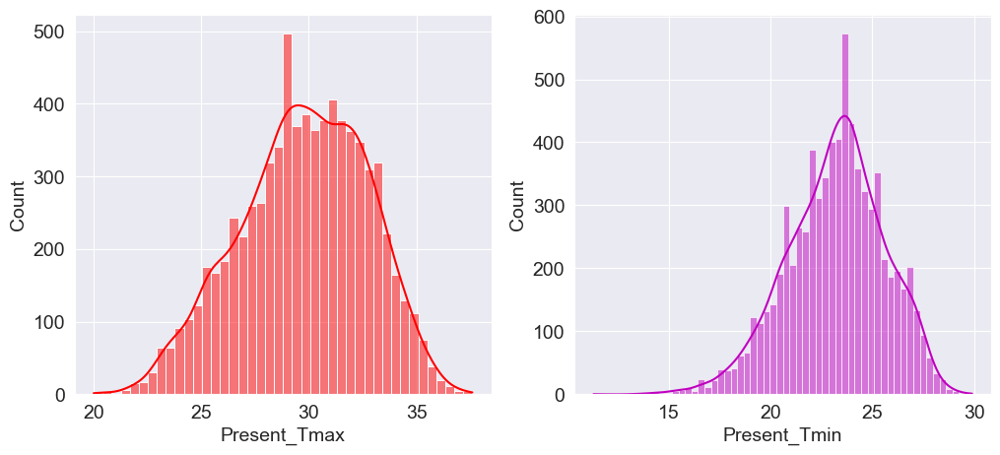

In [54]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Present_Tmax'],kde=True,color='r')
plt.subplot(1,2,2)
sns.histplot(df['Present_Tmin'],kde=True,color='m')
plt.show()

In [55]:
print('Present Maximum Temperature Maxima in year 2013-2016 :',df.Present_Tmax.max())
print('Present Maximum Temperature Minima in year 2013-2016 :',df.Present_Tmax.min())
print(' Average Present Maximum Temperature in year 2013-2016 :',df.Present_Tmax.mean())
print('='*100)
print('Present Minimum Temperature Maxima in year 2013-2016 :',df.Present_Tmin.max())
print('Present Minimum Temperature Minima in year 2013-2016 :',df.Present_Tmin.min())
print('Average Present Minimum Temperature in year 2013-2016 :',df.Present_Tmin.mean())

Present Maximum Temperature Maxima in year 2013-2016 : 37.6
Present Maximum Temperature Minima in year 2013-2016 : 20.0
 Average Present Maximum Temperature in year 2013-2016 : 29.748365840801263
Present Minimum Temperature Maxima in year 2013-2016 : 29.9
Present Minimum Temperature Minima in year 2013-2016 : 11.3
Average Present Minimum Temperature in year 2013-2016 : 23.195809172377437


In [56]:
pd.set_option('display.max_columns', None)
df.loc[df.Present_Tmax==df.Present_Tmax.max()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
5717,18.0,2016-08-11,37.6,26.8,44.254253,87.745514,34.794021,27.150764,6.366598,111.225118,0.218892,0.094288,0.004283,0.000343,0.0,0.0,0.0,0.0,37.4832,127.024,56.4448,1.2313,5082.563477,37.0,27.8,11,8,2016,Gyeonggi-do,Bucheon-si


In [57]:
df.loc[df.Present_Tmax==df.Present_Tmax.min()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
7725,1.0,2017-08-30,20.0,15.1,35.652172,89.97319,24.323737,16.128899,7.087329,108.981108,0.046182,0.014955,0.0,0.00063,0.0,0.0,0.0,0.0,37.6046,126.991,212.335,2.785,4614.76123,23.8,15.1,30,8,2017,NaN,NaN


In [58]:
df.loc[df.Present_Tmin==df.Present_Tmin.max()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
2397,23.0,2014-08-02,35.3,29.9,53.946949,85.985161,30.912804,25.439537,13.011129,117.837212,0.684685,0.448827,0.762858,0.635728,1.670126,0.005681,0.248885,0.003176,37.5372,126.891,15.5876,0.1554,5360.226563,31.3,24.8,2,8,2014,Gyeonggi-do,Guri-si


In [59]:
df.loc[df.Present_Tmin==df.Present_Tmin.min()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
6116,17.0,2016-08-27,27.1,11.3,62.793823,91.726936,23.529546,17.963487,7.984566,84.48145,0.668264,0.410536,0.452879,0.627238,0.181458,0.0,0.405181,1.015573,37.6181,127.099,53.4712,0.697,4539.616699,24.6,17.1,27,8,2016,Seoul,Seoul


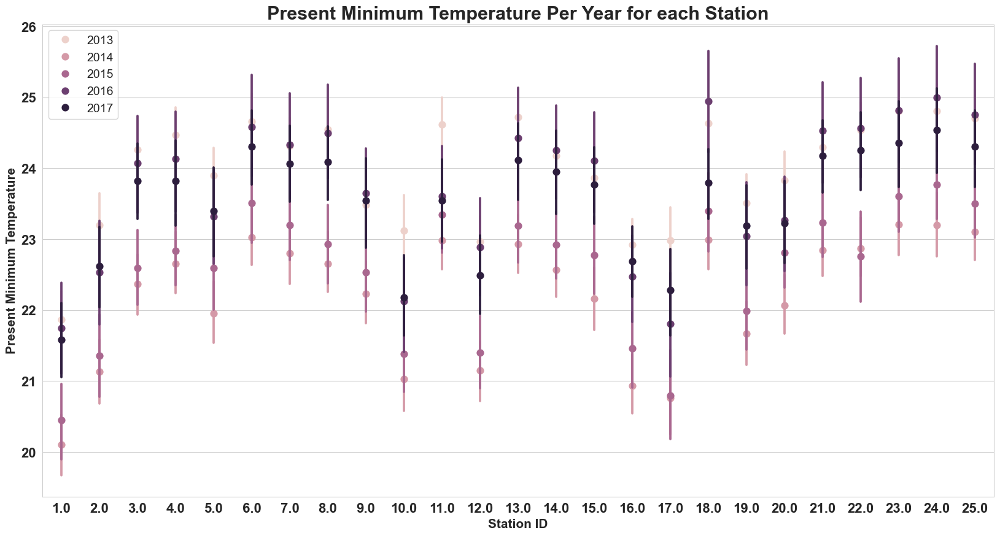

In [60]:
plt.figure(figsize=(20, 10))
sns.set_style('whitegrid')

# Use 'x' for the categorical variable, 'y' for the numerical variable, and 'hue' for grouping
sns.pointplot(x='station', y='Present_Tmin', data=df, hue='Year', join=False)

plt.title('Present Minimum Temperature Per Year for each Station', fontsize=22, fontweight='bold')
plt.xlabel('Station ID', fontsize=15, fontweight='bold')
plt.ylabel('Present Minimum Temperature', fontsize=15, fontweight='bold')
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(fontsize=14)

plt.show()

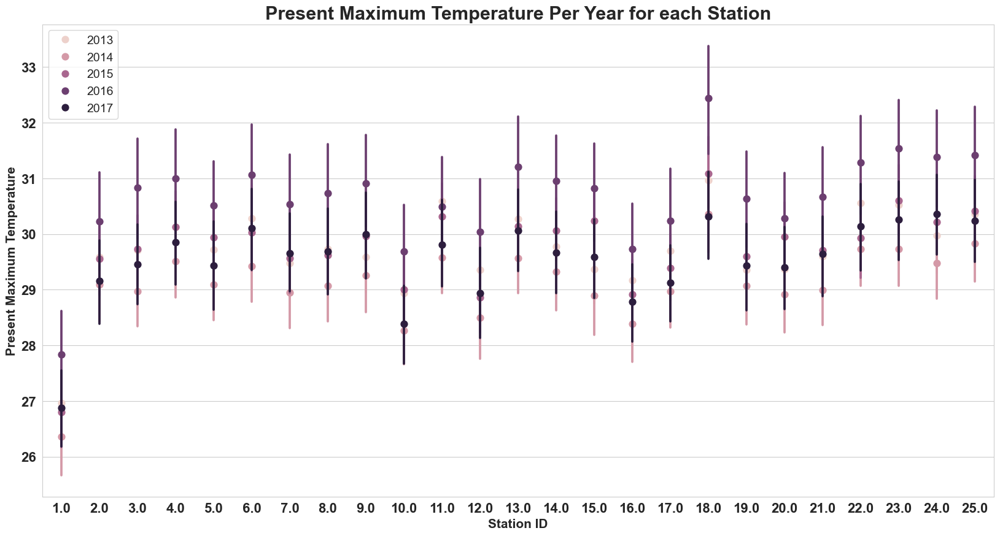

In [61]:
plt.figure(figsize=(20, 10))
sns.set_style('whitegrid')

# Use 'x' for the categorical variable, 'y' for the numerical variable, and 'hue' for grouping
sns.pointplot(x='station', y='Present_Tmax', data=df, hue='Year', join=False)

plt.title('Present Maximum Temperature Per Year for each Station', fontsize=22, fontweight='bold')
plt.xlabel('Station ID', fontsize=15, fontweight='bold')
plt.ylabel('Present Maximum Temperature', fontsize=15, fontweight='bold')
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(fontsize=14)

plt.show()

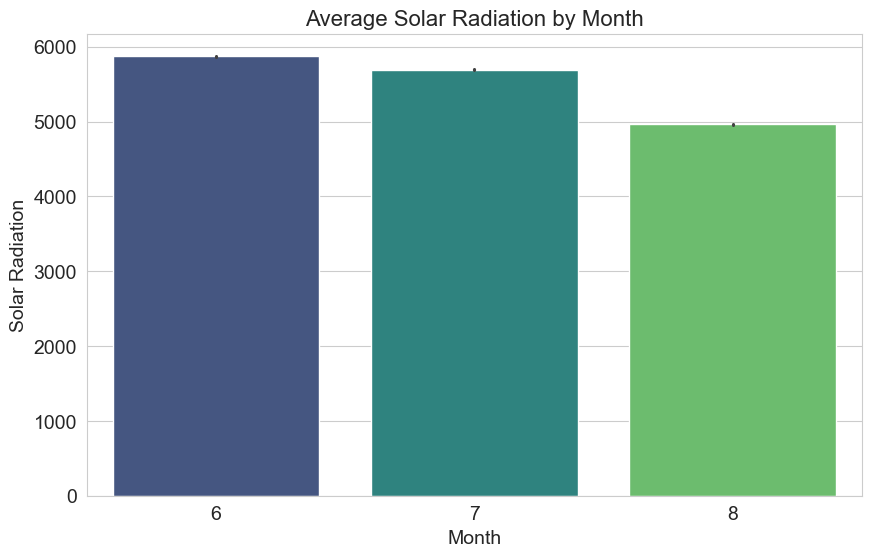

In [62]:
plt.figure(figsize=(10, 6))

# Use 'x' for the categorical variable and 'y' for the numerical variable
sns.barplot(x='Month', y='Solar radiation', data=df, palette='viridis')

plt.title('Average Solar Radiation by Month', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Solar Radiation')

plt.show()

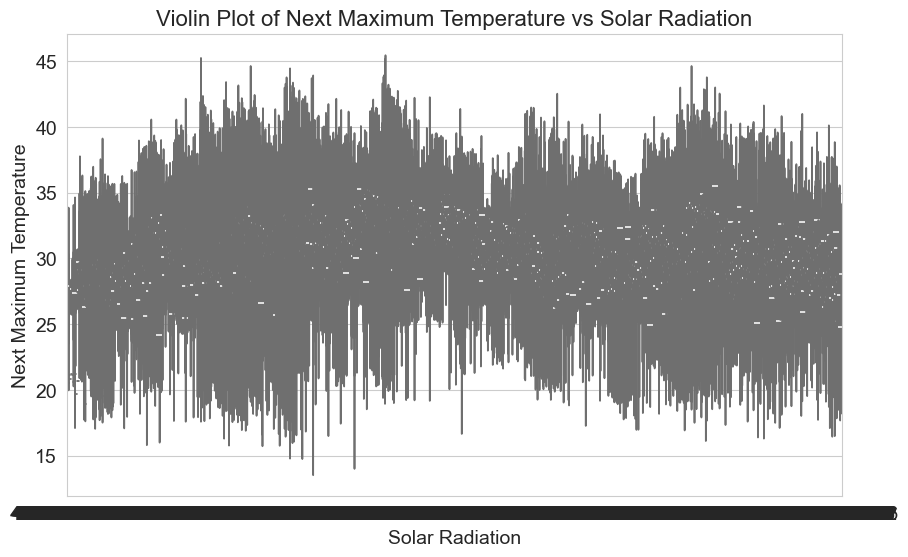

In [63]:
plt.figure(figsize=(10, 6))

# Use 'y' for the categorical variable and 'x' for the numerical variable
sns.violinplot(x=df['Solar radiation'], y=df['Next_Tmax'], color='skyblue')

plt.title('Violin Plot of Next Maximum Temperature vs Solar Radiation', fontsize=16)
plt.xlabel('Solar Radiation')
plt.ylabel('Next Maximum Temperature')

plt.show()

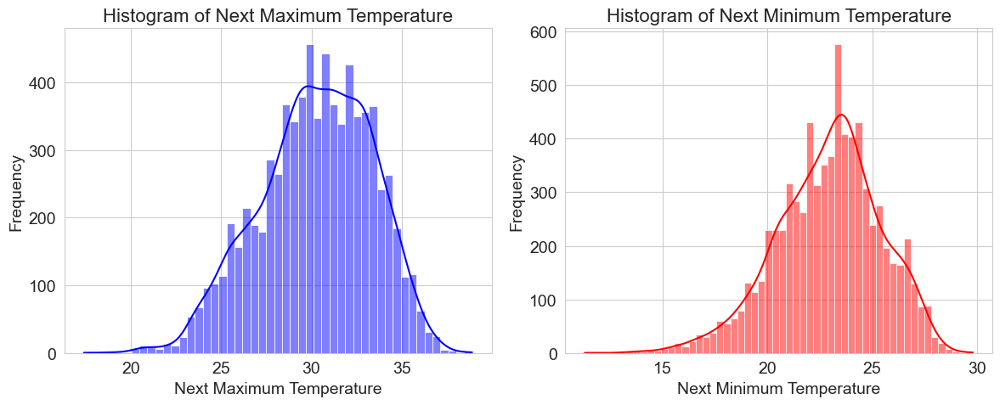

In [64]:
plt.figure(figsize=(12, 5))
# First subplot for 'Next_Tmax'
plt.subplot(1, 2, 1)
sns.histplot(df['Next_Tmax'], kde=True, color='b')
plt.title('Histogram of Next Maximum Temperature', fontsize=16)
plt.xlabel('Next Maximum Temperature')
plt.ylabel('Frequency')

# Second subplot for 'Next_Tmin'
plt.subplot(1, 2, 2)
sns.histplot(df['Next_Tmin'], kde=True, color='r')
plt.title('Histogram of Next Minimum Temperature', fontsize=16)
plt.xlabel('Next Minimum Temperature')
plt.ylabel('Frequency')

plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()

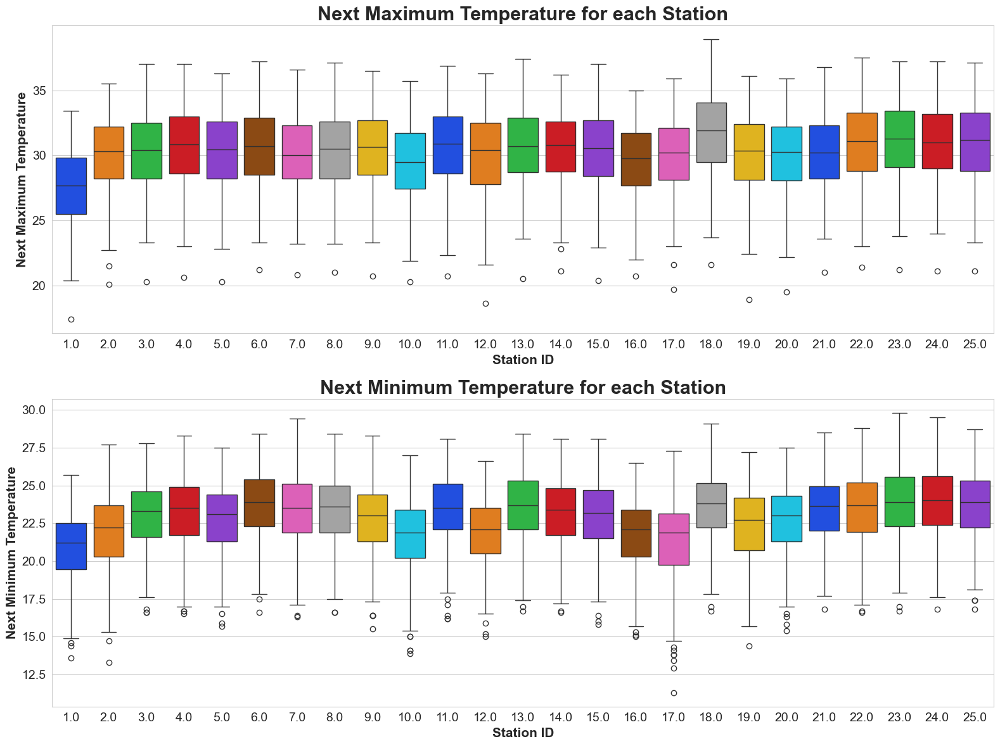

In [65]:
plt.figure(figsize=(16, 12))

# First subplot
plt.subplot(2, 1, 1)
sns.boxplot(x='station', y='Next_Tmax', data=df, palette="bright")
plt.title('Next Maximum Temperature for each Station', fontsize=22, fontweight='bold')
plt.xlabel('Station ID', fontsize=15, fontweight='bold')
plt.ylabel('Next Maximum Temperature', fontsize=15, fontweight='bold')

# Second subplot
plt.subplot(2, 1, 2)
sns.boxplot(x='station', y='Next_Tmin', data=df, palette="bright")
plt.title('Next Minimum Temperature for each Station', fontsize=22, fontweight='bold')
plt.xlabel('Station ID', fontsize=15, fontweight='bold')
plt.ylabel('Next Minimum Temperature', fontsize=15, fontweight='bold')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

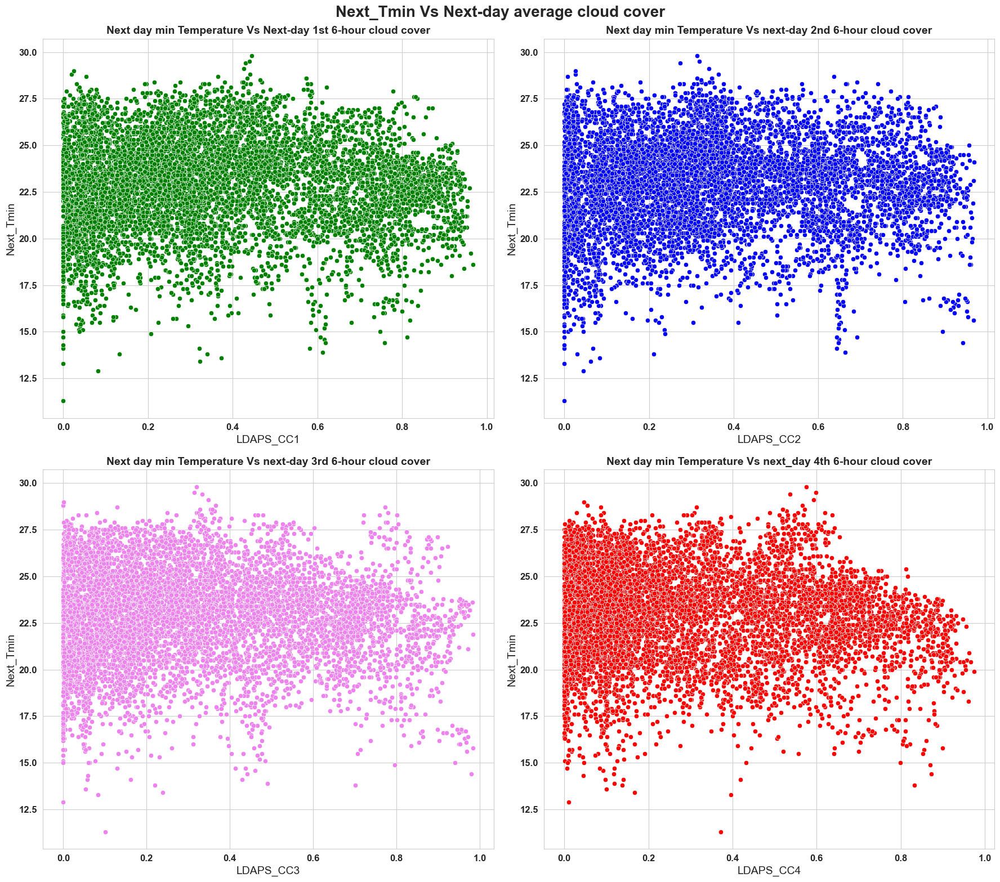

In [66]:
plt.figure(figsize=(18, 16))
plt.suptitle('Next_Tmin Vs Next-day average cloud cover', fontsize=20, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Next day min Temperature Vs Next-day 1st 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1', y='Next_Tmin', data=df, color="g")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Next day min Temperature Vs next-day 2nd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2', y='Next_Tmin', data=df, color='b')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Next day min Temperature Vs next-day 3rd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3', y='Next_Tmin', data=df, color='violet')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Next day min Temperature Vs next_day 4th 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4', y='Next_Tmin', data=df, color="r")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


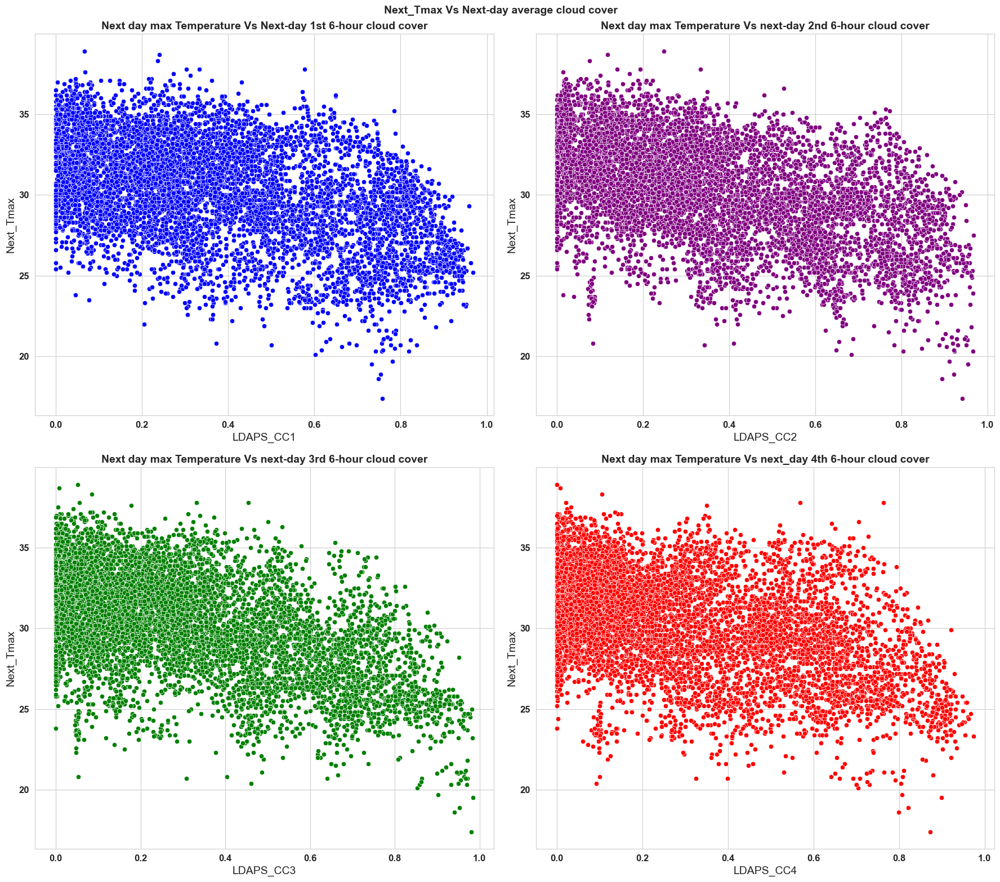

In [67]:
plt.figure(figsize=(18, 16))
plt.suptitle('Next_Tmax Vs Next-day average cloud cover', fontsize=14, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Next day max Temperature Vs Next-day 1st 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1', y='Next_Tmax', data=df, color="blue")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Next day max Temperature Vs next-day 2nd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2', y='Next_Tmax', data=df, color='purple')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Next day max Temperature Vs next-day 3rd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3', y='Next_Tmax', data=df, color='green')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Next day max Temperature Vs next_day 4th 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4', y='Next_Tmax', data=df, color="red")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


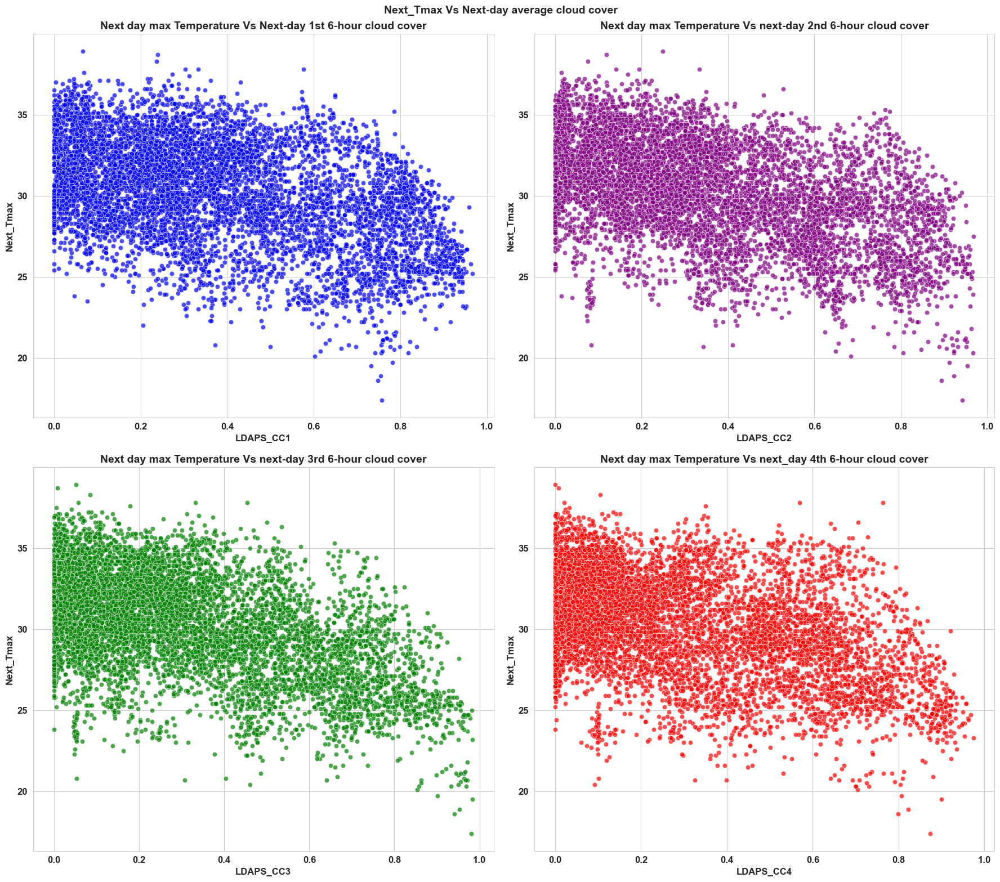

In [68]:
plt.figure(figsize=(18, 16))
plt.suptitle('Next_Tmax Vs Next-day average cloud cover', fontsize=14, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Next day max Temperature Vs Next-day 1st 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1', y='Next_Tmax', data=df, color="blue", alpha=0.7)  # Adjusted alpha for transparency
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel('LDAPS_CC1', fontsize=12, fontweight='bold')  # Added x-axis label
plt.ylabel('Next_Tmax', fontsize=12, fontweight='bold')  # Added y-axis label

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Next day max Temperature Vs next-day 2nd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2', y='Next_Tmax', data=df, color='purple', alpha=0.7)  # Adjusted alpha for transparency
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel('LDAPS_CC2', fontsize=12, fontweight='bold')  # Added x-axis label
plt.ylabel('Next_Tmax', fontsize=12, fontweight='bold')  # Added y-axis label

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Next day max Temperature Vs next-day 3rd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3', y='Next_Tmax', data=df, color='green', alpha=0.7)  # Adjusted alpha for transparency
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel('LDAPS_CC3', fontsize=12, fontweight='bold')  # Added x-axis label
plt.ylabel('Next_Tmax', fontsize=12, fontweight='bold')  # Added y-axis label

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Next day max Temperature Vs next_day 4th 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4', y='Next_Tmax', data=df, color="red", alpha=0.7)  # Adjusted alpha for transparency
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel('LDAPS_CC4', fontsize=12, fontweight='bold')  # Added x-axis label
plt.ylabel('Next_Tmax', fontsize=12, fontweight='bold')  # Added y-axis label

plt.tight_layout()
plt.show()


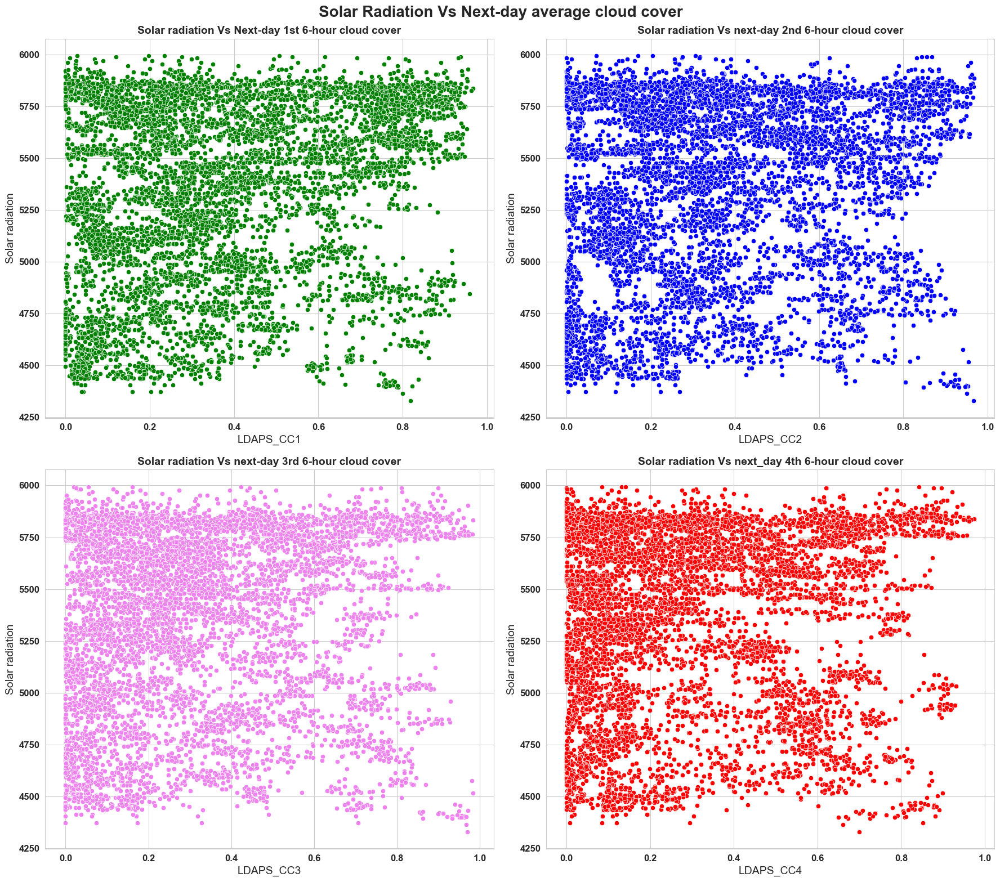

In [69]:
plt.figure(figsize=(18, 16))
plt.suptitle('Solar Radiation Vs Next-day average cloud cover', fontsize=20, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Solar radiation Vs Next-day 1st 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1', y='Solar radiation', data=df, color="g")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Solar radiation Vs next-day 2nd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2', y='Solar radiation', data=df, color='b')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Solar radiation Vs next-day 3rd 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3', y='Solar radiation', data=df, color='violet')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Solar radiation Vs next_day 4th 6-hour cloud cover', fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4', y='Solar radiation', data=df, color="r")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

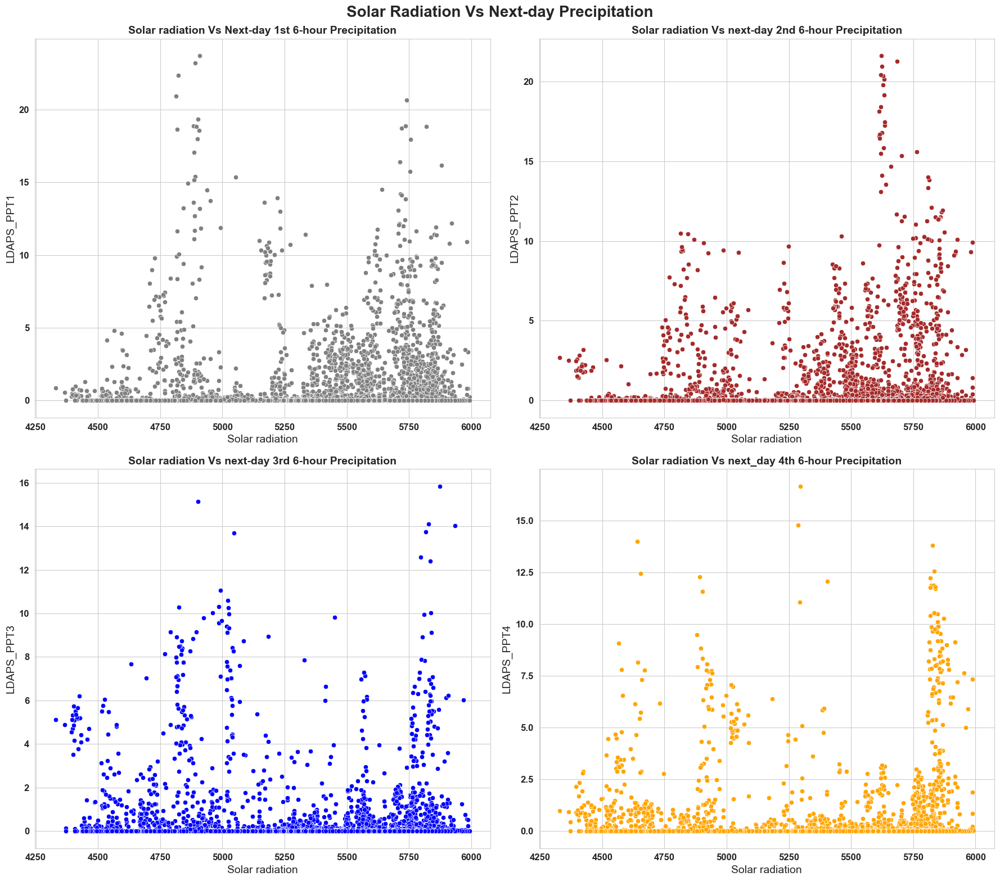

In [70]:
plt.figure(figsize=(18, 16))
plt.suptitle('Solar Radiation Vs Next-day Precipitation', fontsize=20, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Solar radiation Vs Next-day 1st 6-hour Precipitation', fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT1', x='Solar radiation', data=df, color="grey")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Solar radiation Vs next-day 2nd 6-hour Precipitation', fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT2', x='Solar radiation', data=df, color='brown')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Solar radiation Vs next-day 3rd 6-hour Precipitation', fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT3', x='Solar radiation', data=df, color='blue')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Solar radiation Vs next_day 4th 6-hour Precipitation', fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT4', x='Solar radiation', data=df, color="orange")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


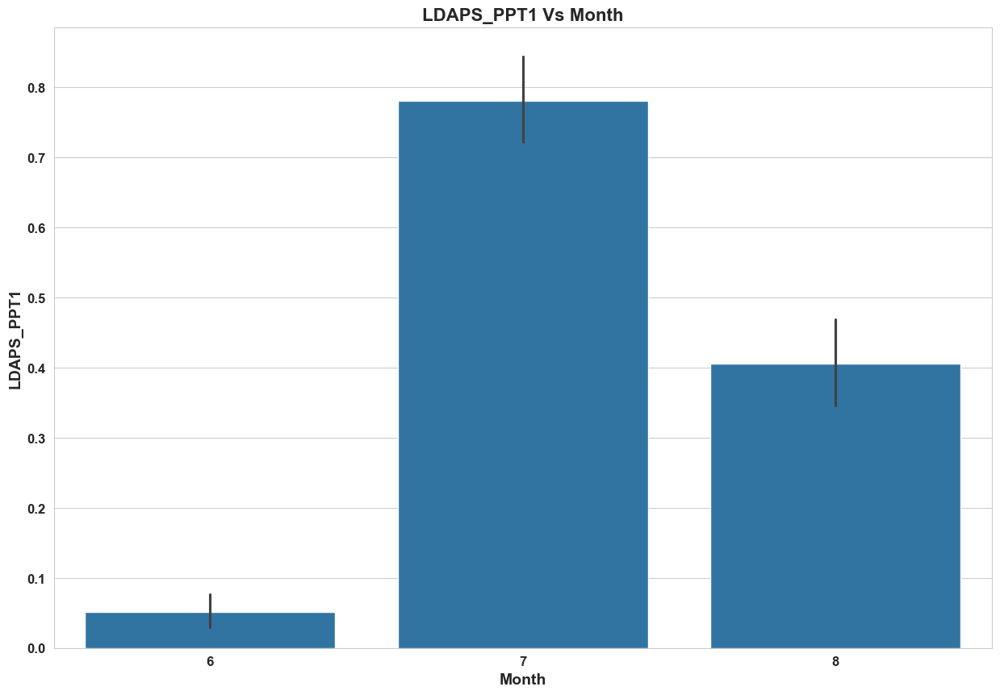

In [71]:
plt.figure(figsize=(15, 10))
sns.barplot(x='Month', y='LDAPS_PPT1', data=df)
plt.title('LDAPS_PPT1 Vs Month', fontsize=16, fontweight='bold')
plt.xlabel('Month', fontsize=14, fontweight='bold')
plt.ylabel('LDAPS_PPT1', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.show()

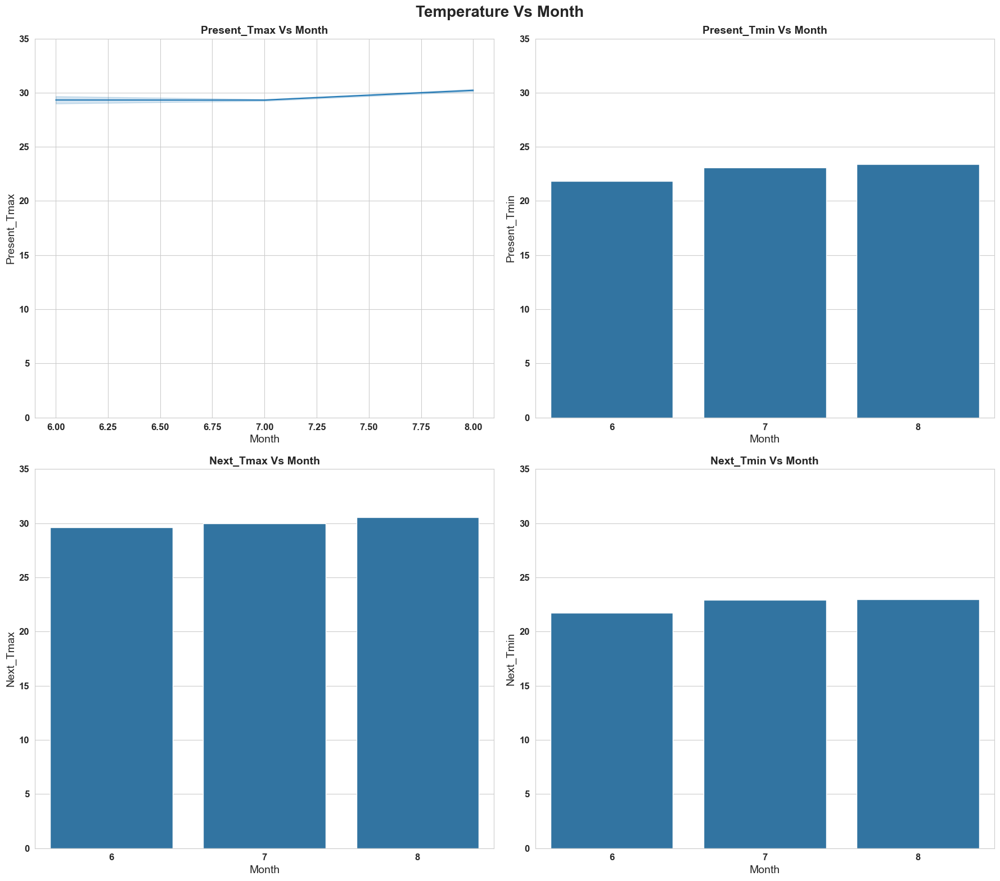

In [72]:
plt.figure(figsize=(18, 16))
plt.suptitle('Temperature Vs Month', fontsize=20, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Present_Tmax Vs Month', fontsize=14, fontweight='bold')
sns.lineplot(x='Month', y='Present_Tmax', data=df)
plt.ylim([0, 35])
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Present_Tmin Vs Month', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='Present_Tmin', data=df, ci=None)  # ci=None removes error bars
plt.ylim([0, 35])
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Next_Tmax Vs Month', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='Next_Tmax', data=df, ci=None)  # ci=None removes error bars
plt.ylim([0, 35])
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Next_Tmin Vs Month', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='Next_Tmin', data=df, ci=None)  # ci=None removes error bars
plt.ylim([0, 35])
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

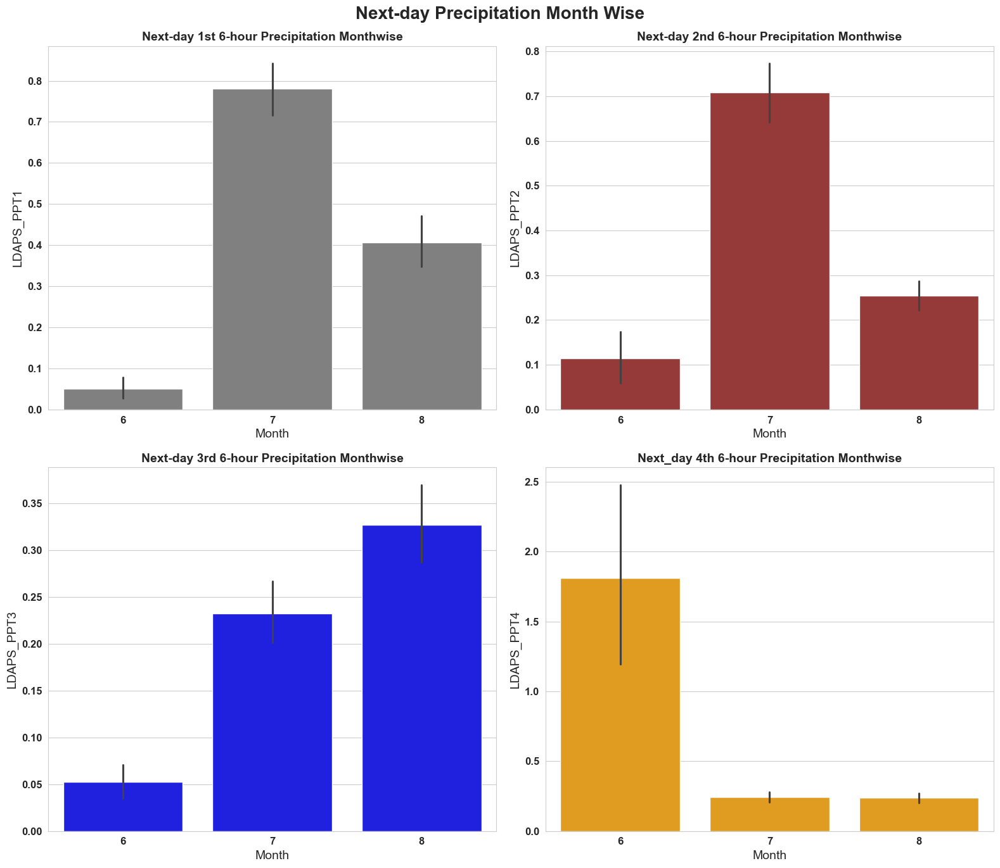

In [73]:
plt.figure(figsize=(16, 14))
plt.suptitle('Next-day Precipitation Month Wise', fontsize=20, fontweight='bold')

# Subplot 1
plt.subplot(2, 2, 1)
plt.title('Next-day 1st 6-hour Precipitation Monthwise', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='LDAPS_PPT1', data=df, color="grey")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 2
plt.subplot(2, 2, 2)
plt.title('Next-day 2nd 6-hour Precipitation Monthwise', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='LDAPS_PPT2', data=df, color='brown')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 3
plt.subplot(2, 2, 3)
plt.title('Next-day 3rd 6-hour Precipitation Monthwise', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='LDAPS_PPT3', data=df, color='blue')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Subplot 4
plt.subplot(2, 2, 4)
plt.title('Next_day 4th 6-hour Precipitation Monthwise', fontsize=14, fontweight='bold')
sns.barplot(x='Month', y='LDAPS_PPT4', data=df, color="orange")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

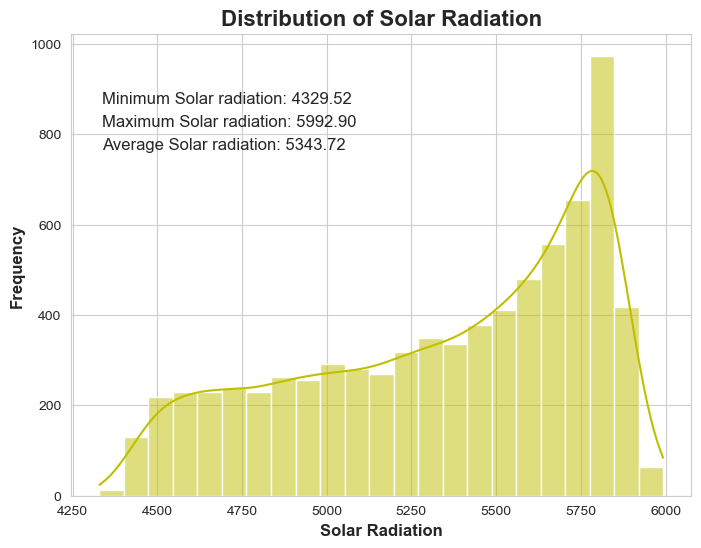

In [74]:
plt.figure(figsize=(8, 6))
sns.histplot(df['Solar radiation'], kde=True, color='y')
plt.title('Distribution of Solar Radiation', fontsize=16, fontweight='bold')
plt.xlabel('Solar Radiation', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True)

plt.annotate(f'Minimum Solar radiation: {df["Solar radiation"].min():.2f}', xy=(0.05, 0.85), xycoords='axes fraction', fontsize=12)
plt.annotate(f'Maximum Solar radiation: {df["Solar radiation"].max():.2f}', xy=(0.05, 0.80), xycoords='axes fraction', fontsize=12)
plt.annotate(f'Average Solar radiation: {df["Solar radiation"].mean():.2f}', xy=(0.05, 0.75), xycoords='axes fraction', fontsize=12)

plt.show()

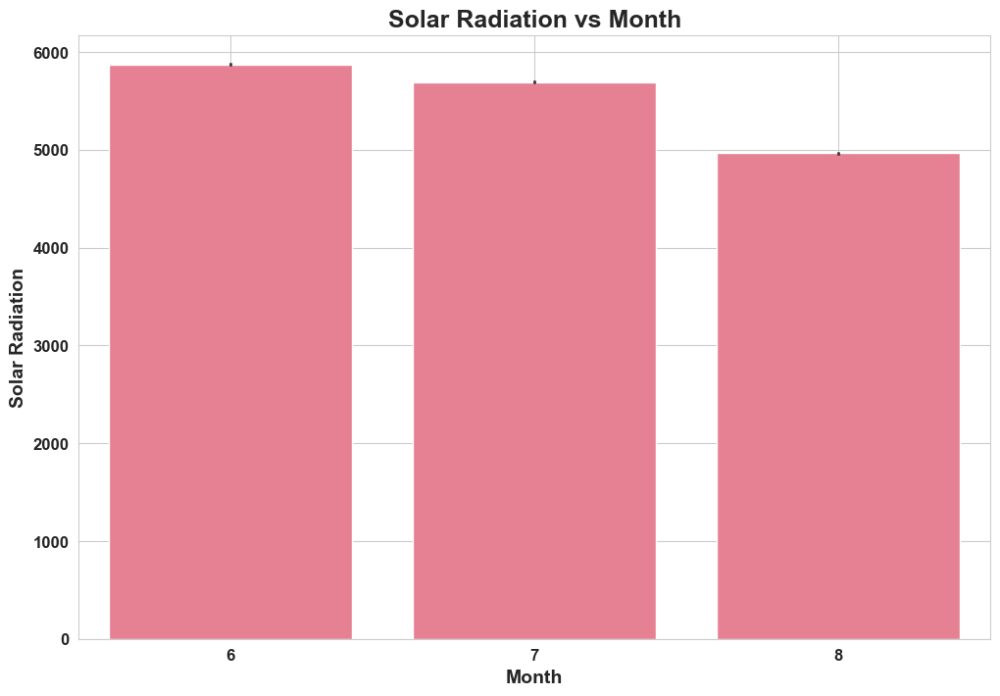

In [75]:
sns.set_palette('husl')
plt.figure(figsize=(12, 8))  # Adjusted figsize for better visibility
sns.barplot(x='Month', y='Solar radiation', data=df)
plt.title('Solar Radiation vs Month', fontsize=18, fontweight='bold')
plt.xlabel('Month', fontsize=14, fontweight='bold')
plt.ylabel('Solar Radiation', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True)

plt.show()

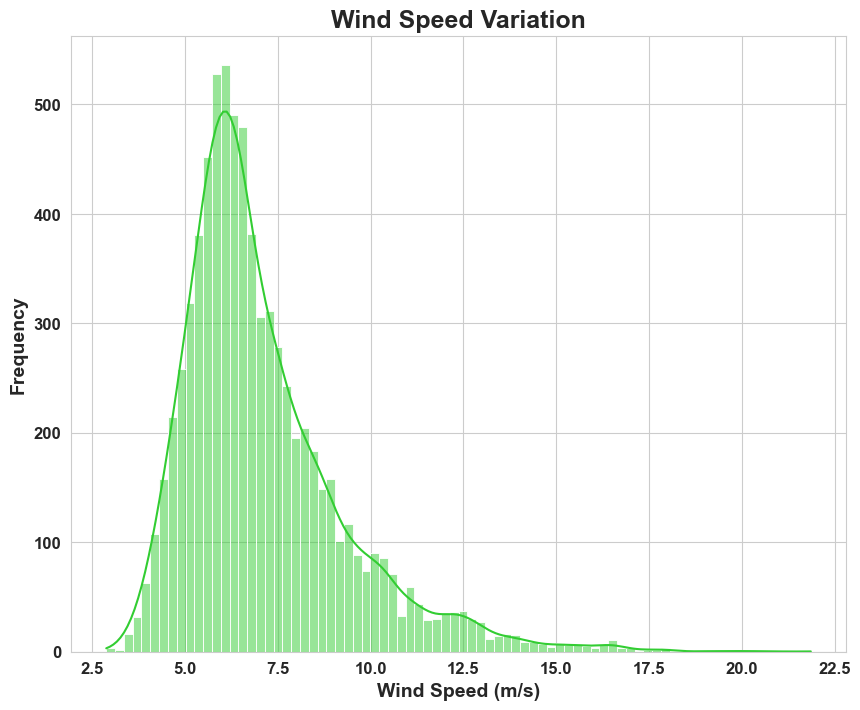

Minimum Wind Speed: 2.882579625 m/s
Maximum Wind Speed: 21.85762099 m/s
Average Wind Speed: 7.0940966991598575 m/s


In [76]:
plt.figure(figsize=(10, 8))  # Adjusted figsize for better visibility
sns.histplot(df['LDAPS_WS'], kde=True, color='limegreen')
plt.title('Wind Speed Variation', fontsize=18, fontweight='bold')
plt.xlabel('Wind Speed (m/s)', fontsize=14, fontweight='bold')
plt.ylabel('Frequency', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True)

plt.show()

print('Minimum Wind Speed:', df['LDAPS_WS'].min(), 'm/s')  # Moved print statements after the plot
print('Maximum Wind Speed:', df['LDAPS_WS'].max(), 'm/s')
print('Average Wind Speed:', df['LDAPS_WS'].mean(), 'm/s')


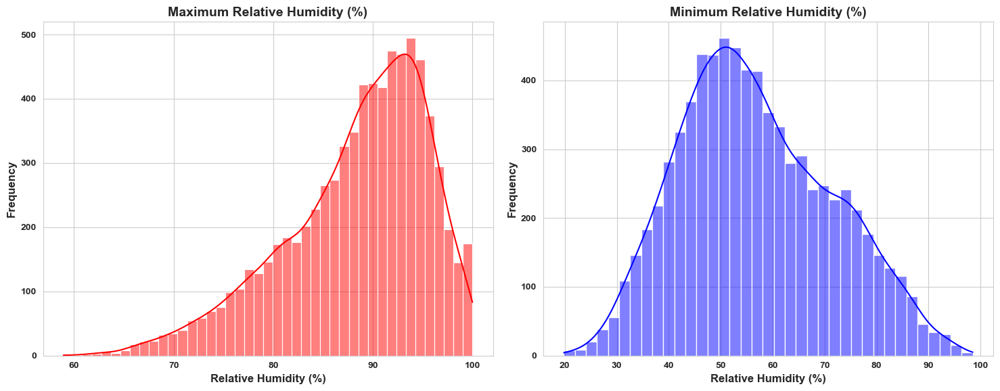

Minimum RHmax is 58.94 % and Maximum RHmax is 100.00 %
Minimum RHmin is 19.79 % and Maximum RHmin is 98.52 %


In [77]:
plt.figure(figsize=(15, 6))

# Subplot 1: Maximum relative humidity
plt.subplot(1, 2, 1)
sns.histplot(df['LDAPS_RHmax'], kde=True, color='r')
plt.title('Maximum Relative Humidity (%)', fontsize=14, fontweight='bold')
plt.xlabel('Relative Humidity (%)', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')
plt.grid(True)

# Subplot 2: Minimum relative humidity
plt.subplot(1, 2, 2)
sns.histplot(df['LDAPS_RHmin'], kde=True, color='b')
plt.title('Minimum Relative Humidity (%)', fontsize=14, fontweight='bold')
plt.xlabel('Relative Humidity (%)', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')
plt.grid(True)

plt.tight_layout()  # Adjusted layout to prevent overlapping
plt.show()

# Print statements
print('Minimum RHmax is {:.2f} % and Maximum RHmax is {:.2f} %'.format(df['LDAPS_RHmax'].min(), df['LDAPS_RHmax'].max()))
print('Minimum RHmin is {:.2f} % and Maximum RHmin is {:.2f} %'.format(df['LDAPS_RHmin'].min(), df['LDAPS_RHmin'].max()))

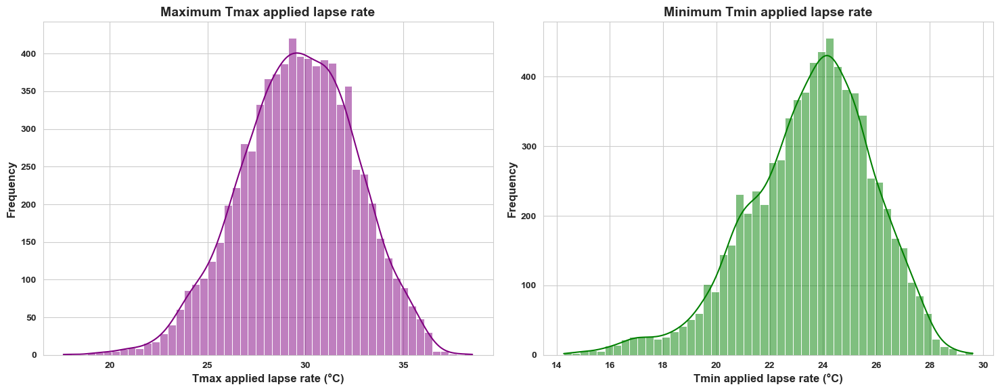

Minimum Tmax applied lapse rate is 17.62 °C and Maximum Tmax applied lapse rate is 38.54 °C
Minimum Tmin applied lapse rate is 14.27 °C and Maximum Tmin applied lapse rate is 29.62 °C


In [78]:
plt.figure(figsize=(15, 6))

# Subplot 1: Maximum Tmax applied lapse rate
plt.subplot(1, 2, 1)
sns.histplot(df['LDAPS_Tmax_lapse'], kde=True, color='purple')
plt.title('Maximum Tmax applied lapse rate', fontsize=14, fontweight='bold')
plt.xlabel('Tmax applied lapse rate (°C)', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')
plt.grid(True)

# Subplot 2: Minimum Tmin applied lapse rate
plt.subplot(1, 2, 2)
sns.histplot(df['LDAPS_Tmin_lapse'], kde=True, color='green')
plt.title('Minimum Tmin applied lapse rate', fontsize=14, fontweight='bold')
plt.xlabel('Tmin applied lapse rate (°C)', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.xticks(fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')
plt.grid(True)

plt.tight_layout()  # Adjusted layout to prevent overlapping
plt.show()

# Print statements
print('Minimum Tmax applied lapse rate is {:.2f} °C and Maximum Tmax applied lapse rate is {:.2f} °C'.format(df['LDAPS_Tmax_lapse'].min(), df['LDAPS_Tmax_lapse'].max()))
print('Minimum Tmin applied lapse rate is {:.2f} °C and Maximum Tmin applied lapse rate is {:.2f} °C'.format(df['LDAPS_Tmin_lapse'].min(), df['LDAPS_Tmin_lapse'].max()))

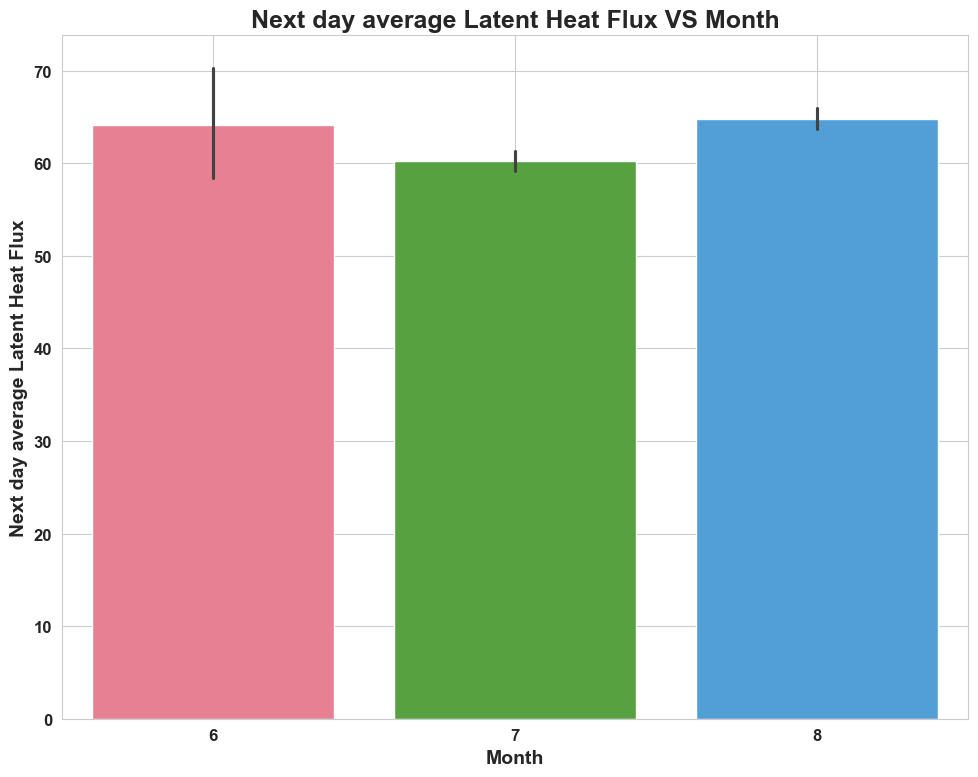

In [79]:
plt.figure(figsize=(10, 8))  # Adjusted figure size for better presentation

# Creating the bar plot
sns.barplot(x='Month', y='LDAPS_LH', data=df, palette='husl')
plt.title('Next day average Latent Heat Flux VS Month', fontsize=18, fontweight='bold')
plt.xlabel('Month', fontsize=14, fontweight='bold')
plt.ylabel('Next day average Latent Heat Flux', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(True)

plt.tight_layout()
plt.show()


In [80]:
# Sort columns by data types
sorted_columns = df.columns.to_series().groupby(df.dtypes).groups

# Print the sorted columns
for dtype, columns in sorted_columns.items():
    print(f"Columns with data type {dtype}:")
    print(columns.tolist())
    print()


Columns with data type float64:
['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']

Columns with data type datetime64[ns]:
['Date']

Columns with data type int32:
['Day', 'Month', 'Year']

Columns with data type object:
['State', 'City']



In [81]:
# List of categorical variables
Category = ['State', 'City']

# Creating LabelEncoder instance
le = LabelEncoder()

# Applying LabelEncoder to each categorical variable
for col in Category:
    df[col] = le.fit_transform(df[col])

# Displaying the updated DataFrame
df.head()


,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013,1,6
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013,1,6
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013,1,6
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013,1,6
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013,0,3


In [82]:
df.drop(['Date'], axis=1, inplace=True)

In [83]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013,1,6
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013,1,6
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013,1,6
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013,1,6
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013,0,3


In [84]:
# Feature selection and Engineering

In [85]:
df.shape

(7588, 29)

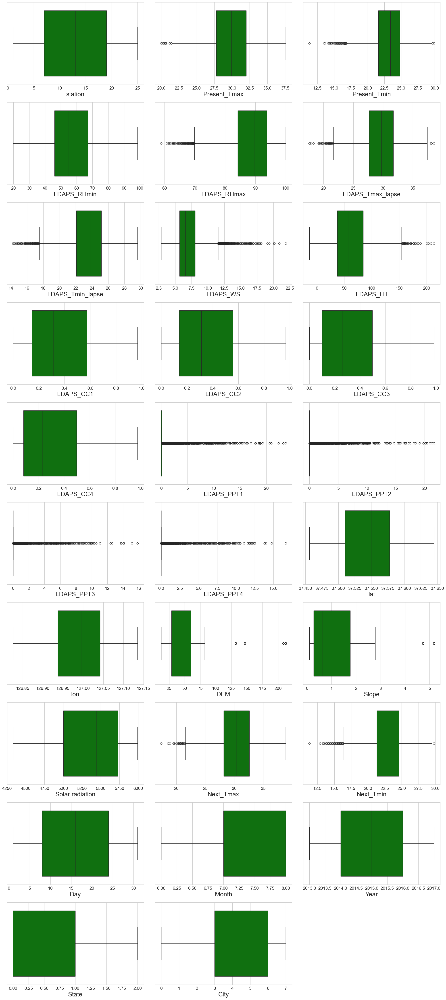

In [86]:
plt.figure(figsize=(20, 45), facecolor='white')
plotnumber = 1

for column in df.columns:
    if plotnumber <= 29:
        ax = plt.subplot(10, 3, plotnumber)
        sns.boxplot(x=df[column], color='g')
        plt.xlabel(column, fontsize=20)
    plotnumber += 1

plt.tight_layout()
plt.show()

In [87]:
# Calculating z-score
z = np.abs(zscore(df))

# Setting threshold
threshold = 3

# Filtering out rows where z-score is less than threshold for all columns
df1 = df[(z < threshold).all(axis=1)]

# Printing shapes and percentage data loss
print("Shape of the dataframe before removing outliers: ", df.shape)
print("Shape of the dataframe after removing outliers: ", df1.shape)
print("Percentage of data loss post outlier removal: ", (df.shape[0] - df1.shape[0]) / df.shape[0] * 100)

# Assigning the filtered dataframe back to the original name
df = df1.copy()


Shape of the dataframe before removing outliers:  (7588, 29)
Shape of the dataframe after removing outliers:  (6739, 29)
Percentage of data loss post outlier removal:  11.188719030047443


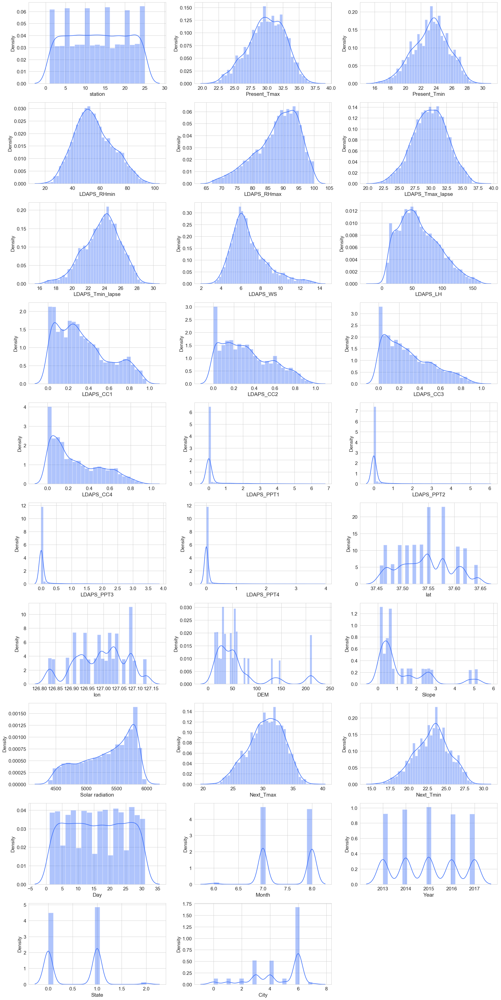

In [88]:
plt.figure(figsize=(20, 40), facecolor='white')
sns.set_palette('rainbow')

plotnum = 1
for col in df.columns:
    if plotnum <= 29:  # Adjust the number of plots per row and column as needed
        plt.subplot(10, 3, plotnum)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize=15)
    plotnum += 1

plt.tight_layout()
plt.show()

In [89]:
df.skew()

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin         0.309567
LDAPS_RHmax        -0.686083
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.379269
LDAPS_WS            1.085685
LDAPS_LH            0.567050
LDAPS_CC1           0.594835
LDAPS_CC2           0.505774
LDAPS_CC3           0.701288
LDAPS_CC4           0.708754
LDAPS_PPT1          3.724580
LDAPS_PPT2          4.854967
LDAPS_PPT3          5.516862
LDAPS_PPT4          5.924324
lat                 0.106983
lon                -0.277547
DEM                 1.764698
Slope               1.590130
Solar radiation    -0.520157
Next_Tmax          -0.267526
Next_Tmin          -0.234328
Day                 0.000057
Month              -0.168571
Year                0.025066
State               0.143188
City               -0.951530
dtype: float64

In [90]:
# List of columns with skewness to be reduced
skew = ['LDAPS_RHmax', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC3', 'LDAPS_CC4',
        'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope', 
        'Solar radiation', 'Month']

# Importing PowerTransformer from sklearn.preprocessing
from sklearn.preprocessing import PowerTransformer

# Creating an instance of PowerTransformer with 'yeo-johnson' method
scaler = PowerTransformer(method='yeo-johnson')

# Transforming skewed data
df[skew] = scaler.fit_transform(df[skew].values)

# Viewing the transformed DataFrame
df.head()


,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
0,1.0,28.7,21.4,58.255688,0.348222,28.074101,-0.357311,0.176871,0.349992,0.233947,0.203896,-0.460839,-0.512476,-0.52537,-0.484794,-0.461889,-0.414444,37.6046,126.991,1.854393,1.327776,1.891687,29.1,21.2,30,-2.482447,2013,1,6
1,2.0,31.9,21.6,52.263397,0.261118,29.850689,0.109008,-0.574617,-0.166810,0.225508,0.251771,-0.474101,-0.532674,-0.52537,-0.484794,-0.461889,-0.414444,37.6046,127.032,0.069704,-0.375858,1.431077,30.5,22.5,30,-2.482447,2013,1,6
2,3.0,31.6,23.3,48.690479,-0.717348,30.091292,0.361065,-0.252083,-1.378337,0.209344,0.257469,-0.222547,-0.443077,-0.52537,-0.484794,-0.461889,-0.414444,37.5776,127.058,-0.353433,-0.944115,1.410511,31.1,23.9,30,-2.482447,2013,1,6
3,4.0,32.0,23.4,58.239788,1.375094,29.704629,-0.215595,-0.606795,0.245926,0.216372,0.226002,-0.464009,-0.491694,-0.52537,-0.484794,-0.461889,-0.414444,37.6450,127.022,0.098766,1.249133,1.387059,31.7,24.3,30,-2.482447,2013,1,6
4,5.0,31.4,21.9,56.174095,0.186035,29.113934,-0.143389,-0.541825,1.298111,0.151407,0.249995,-0.361649,-0.278264,-0.52537,-0.484794,-0.461889,-0.414444,37.5507,127.135,-0.278815,-0.392364,1.396254,31.2,22.5,30,-2.482447,2013,0,3


In [91]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,State,City
station,1.000000,0.110291,0.133638,-0.069582,-0.182354,0.066863,0.108664,0.030231,-0.135717,0.008671,0.006380,0.006303,0.011510,-0.001774,-0.006798,-0.004884,-0.000285,-0.241811,-0.122829,-0.326019,-0.146034,-0.034787,0.106378,0.129110,0.005032,0.011309,0.006658,-0.107709,-0.172313
Present_Tmax,0.110291,1.000000,0.610428,-0.154266,-0.320074,0.540680,0.623443,-0.071596,0.119022,-0.290078,-0.157917,-0.061417,-0.049978,-0.190222,-0.097425,-0.022348,-0.021344,-0.052041,0.011132,-0.130892,-0.092409,-0.099696,0.586943,0.615950,-0.130708,0.171614,0.099185,-0.049572,-0.028619
Present_Tmin,0.133638,0.610428,1.000000,0.151385,-0.053421,0.441577,0.764041,0.034364,-0.008556,0.090828,0.117894,0.043629,0.000193,0.068506,0.090113,0.035889,-0.063495,-0.072707,-0.043201,-0.238916,-0.157839,-0.047145,0.438813,0.785946,-0.082712,0.104576,0.099222,-0.073556,-0.032508
LDAPS_RHmin,-0.069582,-0.154266,0.151385,1.000000,0.566069,-0.555583,0.114069,0.171684,-0.002412,0.574389,0.713238,0.636195,0.459528,0.410985,0.510241,0.405612,0.244139,0.090054,-0.093969,0.057460,0.083910,0.229070,-0.433872,0.134518,-0.073118,-0.183976,0.001709,-0.078498,-0.060087
LDAPS_RHmax,-0.182354,-0.320074,-0.053421,0.566069,1.000000,-0.403634,-0.182113,0.060965,0.285942,0.425827,0.372085,0.143375,0.046555,0.420202,0.368154,0.219383,0.118163,0.232258,0.013059,0.174176,0.209222,0.154031,-0.323446,-0.110402,-0.014136,-0.134357,-0.146019,-0.039266,-0.037656
LDAPS_Tmax_lapse,0.066863,0.540680,0.441577,-0.555583,-0.403634,1.000000,0.624572,-0.154400,0.005878,-0.416255,-0.492392,-0.468317,-0.367547,-0.307565,-0.344808,-0.285371,-0.207369,-0.038285,0.106354,-0.110286,-0.105094,-0.034699,0.816861,0.553227,-0.139339,0.115992,0.066794,-0.033596,-0.001619
LDAPS_Tmin_lapse,0.108664,0.623443,0.764041,0.114069,-0.182113,0.624572,1.000000,-0.002164,-0.143246,0.023128,0.087752,0.032023,-0.017483,-0.054475,0.021320,-0.018357,-0.084124,-0.091796,-0.025047,-0.174769,-0.160165,0.009890,0.550810,0.873678,-0.141873,0.083247,0.061339,-0.065932,-0.024363
LDAPS_WS,0.030231,-0.071596,0.034364,0.171684,0.060965,-0.154400,-0.002164,1.000000,-0.056362,0.203057,0.156336,0.065764,0.090955,0.197126,0.166155,0.089355,0.167950,-0.027463,-0.077686,0.113157,0.095385,0.164626,-0.205979,0.023330,-0.058922,-0.129418,-0.119526,-0.004350,-0.016754
LDAPS_LH,-0.135717,0.119022,-0.008556,-0.002412,0.285942,0.005878,-0.143246,-0.056362,1.000000,-0.113430,-0.224377,-0.213416,-0.149974,0.017757,-0.061339,0.010756,0.028329,0.100486,0.009790,0.053275,0.069892,-0.032027,0.151784,-0.052365,-0.021563,0.047854,0.054981,-0.042471,-0.038202
LDAPS_CC1,0.008671,-0.290078,0.090828,0.574389,0.425827,-0.416255,0.023128,0.203057,-0.113430,1.000000,0.759430,0.485809,0.332623,0.726938,0.570382,0.300876,0.223193,-0.006352,-0.013794,-0.030080,-0.032476,0.235623,-0.453763,0.008400,-0.046380,-0.226722,-0.069276,-0.037880,-0.025990


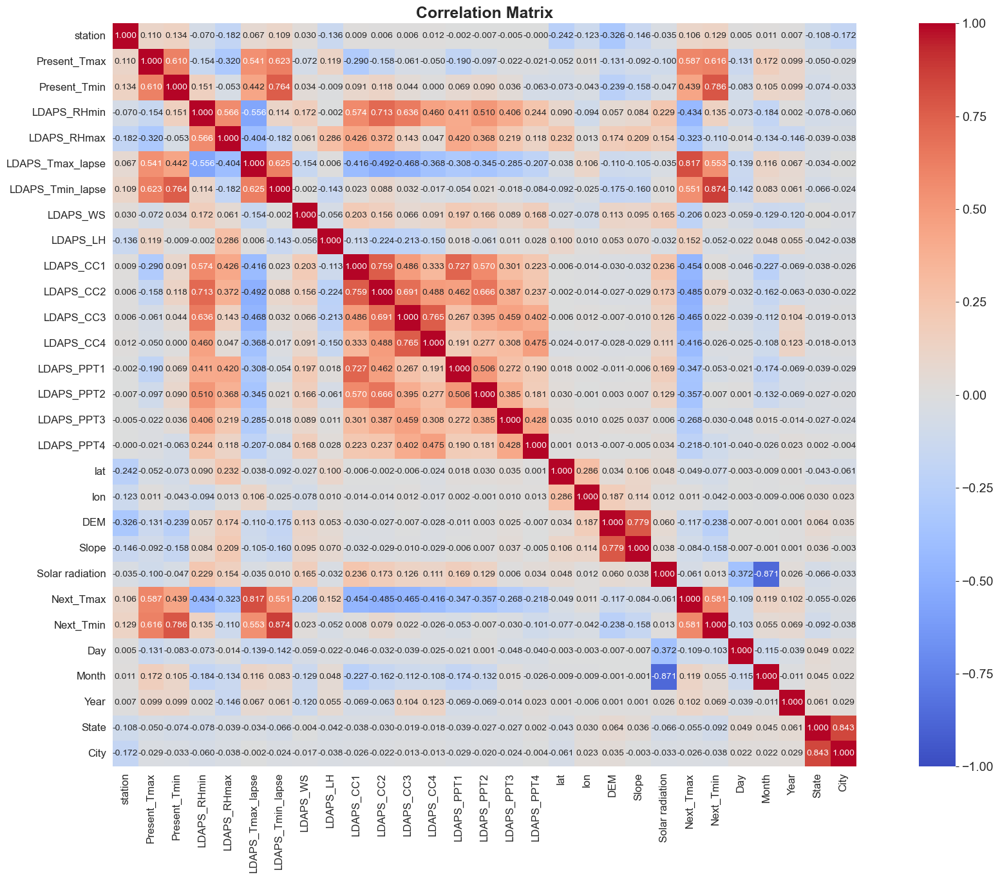

In [92]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='.3f', 
            annot_kws={'size': 10}, cmap='coolwarm')
plt.title('Correlation Matrix', fontsize=18, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

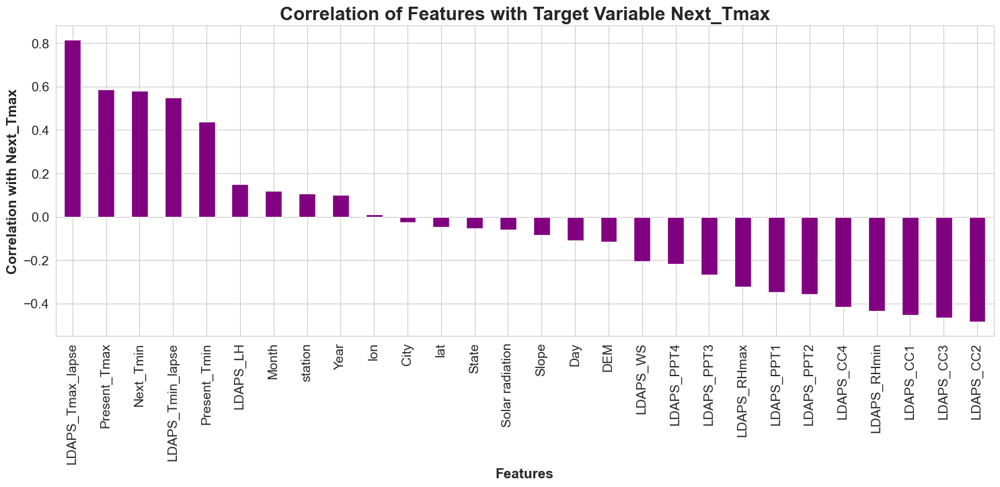

In [93]:
plt.figure(figsize=(18, 6))
df.corr()['Next_Tmax'].drop('Next_Tmax').sort_values(ascending=False).plot(kind='bar', color='purple')
plt.xlabel('Features', fontsize=15, fontweight='bold')
plt.ylabel('Correlation with Next_Tmax', fontsize=15, fontweight='bold')
plt.title('Correlation of Features with Target Variable Next_Tmax', fontsize=20, fontweight='bold')
plt.show()

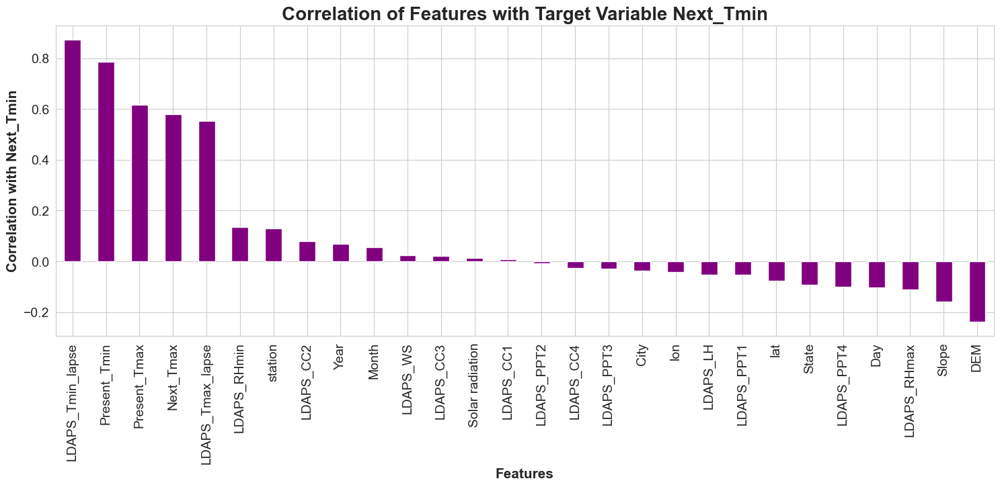

In [94]:
plt.figure(figsize=(18, 6))
df.corr()['Next_Tmin'].drop('Next_Tmin').sort_values(ascending=False).plot(kind='bar', color='purple')
plt.xlabel('Features', fontsize=15, fontweight='bold')
plt.ylabel('Correlation with Next_Tmin', fontsize=15, fontweight='bold')
plt.title('Correlation of Features with Target Variable Next_Tmin', fontsize=20, fontweight='bold')
plt.show()


In [95]:
# Splitting data in Target and Dependent feature
X = df.drop(['Next_Tmax'], axis =1)
Y = df['Next_Tmax']

In [96]:
scaler= StandardScaler()
X_scale = scaler.fit_transform(X)

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X_scale,i) for i in range(len(X.columns))]
vif["Features"] = X.columns
vif

,VIF values,Features
0,1.371722,station
1,2.903305,Present_Tmax
2,3.405399,Present_Tmin
3,6.098440,LDAPS_RHmin
4,2.609329,LDAPS_RHmax
5,6.667525,LDAPS_Tmax_lapse
6,8.263539,LDAPS_Tmin_lapse
7,1.232667,LDAPS_WS
8,1.519175,LDAPS_LH
9,4.867446,LDAPS_CC1


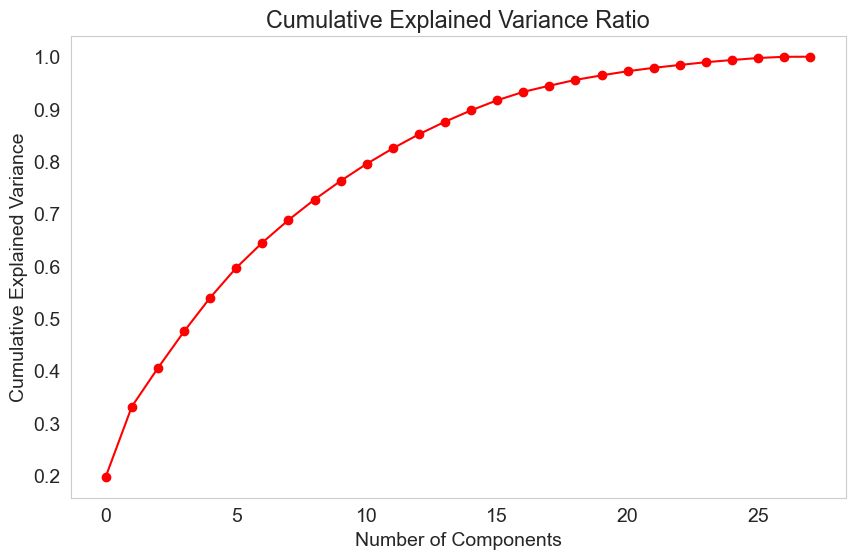

In [97]:
# Assuming X_scale is already scaled 
pca = PCA()
x_pca = pca.fit_transform(X_scale)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance Ratio')
plt.grid()
plt.show()

In [98]:
pca_new = PCA(n_components=15)
x_new = pca_new.fit_transform(X_scale)

principle_x=pd.DataFrame(x_new,columns=np.arange(15))

In [99]:
# Machine Learning Model Building For Next_Tmax
X_train, X_test, Y_train, Y_test = train_test_split(principle_x, Y, random_state=42, test_size=.33)

In [100]:
maxR2_score = 0
maxRS = 0

for i in range(1, 500):
    X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y, random_state=i, test_size=0.33)
    lin_reg = LinearRegression()
    lin_reg.fit(X_train, Y_train)
    y_pred = lin_reg.predict(X_test)
    R2 = r2_score(Y_test, y_pred)
    
    if R2 > maxR2_score:
        maxR2_score = R2
        maxRS = i

print('Best R2 Score is', maxR2_score, 'on Random_state', maxRS)

Best R2 Score is 0.8077797748919142 on Random_state 108


In [101]:
X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y, random_state=108, test_size=0.33)
lin_reg = LinearRegression()
lin_reg.fit(X_train, Y_train)
lin_reg.score(X_train, Y_train)
y_pred = lin_reg.predict(X_test)
print('\033[1m' + 'Predicted Wins:' + '\033[0m\n', y_pred)
print('\n')
print('\033[1m' + 'Actual Wins:' + '\033[0m\n', Y_test)

Predicted Wins:
 [32.0562119  30.06822274 29.27428528 ... 25.87811141 25.10019464
 32.55957268]


Actual Wins:
 934     32.0
4582    30.1
7277    27.8
4776    27.6
3755    29.8
        ... 
7096    36.7
7148    35.4
7667    28.4
5063    24.0
4239    32.6
Name: Next_Tmax, Length: 2224, dtype: float64


In [102]:
print('\033[1m' + ' Error :' + '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test, y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\n')
print('\033[1m' + ' R2 Score :' + '\033[0m')
print(r2_score(Y_test, y_pred, multioutput='variance_weighted'))

 Error :
Mean absolute error : 0.9944635693387948
Mean squared error : 1.6933572596575868
Root Mean Squared Error: 1.3012906130674988


 R2 Score :
0.8077797748919142


In [103]:
score = cross_val_score(lin_reg, X_scale, Y, cv=3)
print('\033[1m' + 'Cross Validation Score :', lin_reg, ":" + '\033[0m\n')
print("Mean CV Score :", score.mean())

Cross Validation Score : LinearRegression() :

Mean CV Score : 0.6626321287490897


In [104]:
# Define models
rf = RandomForestRegressor()
dtc = DecisionTreeRegressor()
XT = ExtraTreesRegressor()
BR = BaggingRegressor()
adb = AdaBoostRegressor()
gradb = GradientBoostingRegressor()
xgb = XGBRegressor()

# List of models
models = [rf, XT, dtc, adb, gradb, xgb]

# Training, predicting, and evaluating each model
for model in models:
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    
    # Printing error metrics
    print('\n')
    print('\033[1m' + ' Error of {} :'.format(model.__class__.__name__) + '\033[0m')
    print('Mean absolute error :', mean_absolute_error(Y_test, y_pred))
    print('Mean squared error :', mean_squared_error(Y_test, y_pred))
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test, y_pred)))
    print('\n')
    
    # Printing R2 score
    print('\033[1m' + ' R2 Score :' + '\033[0m')
    print(r2_score(Y_test, y_pred)) 
    print('------------------------------------------------------------------------------------------------')




 Error of RandomForestRegressor :
Mean absolute error : 0.7127225719424464
Mean squared error : 0.902816138039569
Root Mean Squared Error: 0.9501663738733175


 R2 Score :
0.8975174787863313
------------------------------------------------------------------------------------------------


 Error of ExtraTreesRegressor :
Mean absolute error : 0.6152972122302158
Mean squared error : 0.6625197594424462
Root Mean Squared Error: 0.813953167843486


 R2 Score :
0.924794548479195
------------------------------------------------------------------------------------------------


 Error of DecisionTreeRegressor :
Mean absolute error : 1.0576438848920864
Mean squared error : 2.1602158273381296
Root Mean Squared Error: 1.4697672697873394


 R2 Score :
0.7547846620996268
------------------------------------------------------------------------------------------------


 Error of AdaBoostRegressor :
Mean absolute error : 1.1509442811430894
Mean squared error : 1.9955332361306415
Root Mean Squared E

In [105]:
# List of models
models = [rf, XT, dtc, adb, gradb, xgb]

# Cross-validation and print results
for model in models:
    scores = cross_val_score(model, X_scale, Y, cv=5)
    print('\n')
    print('\033[1m' + 'Cross Validation Score for {} :'.format(model.__class__.__name__) + '\033[0m')
    print("Mean CV Score :", scores.mean())
    print('-------------------------------------------------------------------------------------------------')




Cross Validation Score for RandomForestRegressor :
Mean CV Score : 0.687789072024261
-------------------------------------------------------------------------------------------------


Cross Validation Score for ExtraTreesRegressor :
Mean CV Score : 0.6899645692431895
-------------------------------------------------------------------------------------------------


Cross Validation Score for DecisionTreeRegressor :
Mean CV Score : 0.4282432215147548
-------------------------------------------------------------------------------------------------


Cross Validation Score for AdaBoostRegressor :
Mean CV Score : 0.6477722468702346
-------------------------------------------------------------------------------------------------


Cross Validation Score for GradientBoostingRegressor :
Mean CV Score : 0.7074917500683012
-------------------------------------------------------------------------------------------------


Cross Validation Score for XGBRegressor :
Mean CV Score : 0.67323152152

In [106]:
parameter_grid = {
    'n_estimators': [200, 400, 500, 600],
    'gamma': np.arange(0, 0.2, 0.1),
    'booster': ['gbtree', 'dart', 'gblinear'],
    'max_depth': [4, 6, 8, 10],
    'eta': [0.001, 0.01, 0.1]
}

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=XGBRegressor(), param_grid=parameter_grid, verbose=10)

# Fit the model
grid_search.fit(X_train, Y_train)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
[CV 1/5; 1/288] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200
[CV 1/5; 1/288] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200;, score=0.211 total time=   0.1s
[CV 2/5; 1/288] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200
[CV 2/5; 1/288] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200;, score=0.227 total time=   0.1s
[CV 3/5; 1/288] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200
[CV 3/5; 1/288] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200;, score=0.215 total time=   0.1s
[CV 4/5; 1/288] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200
[CV 4/5; 1/288] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200;, score=0.235 total time=   0.1s
[CV 5/5; 1/288] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=200
[C

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'booster': ['gbtree', 'dart', 'gblinear'],
                         'eta': [0.001, 0.01, 0.1], 'gamma': array([0. , 0.1]),
                         'max_depth': [4, 6, 8, 10],
                         'n_estimators': [200, 400, 500, 600]},
             verbose=10)

In [107]:
grid_search.best_params_

{'booster': 'gbtree',
 'eta': 0.1,
 'gamma': 0.0,
 'max_depth': 4,
 'n_estimators': 600}

In [108]:
Final_mod = XGBRegressor(n_estimators=600, booster='gbtree', eta=0.1, max_depth=4, gamma=0.0)
Final_mod.fit(X_train, Y_train)

y_pred = Final_mod.predict(X_test)

print('\n')
print('\033[1m' + ' Error in Final Model :' + '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test, y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\n')
print('\033[1m' + ' R2 Score of Final Model :' + '\033[0m')
print(r2_score(Y_test, y_pred))
print('\n')




 Error in Final Model :
Mean absolute error : 0.5782531230569743
Mean squared error : 0.58002978301754
Root Mean Squared Error: 0.7615968638443439


 R2 Score of Final Model :
0.934158338516486




 True Values Vs Predicted Value plot :


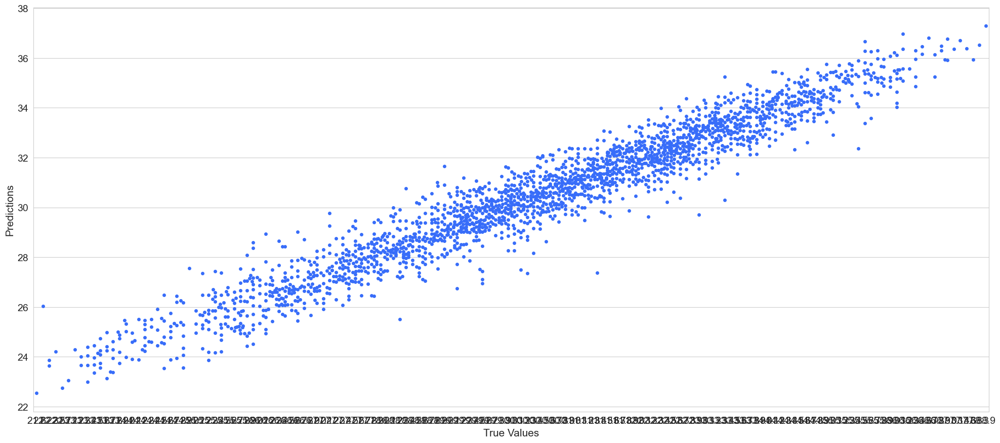

In [109]:
# Plotting True Values vs Predicted Values
plt.figure(figsize=(20,9))
sns.swarmplot(x=Y_test.round(2), y=y_pred)
print('\033[1m' + ' True Values Vs Predicted Value plot :' + '\033[0m')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()
plt.show()

In [110]:
# Saving the model
joblib.dump(Final_mod, 'Next_Tmax_Forecast_Final_Model.pkl')

['Next_Tmax_Forecast_Final_Model.pkl']

In [111]:
# Loading the saved model
Model = joblib.load("Next_Tmax_Forecast_Final_Model.pkl")

# Making predictions
actual = np.array(Y_test)
predicted = np.array(Model.predict(X_test))

# Creating the prediction DataFrame
df_Predicted = pd.DataFrame({"Actual_Values": actual, "Predicted_Values": predicted}, index=range(len(actual)))
df_Predicted


,Actual_Values,Predicted_Values
0,32.0,31.312843
1,30.1,30.174236
2,27.8,28.028093
3,27.6,27.022882
4,29.8,30.285969
...,...,...
2219,36.7,36.801521
2220,35.4,34.952602
2221,28.4,27.814924
2222,24.0,23.981869


In [112]:
# Machine Learning Model Building For Next_Tmin
X = df.drop(['Next_Tmin'], axis=1)
Y = df['Next_Tmin']


In [113]:
# Instantiate StandardScaler
scaler = StandardScaler()

# Fit and transform X using StandardScaler
X_scale = scaler.fit_transform(X)

In [114]:
# Split the data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y, test_size=0.33, random_state=42)

# Print the sizes of the resulting datasets
print('Training feature matrix size:', X_train.shape)
print('Training target vector size:', Y_train.shape)
print('Test feature matrix size:', X_test.shape)
print('Test target vector size:', Y_test.shape)

Training feature matrix size: (4515, 28)
Training target vector size: (4515,)
Test feature matrix size: (2224, 28)
Test target vector size: (2224,)


In [115]:
best_score = 0
best_random_state = 0

for state in range(1, 1000):
    X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y, random_state=state, test_size=0.33)
    model = LinearRegression()
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    score = r2_score(Y_test, y_pred)
    if score > best_score:
        best_score = score
        best_random_state = state

print('Best R2 Score:', best_score, 'achieved with Random State:', best_random_state)

Best R2 Score: 0.8542926342724021 achieved with Random State: 612


In [116]:
# Splitting the data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y, random_state=43, test_size=0.33)

# Training the Linear Regression model
lin_reg = LinearRegression()
lin_reg.fit(X_train, Y_train)

# Evaluating the model on training data
train_score = lin_reg.score(X_train, Y_train)
print(f'Training R2 Score: {train_score:.3f}')

# Making predictions on the test set
y_pred = lin_reg.predict(X_test)

# Printing predicted and actual values
print('\033[1m' + 'Predicted Wins:' + '\033[0m\n', y_pred)
print('\n')
print('\033[1m' + 'Actual Wins:' + '\033[0m\n', Y_test)


Training R2 Score: 0.836
Predicted Wins:
 [23.4191675  24.71717816 23.11041386 ... 22.43899622 26.47068034
 25.22601628]


Actual Wins:
 5006    23.0
947     25.6
3726    23.0
715     22.1
4242    24.0
        ... 
4097    24.6
3186    17.1
6641    23.1
3854    26.2
1190    25.7
Name: Next_Tmin, Length: 2224, dtype: float64


In [117]:
# Calculating and printing error metrics
print('\033[1m' + ' Error :' + '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test, y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\n')

# Calculating and printing R2 score
print('\033[1m' + ' R2 Score :' + '\033[0m')
print(r2_score(Y_test, y_pred, multioutput='variance_weighted'))

 Error :
Mean absolute error : 0.7323674790185187
Mean squared error : 0.8525958190135813
Root Mean Squared Error: 0.9233611530780257


 R2 Score :
0.8521112535217081


In [118]:
# Instantiate Linear Regression model
lin_reg = LinearRegression()

# Perform cross-validation
scores = cross_val_score(lin_reg, X_scale, Y, cv=3)

# Print cross-validation scores
print('\033[1m' + 'Cross Validation Scores for Linear Regression:' + '\033[0m\n')
print("Individual CV Scores:", scores)
print("Mean CV Score:", scores.mean())

Cross Validation Scores for Linear Regression:

Individual CV Scores: [0.741256   0.77842267 0.84155112]
Mean CV Score: 0.7870765967641132


In [119]:
# Define the models
rf = RandomForestRegressor()
dtc = DecisionTreeRegressor()
XT = ExtraTreesRegressor()
BR = BaggingRegressor()
adb = AdaBoostRegressor()
gradb = GradientBoostingRegressor()
xgb = XGBRegressor()

models = [rf, XT, dtc, adb, gradb, xgb]

# Train and evaluate each model
for model in models:
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    
    print('\n')                                        
    print('\033[1m' + ' Error of ' + str(model.__class__.__name__) + ':' + '\033[0m')
    print('Mean absolute error :', mean_absolute_error(Y_test, y_pred))
    print('Mean squared error :', mean_squared_error(Y_test, y_pred))
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test, y_pred)))
    print('\n')

    print('\033[1m' + ' R2 Score :' + '\033[0m')
    print(r2_score(Y_test, y_pred)) 
    print('---------------------------------------------------------------------------------------------------------------------------')



 Error of RandomForestRegressor:
Mean absolute error : 0.5572756294964032
Mean squared error : 0.529013927607914
Root Mean Squared Error: 0.7273334363329614


 R2 Score :
0.9082388103732351
---------------------------------------------------------------------------------------------------------------------------


 Error of ExtraTreesRegressor:
Mean absolute error : 0.5248080035971227
Mean squared error : 0.47149769469424496
Root Mean Squared Error: 0.6866568973615899


 R2 Score :
0.9182154058456325
---------------------------------------------------------------------------------------------------------------------------


 Error of DecisionTreeRegressor:
Mean absolute error : 0.8282823741007194
Mean squared error : 1.2409757194244606
Root Mean Squared Error: 1.1139908973705577


 R2 Score :
0.784744025876162
---------------------------------------------------------------------------------------------------------------------------


 Error of AdaBoostRegressor:
Mean absolute error :

In [120]:
# Cross Validation 
for model in models:
    scores = cross_val_score(model, X_scale, Y, cv=5)
    
    print('\n')
    print('\033[1m' + f'Cross Validation Scores for {model.__class__.__name__}:' + '\033[0m\n')
    print("Individual CV Scores:", scores)
    print("Mean CV Score:", scores.mean())
    print('---------------------------------------------------------------------------------------------------------------------------')



Cross Validation Scores for RandomForestRegressor:

Individual CV Scores: [0.7285484  0.6995284  0.80860978 0.87556019 0.85574543]
Mean CV Score: 0.7935984411795978
---------------------------------------------------------------------------------------------------------------------------


Cross Validation Scores for ExtraTreesRegressor:

Individual CV Scores: [0.72313853 0.70138081 0.80792331 0.87646385 0.87916837]
Mean CV Score: 0.7976149727413004
---------------------------------------------------------------------------------------------------------------------------


Cross Validation Scores for DecisionTreeRegressor:

Individual CV Scores: [0.4989504  0.48379858 0.61490309 0.76873287 0.65431823]
Mean CV Score: 0.6041406361816413
---------------------------------------------------------------------------------------------------------------------------


Cross Validation Scores for AdaBoostRegressor:

Individual CV Scores: [0.69618821 0.61958354 0.75577831 0.81892856 0.83261995]


In [121]:
# Define the parameter grid
parameter = {'n_estimators':[50,75,100],'gamma':np.arange(0,0.2,0.1),
              'booster' : ['gbtree','dart','gblinear'], 'max_depth':[4,6,8,10],
              'eta' : [0.001, 0.01, 0.1] }

# Instantiate the XGBoost regressor
xgb = XGBRegressor()

# Perform GridSearchCV
grid_search = GCV = GridSearchCV(xgb,parameter,verbose =10)
grid_search.fit(X_train,Y_train)


# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV 1/5; 1/216] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50
[CV 1/5; 1/216] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50;, score=0.075 total time=   0.0s
[CV 2/5; 1/216] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50
[CV 2/5; 1/216] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50;, score=0.072 total time=   0.0s
[CV 3/5; 1/216] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50
[CV 3/5; 1/216] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50;, score=0.072 total time=   0.0s
[CV 4/5; 1/216] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50
[CV 4/5; 1/216] END booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50;, score=0.071 total time=   0.0s
[CV 5/5; 1/216] START booster=gbtree, eta=0.001, gamma=0.0, max_depth=4, n_estimators=50
[CV 5/5; 1/

In [184]:
# Define and train the final model
Final_mod = XGBRegressor(n_estimators=100, booster='gbtree', eta=0.1, max_depth=6, gamma=0.1)
Final_mod.fit(X_train, Y_train)

# Predictions on the test set
y_pred = Final_mod.predict(X_test)

# Print error metrics
print('\n')
print('\033[1m' + ' Error in Final Model :' + '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test, y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\n')

# Print R2 score
print('\033[1m' + ' R2 Score of Final Model :' + '\033[0m')
print(r2_score(Y_test, y_pred))
print('\n')




 Error in Final Model :
Mean absolute error : 0.303177798244806
Mean squared error : 0.15268988504974262
Root Mean Squared Error: 0.3907555310545746


 R2 Score of Final Model :
0.38794393516306325




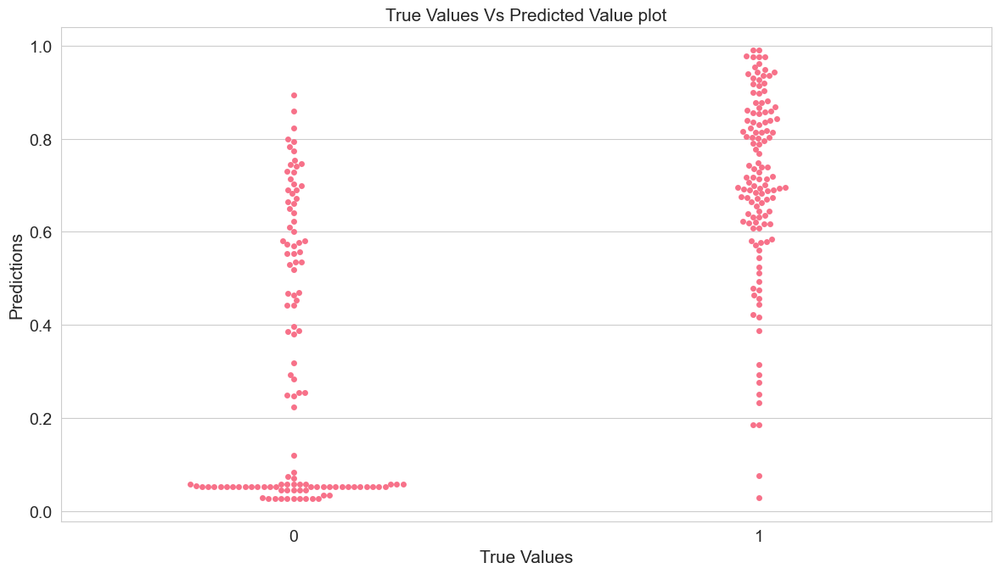

In [186]:
# Predict using the Final_mod
y_pred = Final_mod.predict(X_test)
# Create a figure
plt.figure(figsize=(12, 7))
# Create a swarm plot
sns.swarmplot(x=Y_test.round(2), y=y_pred)
# Plot labels and title
plt.title('True Values Vs Predicted Value plot', fontsize=15)
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
# Adjust layout
plt.tight_layout()
plt.show()

In [187]:
joblib.dump(Final_mod, 'Next_Tmin_Forecast_Final_Model.pkl')

['Next_Tmin_Forecast_Final_Model.pkl']

In [188]:
# Loading the saved model
Model = joblib.load("Next_Tmin_Forecast_Final_Model.pkl")

# Predictions on the test set
y_pred = Model.predict(X_test)

# Create DataFrame for actual and predicted values
df_Predicted = pd.DataFrame({
    "Actual Values": Y_test.values,
    "Predicted Values": y_pred
})

# Display the DataFrame
df_Predicted.head()  

,Actual Values,Predicted Values
0,0,0.026152
1,0,0.255157
2,0,0.051466
3,0,0.894029
4,1,0.543704


### Question 3

In [190]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')
import joblib
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.preprocessing import PowerTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score
from sklearn import neighbors
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

In [192]:
# Importing dataset file using pandas
df=pd.read_csv(r"C:\Users\ADMIN\Downloads\loan_prediction.csv")

In [194]:
headers = ['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education', 
           'Self_Employed', 'Applicant Income', 'CoapplicantIncome', 
           'LoanAmount', 'Loan_Amount_Term', 'Credit_History', 'Property_Area', 
           'Loan_Status']

In [196]:
df = pd.read_csv(r"C:\Users\ADMIN\Downloads\loan_prediction.csv", header=0, names=headers)

In [198]:
df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,Applicant Income,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
1,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
2,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
3,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
4,LP001011,Male,Yes,2,Graduate,Yes,5417,4196.0,267.0,360.0,1.0,Urban,Y


In [199]:
df.shape

(613, 13)

In [202]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 613 entries, 0 to 612
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            613 non-null    object 
 1   Gender             600 non-null    object 
 2   Married            610 non-null    object 
 3   Dependents         598 non-null    object 
 4   Education          613 non-null    object 
 5   Self_Employed      581 non-null    object 
 6   Applicant Income   613 non-null    int64  
 7   CoapplicantIncome  613 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   599 non-null    float64
 10  Credit_History     563 non-null    float64
 11  Property_Area      613 non-null    object 
 12  Loan_Status        613 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.4+ KB


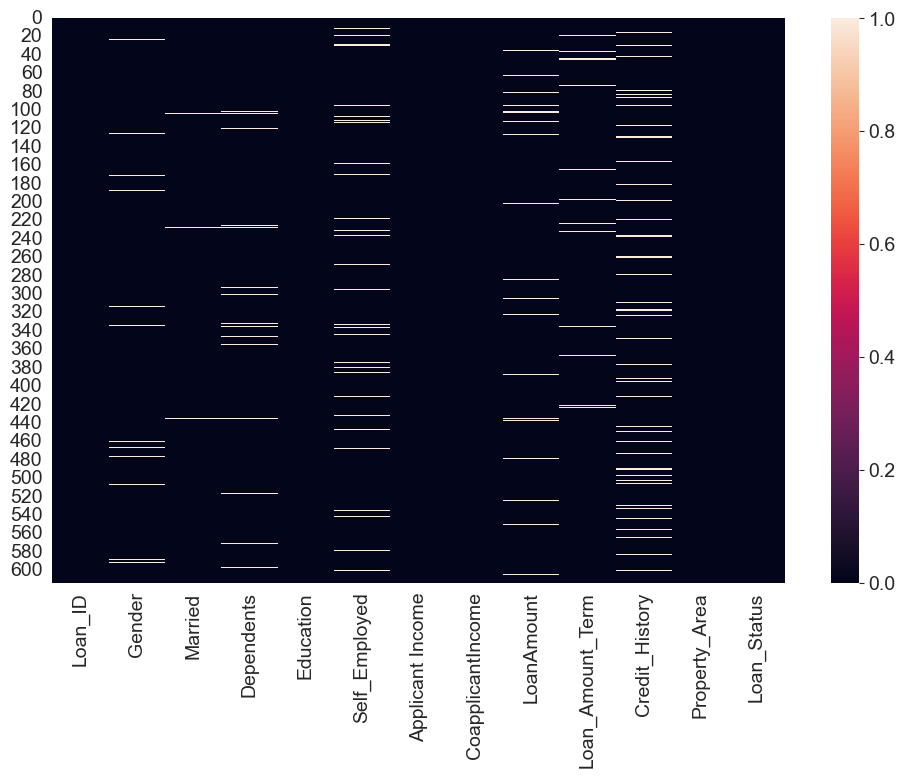

In [204]:
# Setting up the figure size
plt.figure(figsize=(10, 8))
# Creating the heatmap
sns.heatmap(df.isnull())
# Display the plot
plt.show()

In [205]:
# Calculate the count of missing values for each column and sort in descending order
null_counts = df.isna().sum().sort_values(ascending=False)
# Compute the percentage of missing values relative to the DataFrame's length
missing_percentage = (null_counts / len(df)) * 100
# Combine the missing values count and percentage into a single DataFrame for better readability
missing_data_summary = pd.concat([null_counts, missing_percentage], axis=1, keys=['Total Missing', 'Percentage Missing'])
# Print the summary of missing data
print(missing_data_summary)


                   Total Missing  Percentage Missing
Credit_History                50            8.156607
Self_Employed                 32            5.220228
LoanAmount                    21            3.425775
Dependents                    15            2.446982
Loan_Amount_Term              14            2.283850
Gender                        13            2.120718
Married                        3            0.489396
Loan_ID                        0            0.000000
Education                      0            0.000000
Applicant Income               0            0.000000
CoapplicantIncome              0            0.000000
Property_Area                  0            0.000000
Loan_Status                    0            0.000000


In [206]:
# List of categorical columns to be analyzed
categorical_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
                       'Loan_Amount_Term', 'Property_Area', 'Credit_History', 'Loan_Status']
# Iterate through each column in the categorical list
for column in categorical_columns:
    # Print the column name
    print(column)
    # Display the count of unique values for the current column
    print(df[column].value_counts())
    # Print a separator line for better readability
    print('-' * 80)

Gender
Gender
Male      488
Female    112
Name: count, dtype: int64
--------------------------------------------------------------------------------
Married
Married
Yes    398
No     212
Name: count, dtype: int64
--------------------------------------------------------------------------------
Dependents
Dependents
0     344
1     102
2     101
3+     51
Name: count, dtype: int64
--------------------------------------------------------------------------------
Education
Education
Graduate        479
Not Graduate    134
Name: count, dtype: int64
--------------------------------------------------------------------------------
Self_Employed
Self_Employed
No     499
Yes     82
Name: count, dtype: int64
--------------------------------------------------------------------------------
Loan_Amount_Term
Loan_Amount_Term
360.0    511
180.0     44
480.0     15
300.0     13
240.0      4
84.0       4
120.0      3
60.0       2
36.0       2
12.0       1
Name: count, dtype: int64
-----------------------

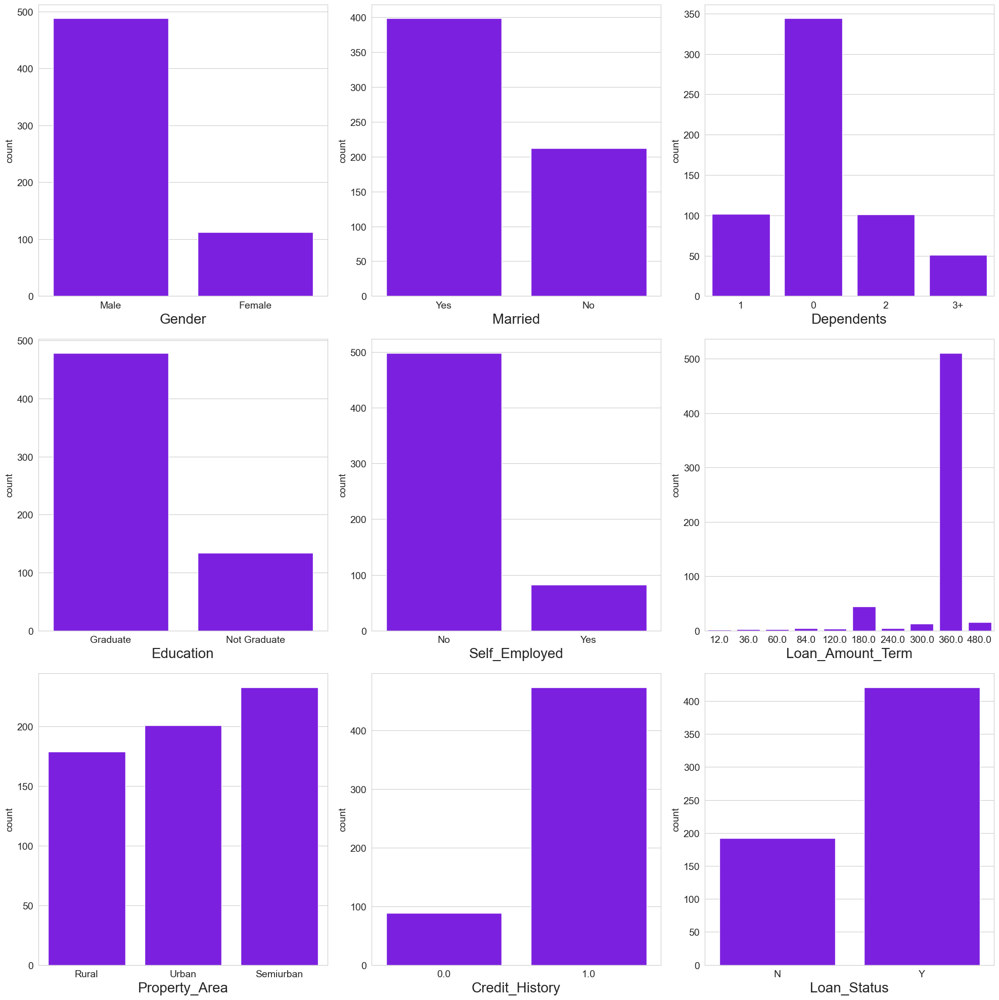

In [207]:
sns.set_palette('gist_rainbow_r')
fig, axes = plt.subplots(3, 3, figsize=(20, 20), facecolor='white')
category = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
            'Loan_Amount_Term', 'Property_Area', 'Credit_History', 'Loan_Status']

for ax, cat in zip(axes.flat, category):
    sns.countplot(x=df[cat], ax=ax)
    ax.set_xlabel(cat, fontsize=20)

plt.tight_layout()
plt.show()

<Figure size 1400x600 with 0 Axes>

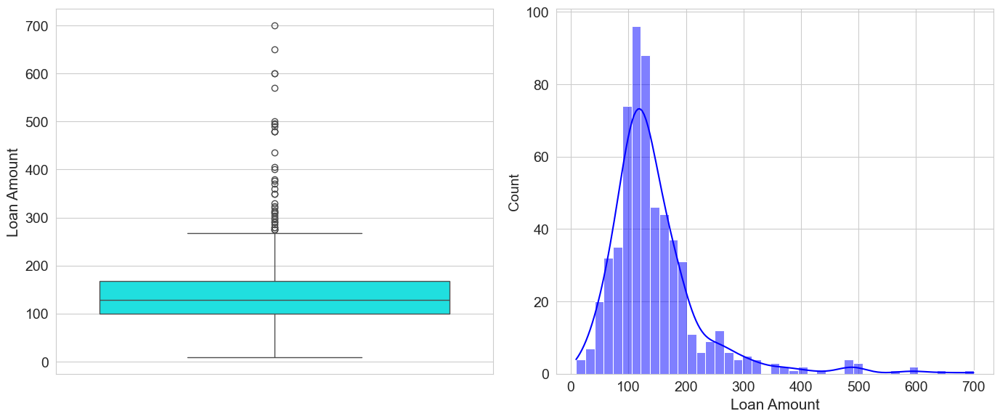

In [209]:
plt.figure(figsize=(14, 6))

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Boxplot
sns.boxplot(y='LoanAmount', data=df, color='cyan', ax=axes[0])
axes[0].set_ylabel('Loan Amount', fontsize=15)

# Distribution plot
sns.histplot(df['LoanAmount'], kde=True, color='b', ax=axes[1])
axes[1].set_xlabel('Loan Amount', fontsize=15)

plt.tight_layout()
plt.show()

In [211]:
print("Mean of Loan Amount:", df['LoanAmount'].mean())
print("Median of Loan Amount:", df['LoanAmount'].median())

Mean of Loan Amount: 146.41216216216216
Median of Loan Amount: 128.0


In [212]:
# Function to impute missing values
def impute_missing_values(df, columns, method='mode'):
    for column in columns:
        if method == 'mode':
            df[column].fillna(df[column].mode()[0], inplace=True)
        elif method == 'median':
            df[column].fillna(df[column].median(), inplace=True)

# Imputating missing values for categorical features using mode
categorical_features = ['Credit_History', 'Self_Employed', 'Dependents', 'Gender', 'Married']
impute_missing_values(df, categorical_features, method='mode')

# Imputating missing values for numerical features
numerical_features = ['Loan_Amount_Term']
impute_missing_values(df, numerical_features, method='mode')

# Imputating missing values for 'LoanAmount' using median
df['LoanAmount'].fillna(df['LoanAmount'].median(), inplace=True)

# Alternatively, you can add 'LoanAmount' to numerical_features and use a different method
numerical_features_with_median = ['LoanAmount']
impute_missing_values(df, numerical_features_with_median, method='median')


In [213]:
# Calculate the number of missing values in each column
missing_values = df.isnull().sum().sort_values(ascending=False)

# Calculate the percentage of missing values in each column
percentage_missing_values = (missing_values / len(df)) * 100

# Combine the number and percentage of missing values into a single DataFrame
missing_data_summary = pd.concat([missing_values, percentage_missing_values], axis=1, keys=['Missing Values', '% Missing data'])

# Display the result
print(missing_data_summary)

                   Missing Values  % Missing data
Loan_ID                         0             0.0
Gender                          0             0.0
Married                         0             0.0
Dependents                      0             0.0
Education                       0             0.0
Self_Employed                   0             0.0
Applicant Income                0             0.0
CoapplicantIncome               0             0.0
LoanAmount                      0             0.0
Loan_Amount_Term                0             0.0
Credit_History                  0             0.0
Property_Area                   0             0.0
Loan_Status                     0             0.0


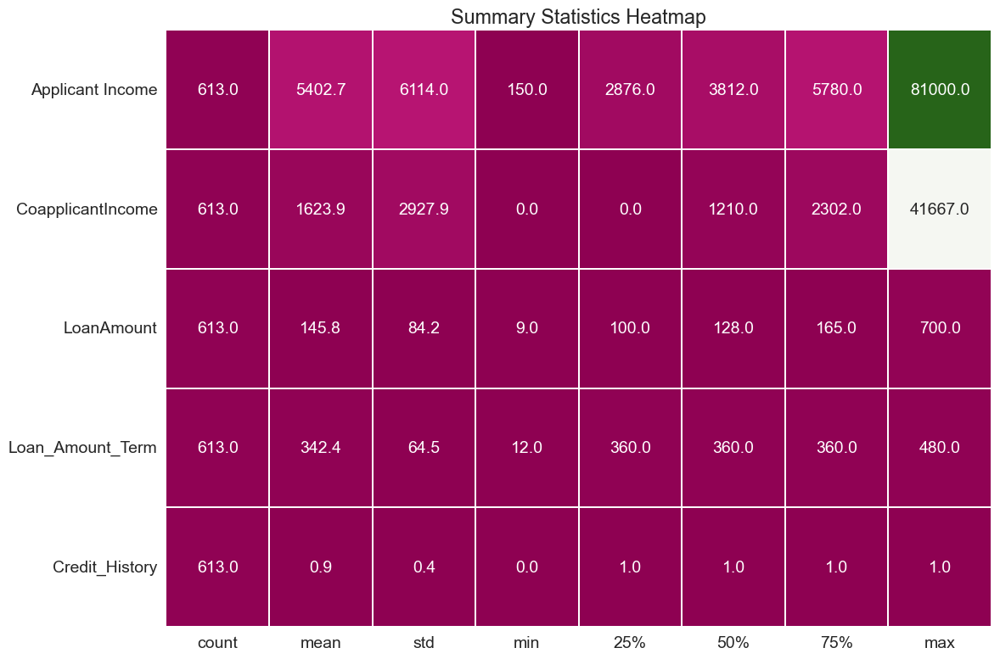

In [214]:
# Visualize the statistics of the columns using a heatmap
plt.figure(figsize=(12, 8))
# Round the describe output to one decimal place for better visualization
stats = df.describe().transpose().round(1)
sns.heatmap(stats, linewidths=0.1, fmt='0.1f', annot=True, cmap='PiYG', cbar=False)
plt.title('Summary Statistics Heatmap')
plt.show()

In [215]:
df.describe()

,Applicant Income,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History
count,613.000000,613.000000,613.000000,613.000000,613.000000
mean,5402.732463,1623.890571,145.781403,342.381729,0.854812
std,6114.004114,2927.903583,84.172857,64.477319,0.352578
min,150.000000,0.000000,9.000000,12.000000,0.000000
25%,2876.000000,0.000000,100.000000,360.000000,1.000000
50%,3812.000000,1210.000000,128.000000,360.000000,1.000000
75%,5780.000000,2302.000000,165.000000,360.000000,1.000000
max,81000.000000,41667.000000,700.000000,480.000000,1.000000


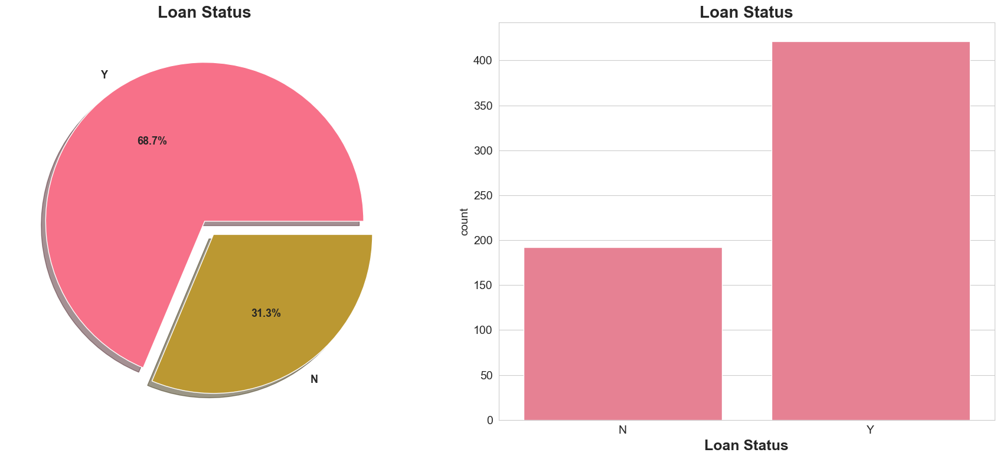

In [216]:
# Set plot aesthetics
plt.rcParams["figure.autolayout"] = True
sns.set_palette('husl')

# Create subplots
f, ax = plt.subplots(1, 2, figsize=(18, 8))

# Pie chart for Loan Status
df['Loan_Status'].value_counts().plot.pie(
    explode=[0, 0.1],
    autopct='%2.1f%%',
    textprops={'fontweight': 'bold', 'fontsize': 13},
    ax=ax[0],
    shadow=True
)
ax[0].set_title('Loan Status', fontsize=20, fontweight='bold')
ax[0].set_ylabel('')

# Count plot for Loan Status
sns.countplot(x='Loan_Status', data=df, ax=ax[1])
ax[1].set_title('Loan Status', fontsize=20, fontweight='bold')
ax[1].set_xlabel("Loan Status", fontsize=18, fontweight='bold')

# Show the plots
plt.show()

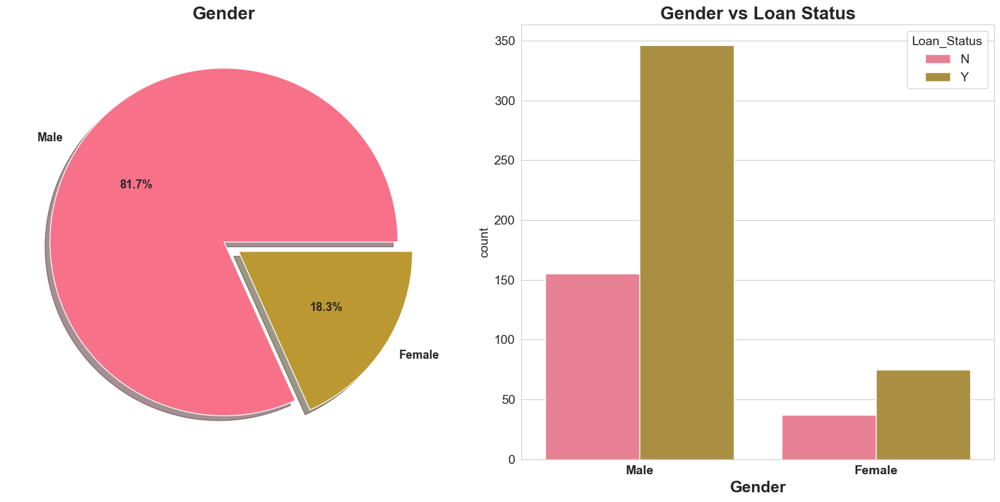

In [218]:
# Set plot aesthetics
plt.rcParams["figure.autolayout"] = True
sns.set_palette('husl')

# Create subplots
f, ax = plt.subplots(1, 2, figsize=(16, 8))

# Pie chart for Gender distribution
df['Gender'].value_counts().plot.pie(
    explode=[0, 0.1],
    autopct='%2.1f%%',
    textprops={'fontweight': 'bold', 'fontsize': 13},
    ax=ax[0],
    shadow=True
)
ax[0].set_title('Gender', fontsize=20, fontweight='bold')
ax[0].set_ylabel('')

# Count plot for Gender vs. Loan Status
sns.countplot(x='Gender', hue='Loan_Status', data=df, ax=ax[1])
ax[1].set_title('Gender vs Loan Status', fontsize=20, fontweight='bold')
ax[1].set_xlabel("Gender", fontsize=18, fontweight='bold')

# Adjust x-ticks
plt.xticks(fontsize=14, fontweight='bold')

# Show the plots
plt.tight_layout()
plt.show()

In [219]:
# Create a cross-tabulation of Gender and Loan Status
crosstab_result = pd.crosstab(df['Gender'], df['Loan_Status'], margins=True)

# Style the crosstab with a background gradient
styled_crosstab = crosstab_result.style.background_gradient(cmap='summer_r')

# Display the styled crosstab
styled_crosstab

Loan_Status,N,Y,All
Gender,,,
Female,37,75,112
Male,155,346,501
All,192,421,613


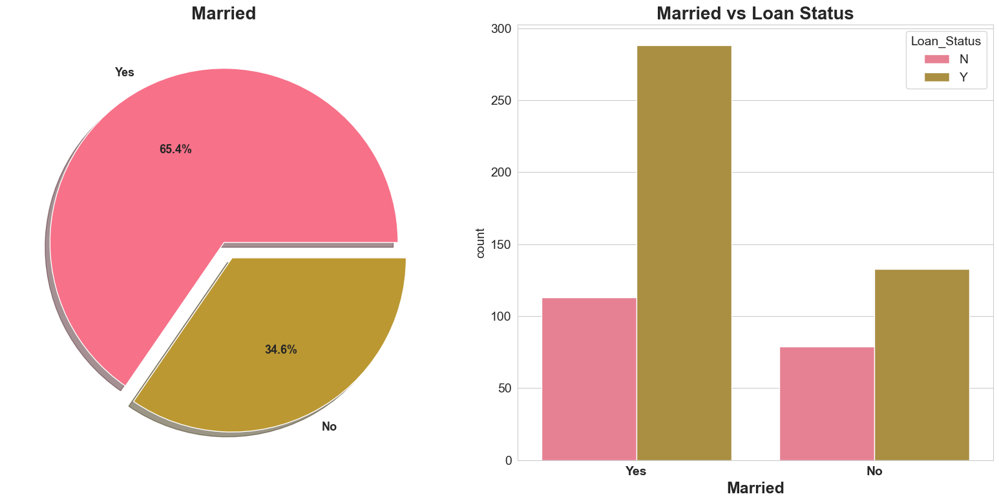

In [220]:
# Set plot aesthetics
plt.rcParams["figure.autolayout"] = True
sns.set_palette('husl')

# Create subplots
f, ax = plt.subplots(1, 2, figsize=(16, 8))

# Pie chart for Married distribution
df['Married'].value_counts().plot.pie(
    explode=[0, 0.1],
    autopct='%2.1f%%',
    textprops={'fontweight': 'bold', 'fontsize': 13},
    ax=ax[0],
    shadow=True
)
ax[0].set_title('Married', fontsize=20, fontweight='bold')
ax[0].set_ylabel('')

# Count plot for Married vs. Loan Status
sns.countplot(x='Married', hue='Loan_Status', data=df, ax=ax[1])
ax[1].set_title('Married vs Loan Status', fontsize=20, fontweight='bold')
ax[1].set_xlabel("Married", fontsize=18, fontweight='bold')

# Adjust x-ticks
plt.xticks(fontsize=14, fontweight='bold')

# Show the plots
plt.tight_layout()
plt.show()

In [221]:
# Create a cross-tabulation of Gender and Married against Loan Status
crosstab_result = pd.crosstab(
    [df['Gender'], df['Married']],
    [df['Loan_Status']],
    margins=True
)

# Style the crosstab with a background gradient
styled_crosstab = crosstab_result.style.background_gradient(cmap='gist_rainbow_r')

# Display the styled crosstab
styled_crosstab

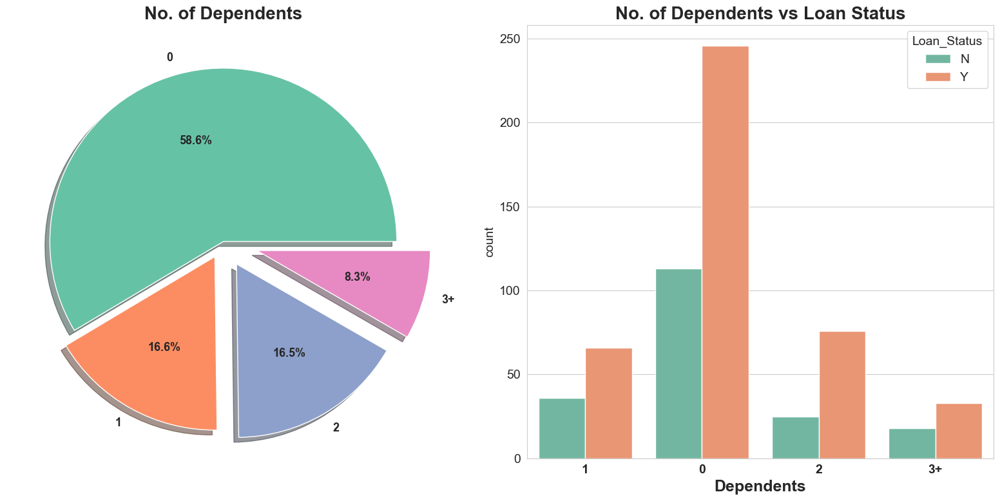

In [222]:
# Set plot aesthetics
plt.rcParams["figure.autolayout"] = True
sns.set_palette('Set2')

# Create subplots
f, ax = plt.subplots(1, 2, figsize=(16, 8))

# Pie chart for Dependents distribution
df['Dependents'].value_counts().plot.pie(
    explode=[0, 0.1, 0.15, 0.2],
    autopct='%2.1f%%',
    textprops={'fontweight': 'bold', 'fontsize': 13},
    ax=ax[0],
    shadow=True
)
ax[0].set_title('No. of Dependents', fontsize=20, fontweight='bold')
ax[0].set_ylabel('')

# Count plot for Dependents vs. Loan Status
sns.countplot(x='Dependents', hue='Loan_Status', data=df, ax=ax[1])
ax[1].set_title('No. of Dependents vs Loan Status', fontsize=20, fontweight='bold')
ax[1].set_xlabel("Dependents", fontsize=18, fontweight='bold')

# Adjust x-ticks
plt.xticks(fontsize=14, fontweight='bold')

# Show the plots
plt.tight_layout()
plt.show()

In [224]:
# Create a cross-tabulation of Dependents against Loan Status and Gender
crosstab_result = pd.crosstab(
    [df['Dependents']],
    [df['Loan_Status'], df['Gender']],
    margins=True
)

# Style the crosstab with a background gradient
styled_crosstab = crosstab_result.style.background_gradient(cmap='summer_r')

# Display the styled crosstab
styled_crosstab

In [227]:
# Create a cross-tabulation of Dependents and Gender against Loan Status
crosstab_result = pd.crosstab(
    [df['Dependents'], df['Gender']],
    [df['Loan_Status']],
    margins=True
)

# Style the crosstab with a background gradient
styled_crosstab = crosstab_result.style.background_gradient(cmap='Blues')

# Display the styled crosstab
styled_crosstab

In [228]:
df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,Applicant Income,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
1,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
2,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
3,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
4,LP001011,Male,Yes,2,Graduate,Yes,5417,4196.0,267.0,360.0,1.0,Urban,Y


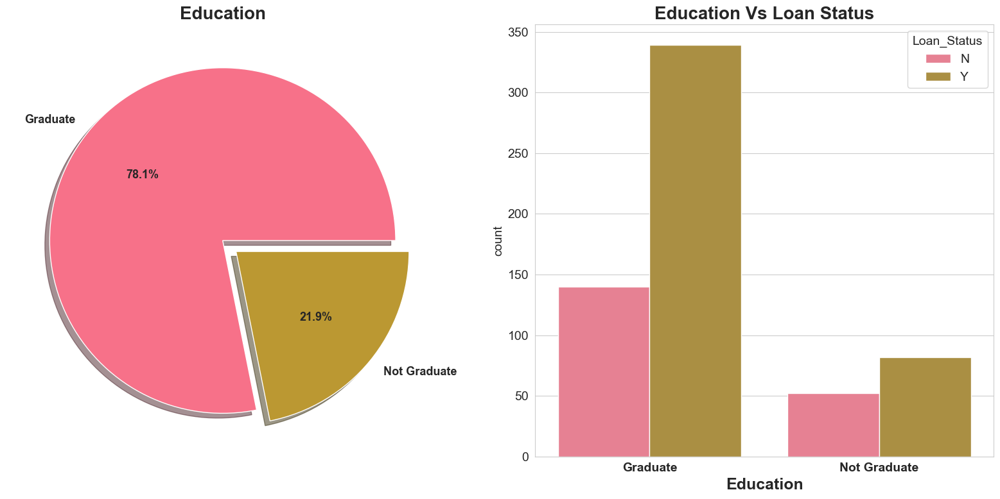

In [229]:
# Set plot aesthetics
plt.rcParams["figure.autolayout"] = True
sns.set_palette('husl')

# Create subplots
f, ax = plt.subplots(1, 2, figsize=(16, 8))

# Pie chart for Education distribution
df['Education'].value_counts().plot.pie(
    explode=[0, 0.1],
    autopct='%2.1f%%',
    textprops={'fontweight': 'bold', 'fontsize': 13},
    ax=ax[0],
    shadow=True
)
ax[0].set_title('Education', fontsize=20, fontweight='bold')
ax[0].set_ylabel('')

# Count plot for Education vs. Loan Status
sns.countplot(x='Education', hue='Loan_Status', data=df, ax=ax[1])
ax[1].set_title('Education Vs Loan Status', fontsize=20, fontweight='bold')
ax[1].set_xlabel("Education", fontsize=18, fontweight='bold')

# Adjust x-ticks for readability
plt.xticks(fontsize=14, fontweight='bold')

# Show the plots
plt.tight_layout()
plt.show()

In [230]:
# Create a cross-tabulation of Dependents and Gender against Loan Status
crosstab_result = pd.crosstab(
    [df['Dependents'], df['Gender']],
    [df['Loan_Status']],
    margins=True
)

# Style the crosstab with a background gradient
styled_crosstab = crosstab_result.style.background_gradient(cmap='Blues')

# Display the styled crosstab
styled_crosstab

In [231]:
df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,Applicant Income,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
1,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
2,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
3,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
4,LP001011,Male,Yes,2,Graduate,Yes,5417,4196.0,267.0,360.0,1.0,Urban,Y


In [232]:
Category=['Gender','Married','Education','Self_Employed','Property_Area','Loan_Status']

In [233]:
# Create a Label Encoder instance
le = LabelEncoder()

# Apply Label Encoding to categorical variables
for i in Category:
    df[i] = le.fit_transform(df[i])

# Display the updated DataFrame
df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,Applicant Income,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001003,1,1,1,0,0,4583,1508.0,128.0,360.0,1.0,0,0
1,LP001005,1,1,0,0,1,3000,0.0,66.0,360.0,1.0,2,1
2,LP001006,1,1,0,1,0,2583,2358.0,120.0,360.0,1.0,2,1
3,LP001008,1,0,0,0,0,6000,0.0,141.0,360.0,1.0,2,1
4,LP001011,1,1,2,0,1,5417,4196.0,267.0,360.0,1.0,2,1


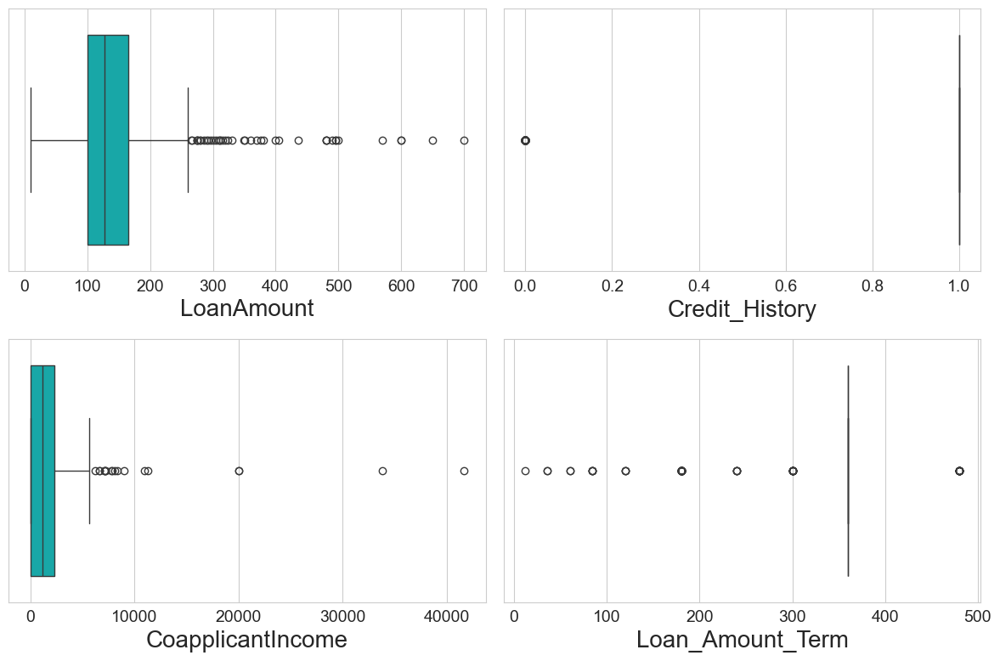

In [234]:
# Set figure size and face color
plt.figure(figsize=(12, 8), facecolor='white')
plotnumber = 1

# List of numerical columns
Numerical = ['LoanAmount', 'Credit_History','CoapplicantIncome', 'Loan_Amount_Term']  # Add your numerical columns here

# Create boxplots for each numerical column
for column in Numerical:
    if plotnumber <= 4:  # Adjust according to the number of numerical columns
        ax = plt.subplot(2, 2, plotnumber)
        sns.boxplot(x=df[column], color='c')
        plt.xlabel(column, fontsize=20)
    plotnumber += 1

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


In [235]:
df.drop(["Loan_ID"], axis=1, inplace=True, errors='ignore')

In [237]:
# Map the 'Dependents' values to numeric
df['Dependents'] = df['Dependents'].map({'0': 0, '1': 1, '2': 2, '3+': 3})
df['Dependents'] =pd.to_numeric(df['Dependents'])

In [239]:
# Calculate the Z-scores of the DataFrame
z = np.abs(zscore(df))

# Set the threshold for identifying outliers
threshold = 3

# Remove outliers
df1 = df[(z < threshold).all(axis=1)]

# Print the shape of the DataFrame before and after outlier removal
print("Shape of the dataframe before removing outliers: ", df.shape)
print("Shape of the dataframe after removing outliers: ", df1.shape)

# Calculate and print the percentage of data loss
percentage_loss = (df.shape[0] - df1.shape[0]) / df.shape[0] * 100
print("Percentage of data loss post outlier removal: ", percentage_loss)

# Reassign the modified DataFrame to the original DataFrame variable
df = df1.copy()

Shape of the dataframe before removing outliers:  (613, 12)
Shape of the dataframe after removing outliers:  (576, 12)
Percentage of data loss post outlier removal:  6.035889070146819


In [241]:
# Calculate and print the percentage of data loss
initial_count = 614
final_count = 577
percentage_data_loss = ((initial_count - final_count) / initial_count) * 100

print("\033[1m" + 'Percentage Data Loss :' + "\033[0m", percentage_data_loss, '%')

Percentage Data Loss : 6.026058631921824 %


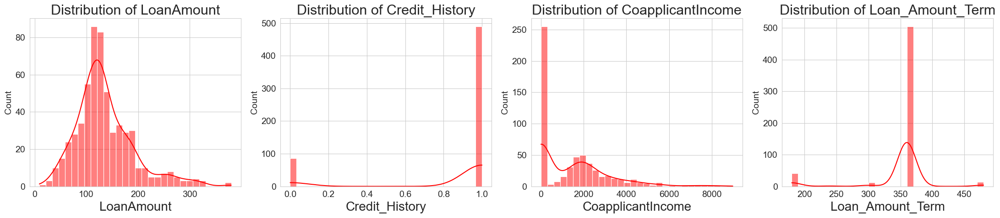

In [244]:
# Set the figure size and background color
plt.figure(figsize=(22, 5), facecolor='white')
plotnum = 1

# Create distribution plots for each numerical column
for col in Numerical:
    if plotnum <= 4:  # Adjust based on the number of columns
        plt.subplot(1, 4, plotnum)
        sns.histplot(df[col], kde=True, color='r', bins=30)  # Specify bins for better visibility
        plt.xlabel(col, fontsize=20)
        plt.title(f'Distribution of {col}', fontsize=22)  # Optional title for clarity
    plotnum += 1

# Show the plots
plt.tight_layout()
plt.show()

In [246]:
df.skew()

Gender              -1.620181
Married             -0.635432
Dependents           1.049515
Education            1.303909
Self_Employed        2.249864
Applicant Income     2.149534
CoapplicantIncome    1.348577
LoanAmount           1.149904
Loan_Amount_Term    -2.096104
Credit_History      -1.973183
Property_Area       -0.052313
Loan_Status         -0.819913
dtype: float64

In [247]:
# Assuming df is your DataFrame
skew = ['Applicant Income', 'CoapplicantIncome', 'LoanAmount']

# Initialize the PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

# Apply the transformation to the specified columns
df[skew] = scaler.fit_transform(df[skew])

# Verify the transformation
print(df[skew].describe())

       Applicant Income  CoapplicantIncome    LoanAmount
count      5.760000e+02       5.760000e+02  5.760000e+02
mean      -1.364649e-16      -2.312965e-17 -5.574245e-16
std        1.000869e+00       1.000869e+00  1.000869e+00
min       -5.419211e+00      -1.124542e+00 -4.236592e+00
25%       -6.325141e-01      -1.124542e+00 -5.717057e-01
50%       -1.267417e-01       6.812222e-01  7.985691e-04
75%        5.729475e-01       8.782571e-01  5.597176e-01
max        3.093995e+00       1.383137e+00  3.154776e+00


In [249]:
# Before transformation
print(df[skew].skew())

# After transformation
print(df[skew].skew())

Applicant Income     0.027642
CoapplicantIncome   -0.195199
LoanAmount           0.048140
dtype: float64
Applicant Income     0.027642
CoapplicantIncome   -0.195199
LoanAmount           0.048140
dtype: float64


In [251]:
df.skew()

Gender              -1.620181
Married             -0.635432
Dependents           1.049515
Education            1.303909
Self_Employed        2.249864
Applicant Income     0.027642
CoapplicantIncome   -0.195199
LoanAmount           0.048140
Loan_Amount_Term    -2.096104
Credit_History      -1.973183
Property_Area       -0.052313
Loan_Status         -0.819913
dtype: float64

In [252]:
df.corr()

,Gender,Married,Dependents,Education,Self_Employed,Applicant Income,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
Gender,1.000000,0.380814,0.188884,0.046166,-0.005894,0.058087,0.235772,0.172181,-0.105200,0.012830,-0.027398,0.016863
Married,0.380814,1.000000,0.328869,0.023579,-0.016708,-0.023240,0.333997,0.182176,-0.127012,0.020334,0.013538,0.090795
Dependents,0.188884,0.328869,1.000000,0.069182,0.044090,0.106949,0.002642,0.131831,-0.087143,-0.019775,0.003875,0.018730
Education,0.046166,0.023579,0.069182,1.000000,-0.007500,-0.175528,0.048653,-0.128742,-0.090333,-0.074853,-0.067547,-0.092087
Self_Employed,-0.005894,-0.016708,0.044090,-0.007500,1.000000,0.212752,-0.088145,0.117232,-0.032767,-0.016117,-0.027482,-0.026095
Applicant Income,0.058087,-0.023240,0.106949,-0.175528,0.212752,1.000000,-0.360083,0.432263,-0.069746,0.028325,-0.012829,-0.003270
CoapplicantIncome,0.235772,0.333997,0.002642,0.048653,-0.088145,-0.360083,1.000000,0.200473,0.001334,0.007360,-0.072297,0.080730
LoanAmount,0.172181,0.182176,0.131831,-0.128742,0.117232,0.432263,0.200473,1.000000,0.049060,-0.003630,-0.098223,-0.023618
Loan_Amount_Term,-0.105200,-0.127012,-0.087143,-0.090333,-0.032767,-0.069746,0.001334,0.049060,1.000000,0.027230,-0.057574,-0.020569
Credit_History,0.012830,0.020334,-0.019775,-0.074853,-0.016117,0.028325,0.007360,-0.003630,0.027230,1.000000,-0.009026,0.560753


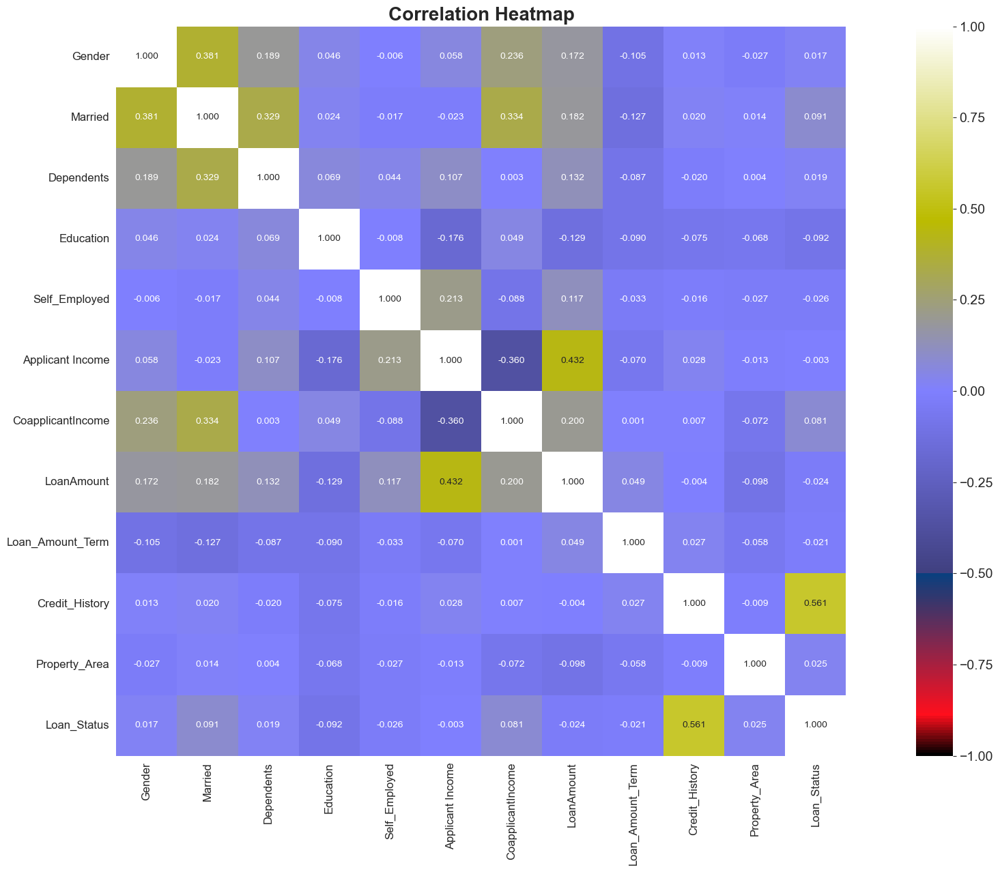

In [254]:
# Set the figure size
plt.figure(figsize=(21, 13))

# Create the heatmap
sns.heatmap(
    df.corr(),
    vmin=-1,
    vmax=1,
    annot=True,
    square=True,
    fmt='0.3f',
    annot_kws={'size': 10},
    cmap="gist_stern"
)

# Adjust the tick sizes
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.title('Correlation Heatmap', fontsize=20, fontweight='bold')  # Optional title
plt.show()

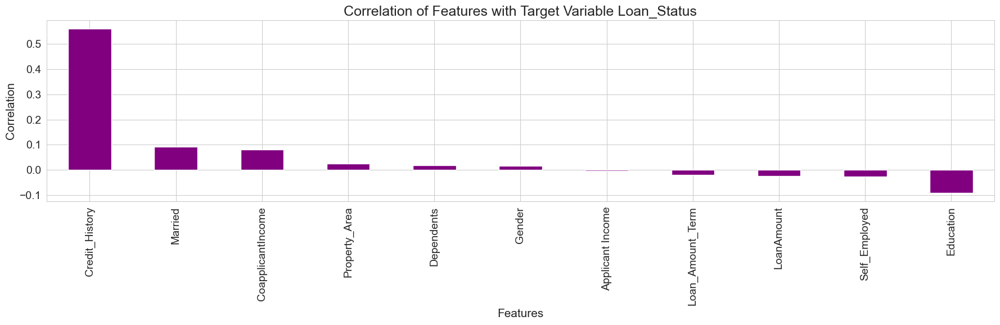

In [255]:
# Set the figure size
plt.figure(figsize=(18, 6))

# Plot the correlation of features with Loan_Status
df.corr()['Loan_Status'].drop(['Loan_Status']).sort_values(ascending=False).plot(
    kind='bar',
    color='purple'
)

# Set labels and title
plt.xlabel('Features', fontsize=15)
plt.ylabel('Correlation', fontsize=15)
plt.title('Correlation of Features with Target Variable Loan_Status', fontsize=18)

# Show the plot
plt.show()

In [256]:
# Assuming df is your DataFrame with features
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
vif['Features'] = df.columns

# Display the VIF DataFrame
print(vif)

          VIF           Features
0    6.121050             Gender
1    3.975886            Married
2    1.779143         Dependents
3    1.355643          Education
4    1.197721      Self_Employed
5    1.755191   Applicant Income
6    1.594348  CoapplicantIncome
7    1.548810         LoanAmount
8   10.398823   Loan_Amount_Term
9    9.464229     Credit_History
10   2.649954      Property_Area
11   4.810253        Loan_Status


In [258]:
df.Loan_Status.value_counts()

Loan_Status
1    397
0    179
Name: count, dtype: int64

In [260]:
# Define features and target variable
X = df.drop(['Loan_Status'], axis=1)  # Features
Y = df['Loan_Status']  # Target variable

# Oversampling with SMOTE (only on training data)
oversample = SMOTE(random_state=42)
X_resampled, Y_resampled = oversample.fit_resample(X, Y)

# Scaling the features
scaler = StandardScaler()
X_scale = scaler.fit_transform(X_resampled)

In [261]:
# Assuming X and Y have already been defined as your features and target variable
oversample = SMOTE(random_state=42)
# Applying SMOTE to the dataset
X_resampled, Y_resampled = oversample.fit_resample(X, Y)

In [262]:
Y.value_counts()

Loan_Status
1    397
0    179
Name: count, dtype: int64

In [265]:
# Assuming X has already been defined as your feature set
scaler = StandardScaler()
# Fit and transform the feature set
X_scaled = scaler.fit_transform(X)
# Convert the scaled features back to a DataFrame (optional)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

In [266]:
# Splitting the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y_resampled, random_state=99, test_size=0.3)

# Print the sizes of the training and testing sets
print('Training feature matrix size:', X_train.shape)
print('Training target vector size:', Y_train.shape)
print('Test feature matrix size:', X_test.shape)
print('Test target vector size:', Y_test.shape)

Training feature matrix size: (555, 11)
Training target vector size: (555,)
Test feature matrix size: (239, 11)
Test target vector size: (239,)


In [269]:
# Initialize variables to track the best accuracy and random state
maxAccu = 0
maxRS = 0

# Loop through different random states
for i in range(1, 250):
    X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y_resampled, test_size=0.3, random_state=i)
    log_reg = LogisticRegression()
    log_reg.fit(X_train, Y_train)
    y_pred = log_reg.predict(X_test)
    acc = accuracy_score(Y_test, y_pred)
    
    # Update the maximum accuracy and corresponding random state
    if acc > maxAccu:
        maxAccu = acc
        maxRS = i

# Print the best accuracy and random state
print('Best accuracy is', maxAccu, 'on Random_state', maxRS)

Best accuracy is 0.7907949790794979 on Random_state 97


In [270]:
# Split the data
X_train, X_test, Y_train, Y_test = train_test_split(X_scale, Y_resampled, random_state=78, test_size=0.3)

# Initialize and fit the logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train, Y_train)

# Predict on the test set
y_pred = log_reg.predict(X_test)

# Evaluation
print('\033[1m' + 'Logistic Regression Evaluation' + '\033[0m')
print('\n')
print('\033[1m' + 'Accuracy Score of Logistic Regression :' + '\033[0m', accuracy_score(Y_test, y_pred))
print('\n')
print('\033[1m' + 'Confusion Matrix of Logistic Regression :' + '\033[0m \n', confusion_matrix(Y_test, y_pred))
print('\n')
print('\033[1m' + 'Classification Report of Logistic Regression' + '\033[0m \n', classification_report(Y_test, y_pred))

Logistic Regression Evaluation


Accuracy Score of Logistic Regression : 0.7489539748953975


Confusion Matrix of Logistic Regression : 
 [[ 64  50]
 [ 10 115]]


Classification Report of Logistic Regression 
               precision    recall  f1-score   support

           0       0.86      0.56      0.68       114
           1       0.70      0.92      0.79       125

    accuracy                           0.75       239
   macro avg       0.78      0.74      0.74       239
weighted avg       0.78      0.75      0.74       239



RMSE value for k = 1 is: 0.5052030537546389
RMSE value for k = 2 is: 0.5373108307770214
RMSE value for k = 3 is: 0.4619406036915484
RMSE value for k = 4 is: 0.5174769818825207
RMSE value for k = 5 is: 0.50104493321917
RMSE value for k = 6 is: 0.5052030537546389
RMSE value for k = 7 is: 0.50104493321917
RMSE value for k = 8 is: 0.5215041008435626
RMSE value for k = 9 is: 0.5174769818825207
RMSE value for k = 10 is: 0.5373108307770214
RMSE value for k = 11 is: 0.5373108307770214
RMSE value for k = 12 is: 0.5488672244956179
RMSE value for k = 13 is: 0.5294664560040351
RMSE value for k = 14 is: 0.5450423191891736
RMSE value for k = 15 is: 0.5215041008435626
RMSE value for k = 16 is: 0.5450423191891736
RMSE value for k = 17 is: 0.5373108307770214
RMSE value for k = 18 is: 0.5334030637818674
RMSE value for k = 19 is: 0.5334030637818674
RMSE value for k = 20 is: 0.5373108307770214
RMSE value for k = 21 is: 0.5334030637818674
RMSE value for k = 22 is: 0.5373108307770214
RMSE value for k = 23 i

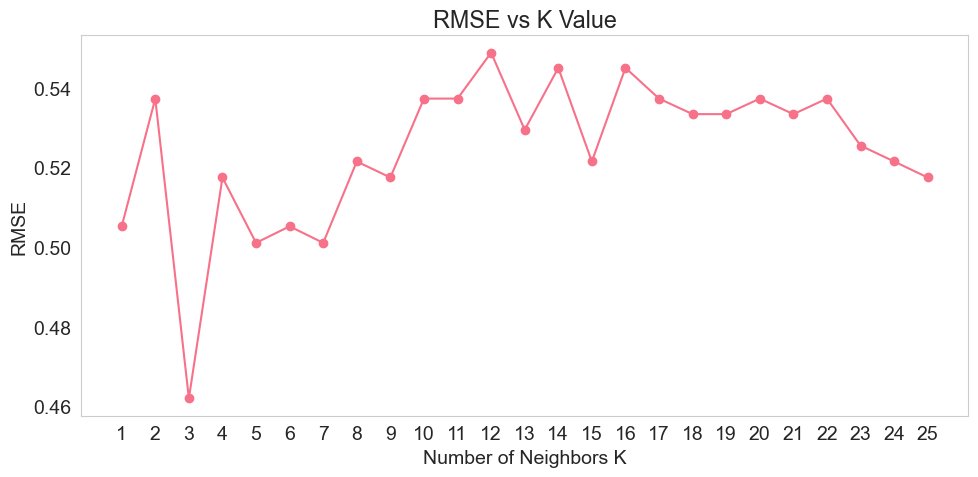

In [271]:
# Initialize a list to store RMSE values
rmse_val = []

# Loop to evaluate different values of k
for k in range(1, 26):  # k from 1 to 25
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, Y_train)  # Fit the model
    y_pred = model.predict(X_test)  # Make predictions
    error = sqrt(mean_squared_error(Y_test, y_pred))  # Calculate RMSE
    rmse_val.append(error)  # Store RMSE values
    print('RMSE value for k =', k, 'is:', error)

# Optional: Plotting the RMSE values for visualization
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(range(1, 26), rmse_val, marker='o')
plt.title('RMSE vs K Value')
plt.xlabel('Number of Neighbors K')
plt.ylabel('RMSE')
plt.xticks(range(1, 26))
plt.grid()
plt.show()

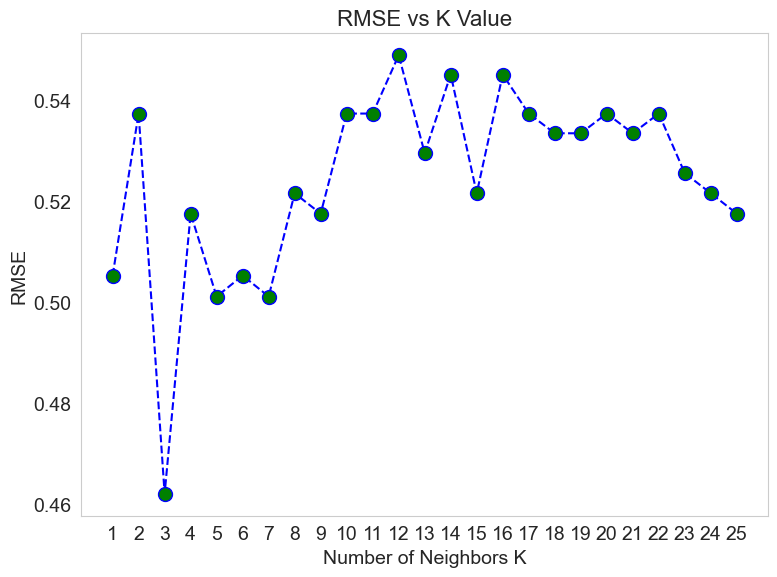

In [273]:
# Assuming rmse_val is already defined from the previous code
plt.figure(figsize=(8, 6))
plt.plot(range(1, 26), rmse_val, color='blue', linestyle='dashed', 
         marker='o', markerfacecolor='green', markersize=10)

plt.title('RMSE vs K Value', fontsize=16)
plt.xlabel('Number of Neighbors K', fontsize=14)
plt.ylabel('RMSE', fontsize=14)
plt.xticks(range(1, 26))
plt.grid()
plt.show()

Classification ML Algorithm Evaluation Matrix for SVC(probability=True) is


Accuracy Score :
 0.7364016736401674


Confusion matrix : 
 [[ 67  47]
 [ 16 109]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.81      0.59      0.68       114
           1       0.70      0.87      0.78       125

    accuracy                           0.74       239
   macro avg       0.75      0.73      0.73       239
weighted avg       0.75      0.74      0.73       239





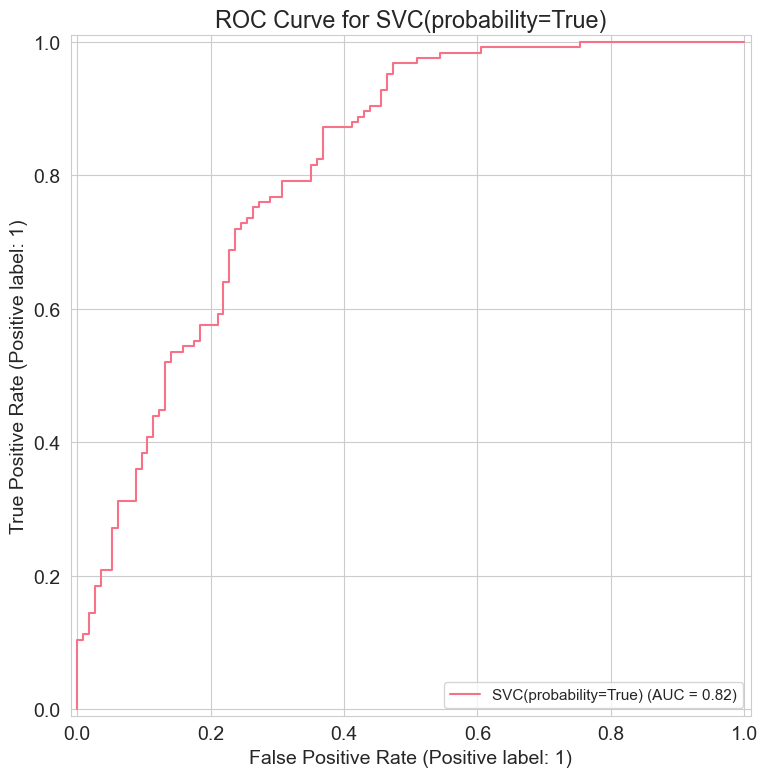

Classification ML Algorithm Evaluation Matrix for GaussianNB() is


Accuracy Score :
 0.7196652719665272


Confusion matrix : 
 [[ 59  55]
 [ 12 113]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.83      0.52      0.64       114
           1       0.67      0.90      0.77       125

    accuracy                           0.72       239
   macro avg       0.75      0.71      0.70       239
weighted avg       0.75      0.72      0.71       239





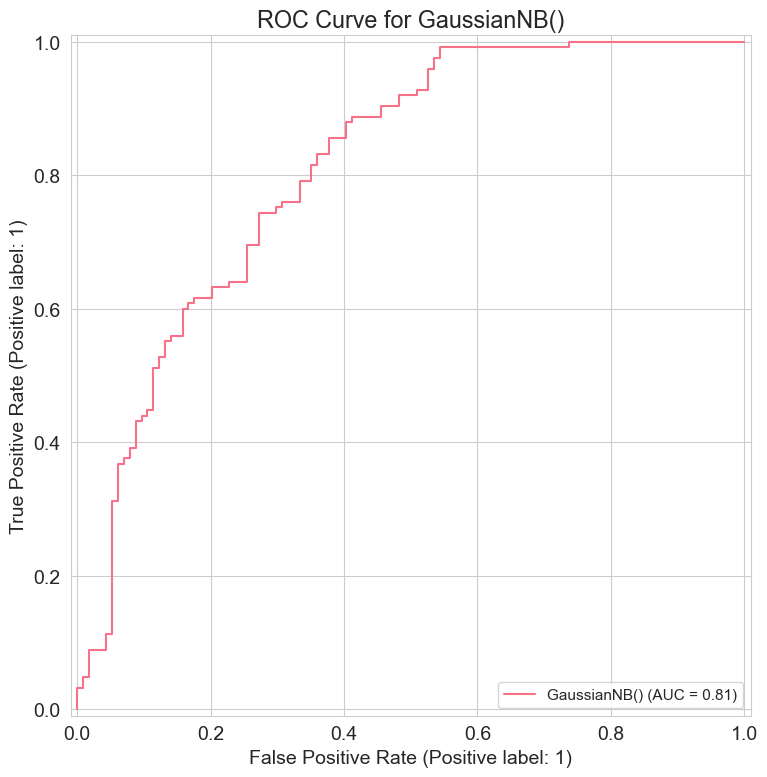

Classification ML Algorithm Evaluation Matrix for DecisionTreeClassifier() is


Accuracy Score :
 0.7656903765690377


Confusion matrix : 
 [[89 25]
 [31 94]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.74      0.78      0.76       114
           1       0.79      0.75      0.77       125

    accuracy                           0.77       239
   macro avg       0.77      0.77      0.77       239
weighted avg       0.77      0.77      0.77       239





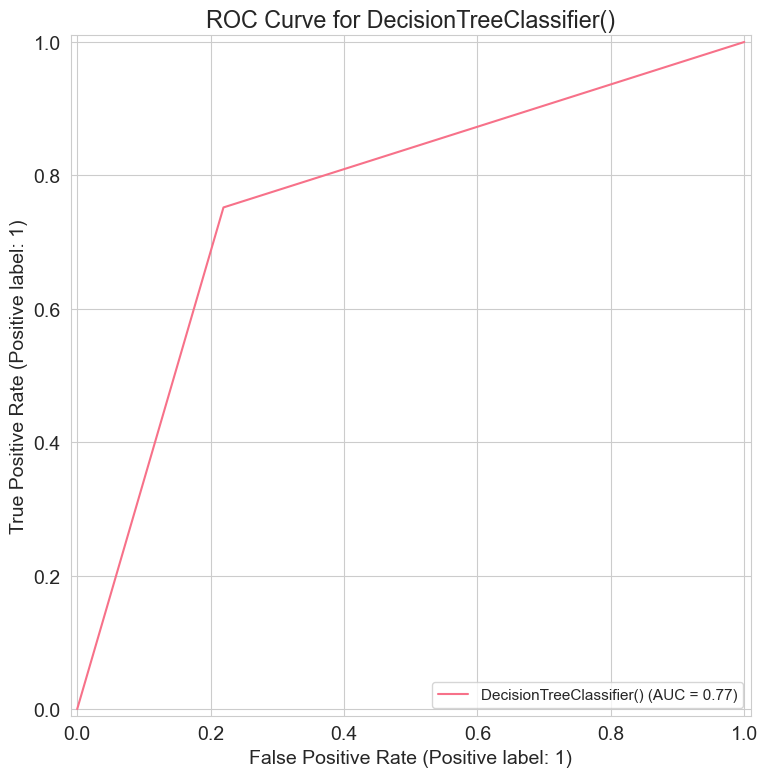

Classification ML Algorithm Evaluation Matrix for KNeighborsClassifier(n_neighbors=3) is


Accuracy Score :
 0.7866108786610879


Confusion matrix : 
 [[ 87  27]
 [ 24 101]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.78      0.76      0.77       114
           1       0.79      0.81      0.80       125

    accuracy                           0.79       239
   macro avg       0.79      0.79      0.79       239
weighted avg       0.79      0.79      0.79       239





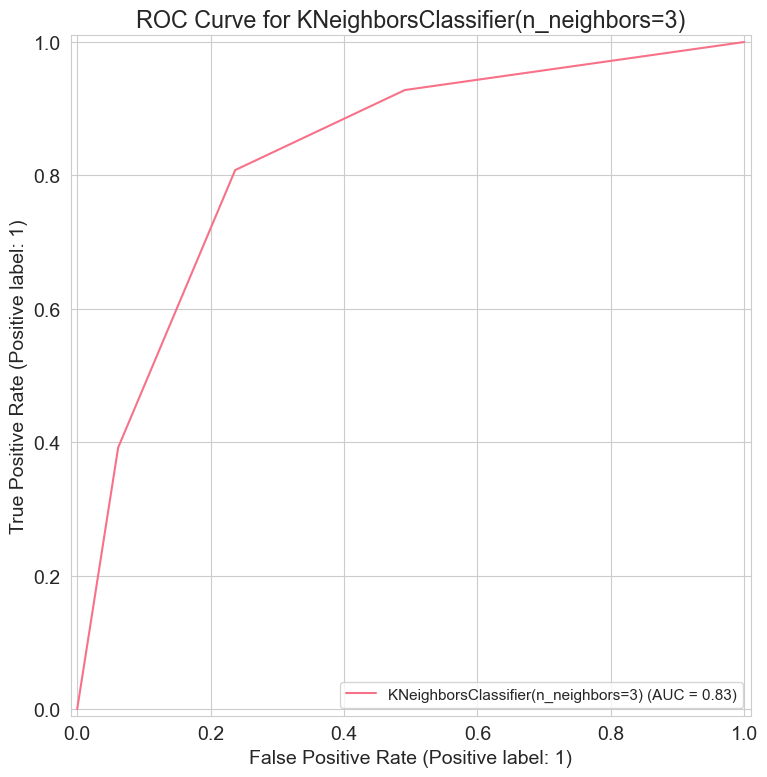

Classification ML Algorithm Evaluation Matrix for RandomForestClassifier() is


Accuracy Score :
 0.8326359832635983


Confusion matrix : 
 [[ 88  26]
 [ 14 111]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.86      0.77      0.81       114
           1       0.81      0.89      0.85       125

    accuracy                           0.83       239
   macro avg       0.84      0.83      0.83       239
weighted avg       0.84      0.83      0.83       239





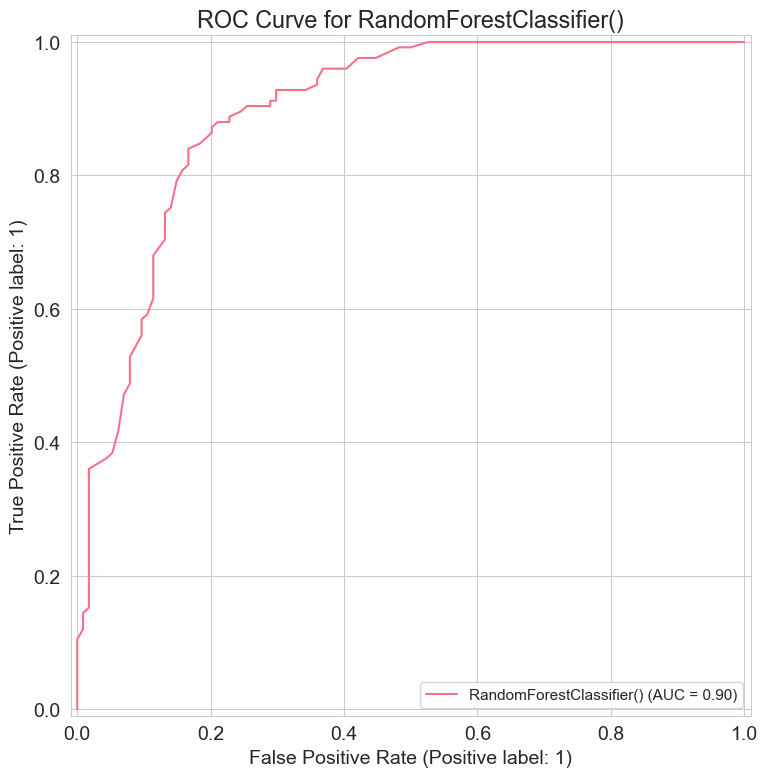

Classification ML Algorithm Evaluation Matrix for ExtraTreesClassifier() is


Accuracy Score :
 0.8075313807531381


Confusion matrix : 
 [[ 91  23]
 [ 23 102]]


Classification Report : 
               precision    recall  f1-score   support

           0       0.80      0.80      0.80       114
           1       0.82      0.82      0.82       125

    accuracy                           0.81       239
   macro avg       0.81      0.81      0.81       239
weighted avg       0.81      0.81      0.81       239





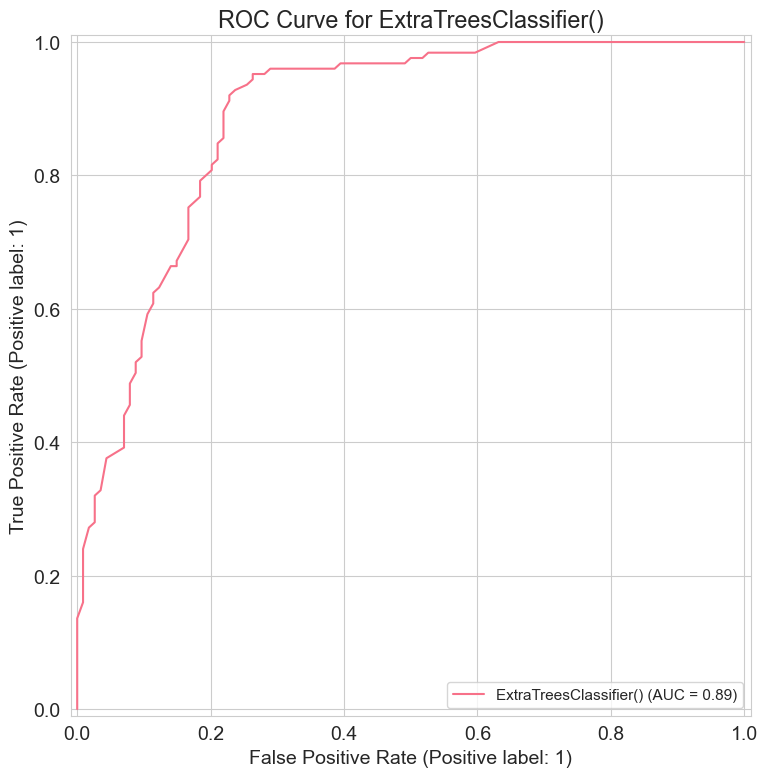

In [275]:
models = [
    SVC(probability=True),  # Enable probability estimates for ROC curve
    GaussianNB(),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=3),
    RandomForestClassifier(),
    ExtraTreesClassifier()
]

for m in models:
    m.fit(X_train, Y_train)
    y_pred = m.predict(X_test)
    
    print('\033[1m' + 'Classification ML Algorithm Evaluation Matrix for ' + str(m) + ' is' + '\033[0m')
    print('\n')
    print('\033[1m' + 'Accuracy Score :' + '\033[0m\n', accuracy_score(Y_test, y_pred))
    print('\n')
    print('\033[1m' + 'Confusion matrix :' + '\033[0m \n', confusion_matrix(Y_test, y_pred))
    print('\n')
    print('\033[1m' + 'Classification Report :' + '\033[0m \n', classification_report(Y_test, y_pred))
    print('\n')
    
    # Plot ROC Curve
    RocCurveDisplay.from_estimator(m, X_test, Y_test, ax=plt.gca(), name=str(m))
    plt.title(f'ROC Curve for {str(m)}')
    plt.legend(prop={'size': 11}, loc='lower right')
    plt.show()
    
    print('============================================================================================================')

In [277]:
from sklearn.model_selection import cross_val_score
model=[LogisticRegression(),
        SVC(),
        GaussianNB(),
        DecisionTreeClassifier(),
        KNeighborsClassifier(n_neighbors = 3),
        RandomForestClassifier(),
        ExtraTreesClassifier()]

for m in model:
    score = cross_val_score(m, X_scale, Y_resampled, cv =5)
    print('\n')
    print('\033[1m'+'Cross Validation Score', m, ':'+'\033[0m\n')
    print("Score :" ,score)
    print("Mean Score :",score.mean())
    print("Std deviation :",score.std())
    print('\n')
    print('============================================================================================================')



Cross Validation Score LogisticRegression() :

Score : [0.67924528 0.67295597 0.74213836 0.73584906 0.75316456]
Mean Score : 0.7166706472414617
Std deviation : 0.033644767614285594




Cross Validation Score SVC() :

Score : [0.71069182 0.74213836 0.77987421 0.77987421 0.77848101]
Mean Score : 0.7582119258020857
Std deviation : 0.02780598775994457




Cross Validation Score GaussianNB() :

Score : [0.66666667 0.6918239  0.75471698 0.73584906 0.75949367]
Mean Score : 0.7217100549319322
Std deviation : 0.03644153417724658




Cross Validation Score DecisionTreeClassifier() :

Score : [0.74842767 0.72327044 0.79874214 0.74213836 0.77848101]
Mean Score : 0.7582119258020859
Std deviation : 0.02693893981776988




Cross Validation Score KNeighborsClassifier(n_neighbors=3) :

Score : [0.76100629 0.70440252 0.77987421 0.77987421 0.78481013]
Mean Score : 0.7619934718573361
Std deviation : 0.029925689158673614




Cross Validation Score RandomForestClassifier() :

Score : [0.77358491 0.7924528

In [280]:
parameter = {  'bootstrap': [True], 'max_depth': [5, 10,20,40,50,60], 
              'max_features': ['auto', 'log2'], 
              'criterion':['gini','entropy'],
              'n_estimators': [5, 10, 15 ,25,50,60,70]}

In [284]:
grid_search = GridSearchCV(RandomForestClassifier(),parameter,verbose=10)
grid_search.fit(X_train,Y_train)

Fitting 5 folds for each of 168 candidates, totalling 840 fits
[CV 1/5; 1/168] START bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5
[CV 1/5; 1/168] END bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5;, score=nan total time=   0.0s
[CV 2/5; 1/168] START bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5
[CV 2/5; 1/168] END bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5;, score=nan total time=   0.0s
[CV 3/5; 1/168] START bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5
[CV 3/5; 1/168] END bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5;, score=nan total time=   0.0s
[CV 4/5; 1/168] START bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5
[CV 4/5; 1/168] END bootstrap=True, criterion=gini, max_depth=5, max_features=auto, n_estimators=5;, score=nan total time=   0.0s
[CV 5/5; 1/16

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 20, 40, 50, 60],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [5, 10, 15, 25, 50, 60, 70]},
             verbose=10)

[CV 4/5; 87/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=15;, score=0.712 total time=   0.0s
[CV 5/5; 87/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=15
[CV 5/5; 87/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=15;, score=0.757 total time=   0.0s
[CV 1/5; 88/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=25
[CV 1/5; 88/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=25;, score=0.759 total time=   0.0s
[CV 2/5; 88/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=25
[CV 2/5; 88/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=25;, score=0.759 total time=   0.0s
[CV 3/5; 88/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=auto, n_estimators=25
[CV 3/5; 88/168] END bootstr

[CV 5/5; 94/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=25;, score=0.757 total time=   0.0s
[CV 1/5; 95/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50
[CV 1/5; 95/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50;, score=0.759 total time=   0.0s
[CV 2/5; 95/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50
[CV 2/5; 95/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50;, score=0.750 total time=   0.0s
[CV 3/5; 95/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50
[CV 3/5; 95/168] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50;, score=0.793 total time=   0.0s
[CV 4/5; 95/168] START bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, n_estimators=50
[CV 4/5; 95/168] END bootstr

[CV 4/5; 101/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=50;, score=0.784 total time=   0.2s
[CV 5/5; 101/168] START bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=50
[CV 5/5; 101/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=50;, score=0.775 total time=   0.1s
[CV 1/5; 102/168] START bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=100
[CV 1/5; 102/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=100;, score=0.759 total time=   0.4s
[CV 2/5; 102/168] START bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=100
[CV 2/5; 102/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=100;, score=0.777 total time=   0.4s
[CV 3/5; 102/168] START bootstrap=True, criterion=entropy, max_depth=10, max_features=auto, n_estimators=100
[CV 3/5

[CV 3/5; 108/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, n_estimators=100;, score=0.829 total time=   0.2s
[CV 4/5; 108/168] START bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, n_estimators=100
[CV 4/5; 108/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, n_estimators=100;, score=0.766 total time=   0.2s
[CV 5/5; 108/168] START bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, n_estimators=100
[CV 5/5; 108/168] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, n_estimators=100;, score=0.766 total time=   0.2s
[CV 1/5; 109/168] START bootstrap=True, criterion=entropy, max_depth=20, max_features=auto, n_estimators=5
[CV 1/5; 109/168] END bootstrap=True, criterion=entropy, max_depth=20, max_features=auto, n_estimators=5;, score=0.750 total time=   0.0s
[CV 2/5; 109/168] START bootstrap=True, criterion=entropy, max_depth=20, max_features=auto, n_estimators=5
[CV 2/5; 1

[CV 2/5; 116/168] END bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10;, score=0.732 total time=   0.0s
[CV 3/5; 116/168] START bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10
[CV 3/5; 116/168] END bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10;, score=0.775 total time=   0.0s
[CV 4/5; 116/168] START bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10
[CV 4/5; 116/168] END bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10;, score=0.739 total time=   0.0s
[CV 5/5; 116/168] START bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10
[CV 5/5; 116/168] END bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=10;, score=0.775 total time=   0.0s
[CV 1/5; 117/168] START bootstrap=True, criterion=entropy, max_depth=20, max_features=log2, n_estimators=15
[CV 1/5; 117

[CV 2/5; 123/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15;, score=0.750 total time=   0.0s
[CV 3/5; 123/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15
[CV 3/5; 123/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15;, score=0.802 total time=   0.0s
[CV 4/5; 123/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15
[CV 4/5; 123/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15;, score=0.766 total time=   0.0s
[CV 5/5; 123/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15
[CV 5/5; 123/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=15;, score=0.766 total time=   0.0s
[CV 1/5; 124/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=auto, n_estimators=25
[CV 1/5; 124

[CV 2/5; 130/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25;, score=0.750 total time=   0.0s
[CV 3/5; 130/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25
[CV 3/5; 130/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25;, score=0.793 total time=   0.0s
[CV 4/5; 130/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25
[CV 4/5; 130/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25;, score=0.793 total time=   0.0s
[CV 5/5; 130/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25
[CV 5/5; 130/168] END bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=25;, score=0.766 total time=   0.0s
[CV 1/5; 131/168] START bootstrap=True, criterion=entropy, max_depth=40, max_features=log2, n_estimators=50
[CV 1/5; 131

[CV 2/5; 137/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50;, score=0.741 total time=   0.1s
[CV 3/5; 137/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50
[CV 3/5; 137/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50;, score=0.811 total time=   0.1s
[CV 4/5; 137/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50
[CV 4/5; 137/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50;, score=0.784 total time=   0.2s
[CV 5/5; 137/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50
[CV 5/5; 137/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=50;, score=0.775 total time=   0.1s
[CV 1/5; 138/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=auto, n_estimators=100
[CV 1/5; 13

[CV 1/5; 144/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100;, score=0.795 total time=   0.4s
[CV 2/5; 144/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100
[CV 2/5; 144/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100;, score=0.786 total time=   0.2s
[CV 3/5; 144/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100
[CV 3/5; 144/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100;, score=0.820 total time=   0.2s
[CV 4/5; 144/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100
[CV 4/5; 144/168] END bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100;, score=0.793 total time=   0.2s
[CV 5/5; 144/168] START bootstrap=True, criterion=entropy, max_depth=50, max_features=log2, n_estimators=100
[CV 

[CV 5/5; 150/168] END bootstrap=True, criterion=entropy, max_depth=60, max_features=auto, n_estimators=100;, score=0.748 total time=   0.3s
[CV 1/5; 151/168] START bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5
[CV 1/5; 151/168] END bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5;, score=0.732 total time=   0.0s
[CV 2/5; 151/168] START bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5
[CV 2/5; 151/168] END bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5;, score=0.705 total time=   0.0s
[CV 3/5; 151/168] START bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5
[CV 3/5; 151/168] END bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5;, score=0.730 total time=   0.0s
[CV 4/5; 151/168] START bootstrap=True, criterion=entropy, max_depth=60, max_features=log2, n_estimators=5
[CV 4/5; 151/168] 

[CV 2/5; 158/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10;, score=0.741 total time=   0.0s
[CV 3/5; 158/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10
[CV 3/5; 158/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10;, score=0.820 total time=   0.0s
[CV 4/5; 158/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10
[CV 4/5; 158/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10;, score=0.820 total time=   0.0s
[CV 5/5; 158/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10
[CV 5/5; 158/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=10;, score=0.748 total time=   0.0s
[CV 1/5; 159/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=auto, n_estimators=15
[CV 1/5; 159

[CV 3/5; 165/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=15;, score=0.757 total time=   0.0s
[CV 4/5; 165/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=15
[CV 4/5; 165/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=15;, score=0.811 total time=   0.0s
[CV 5/5; 165/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=15
[CV 5/5; 165/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=15;, score=0.748 total time=   0.0s
[CV 1/5; 166/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=25
[CV 1/5; 166/168] END bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=25;, score=0.777 total time=   0.0s
[CV 2/5; 166/168] START bootstrap=True, criterion=entropy, max_depth=80, max_features=log2, n_estimators=25
[CV 2/5; 166

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 20, 40, 50, 60, 80],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [5, 10, 15, 25, 50, 100]},
             verbose=10)

In [286]:
grid_search.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'log2',
 'n_estimators': 70}

In [ ]:
# Define the final model with the chosen hyperparameters
Final_mod = RandomForestClassifier(
    bootstrap=True,
    criterion='entropy',
    n_estimators=70,
    max_depth=50,
    max_features='log2'
)

# Fit the model to the training data
Final_mod.fit(X_train, Y_train)

# Make predictions on the test set
y_pred = Final_mod.predict(X_test)

# Print the accuracy score
print('\033[1m' + 'Accuracy Score :' + '\033[0m\n', accuracy_score(Y_test, y_pred))

In [ ]:
# Create a RocCurveDisplay instance
RocCurveDisplay.from_estimator(Final_mod, X_test, Y_test)
plt.title('ROC Curve')
plt.legend(prop={'size': 11}, loc='lower right')
plt.show()

# Calculate AUC Score
auc_score = roc_auc_score(Y_test, Final_mod.predict_proba(X_test)[:, 1])
print('\033[1m' + 'AUC Score :' + '\033[0m\n', auc_score)

In [ ]:
# Save the model to a file
joblib.dump(Final_mod, 'Loan_Status_Final_model.pkl')